In [58]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [140]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import keras
import tensorflow
from tensorflow.keras import optimizers
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import KFold, train_test_split
from keras.models import Sequential
from keras.layers import Dense, LSTM
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import load_model
data = "kur8.csv"
df = pd.read_csv(data,sep=",", thousands=',',index_col = 0 ) 
df.dtypes

USDTRYav     float64
EURTRYav     float64
EURUSDav     float64
BIST100av    float64
TR2YTav      float64
              ...   
X32...478    float64
X33...479    float64
X34...480    float64
X35...481    float64
X36...482    float64
Length: 481, dtype: object

In [142]:
# df = df.diff()
df = df.dropna()
display(df)

,USDTRYav,EURTRYav,EURUSDav,BIST100av,TR2YTav,BRENTav,WTIav,Altinav,Gumusav,UFE,TUGE,Cari_Denge,Issizlik,X1...15,X2...16,X3...17,X4...18,X5...19,X6...20,X7...21,X8...22,X9...23,X10...24,X11...25,X12...26,X13...27,X14...28,X15...29,X16...30,X17...31,X18...32,X19...33,X20...34,X21...35,X22...36,X23...37,X24...38,X25...39,X26...40,X27...41,...,X33...443,X34...444,X35...445,X36...446,X1...447,X2...448,X3...449,X4...450,X5...451,X6...452,X7...453,X8...454,X9...455,X10...456,X11...457,X12...458,X13...459,X14...460,X15...461,X16...462,X17...463,X18...464,X19...465,X20...466,X21...467,X22...468,X23...469,X24...470,X25...471,X26...472,X27...473,X28...474,X29...475,X30...476,X31...477,X32...478,X33...479,X34...480,X35...481,X36...482
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2008/11,1.598465,2.033150,1.272515,252.248645,23.104000,54.746000,57.291000,759.420000,9.829500,12.25,10.76,-3.540000e+08,11.50,1.479904,1.242741,1.179929,1.209557,1.235781,1.246032,1.299895,1.247429,1.195038,1.174326,1.179476,1.191273,1.195957,1.257275,1.313100,1.277577,1.317667,1.332804,1.356638,1.406673,1.395405,1.423943,1.428743,1.456568,1.474582,1.481362,1.466991,...,-3.223000e+09,-2.435000e+09,-3.739000e+09,-2.554000e+09,10.6,10.2,9.8,10.0,9.6,9.2,9.1,9.3,9.5,9.2,9.2,9.4,9.4,9.3,9.2,9.2,9.2,9.1,9.1,8.9,9.0,8.8,8.9,8.7,8.7,8.8,9.0,9.0,9.0,8.8,9.2,9.2,9.6,9.5,9.7,9.8
2008/12,1.543600,2.088274,1.354278,250.940067,19.566250,58.778924,57.947457,824.302174,10.359565,8.11,10.06,-3.039000e+09,12.00,1.598465,1.479904,1.242741,1.179929,1.209557,1.235781,1.246032,1.299895,1.247429,1.195038,1.174326,1.179476,1.191273,1.195957,1.257275,1.313100,1.277577,1.317667,1.332804,1.356638,1.406673,1.395405,1.423943,1.428743,1.456568,1.474582,1.481362,...,-3.054000e+09,-3.223000e+09,-2.435000e+09,-3.739000e+09,11.5,10.6,10.2,9.8,10.0,9.6,9.2,9.1,9.3,9.5,9.2,9.2,9.4,9.4,9.3,9.2,9.2,9.2,9.1,9.1,8.9,9.0,8.8,8.9,8.7,8.7,8.8,9.0,9.0,9.0,8.8,9.2,9.2,9.6,9.5,9.7
2009/01,1.603355,2.126491,1.328064,245.385506,15.675159,51.081636,52.676409,861.606818,11.377727,7.90,9.50,-3.300000e+08,12.60,1.543600,1.598465,1.479904,1.242741,1.179929,1.209557,1.235781,1.246032,1.299895,1.247429,1.195038,1.174326,1.179476,1.191273,1.195957,1.257275,1.313100,1.277577,1.317667,1.332804,1.356638,1.406673,1.395405,1.423943,1.428743,1.456568,1.474582,...,-3.745000e+09,-3.054000e+09,-3.223000e+09,-2.435000e+09,12.0,11.5,10.6,10.2,9.8,10.0,9.6,9.2,9.1,9.3,9.5,9.2,9.2,9.4,9.4,9.3,9.2,9.2,9.2,9.1,9.1,8.9,9.0,8.8,8.9,8.7,8.7,8.8,9.0,9.0,9.0,8.8,9.2,9.2,9.6,9.5
2009/02,1.664355,2.129380,1.280015,249.631490,16.028500,43.873500,39.171000,941.205000,13.416500,6.43,7.73,-1.500000e+08,13.00,1.603355,1.543600,1.598465,1.479904,1.242741,1.179929,1.209557,1.235781,1.246032,1.299895,1.247429,1.195038,1.174326,1.179476,1.191273,1.195957,1.257275,1.313100,1.277577,1.317667,1.332804,1.356638,1.406673,1.395405,1.423943,1.428743,1.456568,...,-4.035000e+09,-3.745000e+09,-3.054000e+09,-3.223000e+09,12.6,12.0,11.5,10.6,10.2,9.8,10.0,9.6,9.2,9.1,9.3,9.5,9.2,9.2,9.4,9.4,9.3,9.2,9.2,9.2,9.1,9.1,8.9,9.0,8.8,8.9,8.7,8.7,8.8,9.0,9.0,9.0,8.8,9.2,9.2,9.6
2009/03,1.708718,2.231668,1.307277,241.139523,15.321818,47.417273,48.061818,925.590909,13.108636,3.46,7.89,-1.080000e+09,13.60,1.664355,1.603355,1.543600,1.598465,1.479904,1.242741,1.179929,1.209557,1.235781,1.246032,1.299895,1.247429,1.195038,1.174326,1.179476,1.191273,1.195957,1.257275,1.313100,1.277577,1.317667,1.332804,1.356638,1.406673,1.395405,1.423943,1.428743,...,-2.687000e+09,-4.035000e+09,-3.745000e+09,-3.054000e+09,13.0,12.6,12.0,11.5,10.6,10.2,9.8,10.0,9.6,9.2,9.1,9.3,9.5,9.2,9.2,9.4,9.4,9.3,9.2,9.2,9.2,9.1,9.1,8.9,9.0,8.8,8.9,8.7,8.7,8.8,9.0,9.0,9.0,8.8,9.2,9.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [143]:
X = df.drop('EURTRYav', axis=1)
Y = df['EURTRYav']

features_scaler = MinMaxScaler()
X = features_scaler.fit_transform(X)
X = X.reshape(X.shape[0], 1, X.shape[1])

label_scaler = MinMaxScaler()
Y = Y.values.reshape(-1, 1)
Y = label_scaler.fit_transform(Y)


In [144]:
def grid_search(LSTM_unit, lr, epoch, batch_size, saving_dir,
                X_train, X_val, y_train, y_val):
  model_name = " ".join([str(LSTM_unit), str(lr), str(epoch), str(batch_size)])
  model = Sequential()
  model.add(LSTM(units=LSTM_unit, return_sequences=True,
                 input_shape=X.shape[1:]))
  model.add(LSTM(units=LSTM_unit, return_sequences=False))
  model.add(Dense(units=25))
  model.add(Dense(units=1))
  opt = tensorflow.keras.optimizers.RMSprop(learning_rate=lr)
  cb = [ModelCheckpoint(
        filepath=saving_dir+"{} CP.hdf5".format(model_name),
        verbose=0, save_best_only=True)]
  model.compile(optimizer=opt, loss='mean_squared_error', metrics=['accuracy'])
  # Fit the model

  model_result = model.fit(X_train, y_train, epochs=epoch, callbacks = cb,
                           validation_split = 0.2, batch_size=batch_size, 
                           verbose = 0)

  model.load_weights(saving_dir+"{} CP.hdf5".format(model_name))
  train_loss, train_acc = model.evaluate(X_train, y_train, verbose=1)
  val_loss, val_acc = model.evaluate(X_val, y_val, verbose=1)
  print("\n\n")
  print("="*80)
  print("Evaluation on the best model")
  print('Train Loss: %.3f \nTest Loss: %.3f' % (train_loss, val_loss))
  print("="*80, "\n")
  #Plot/Create the data for the graph
  plt.figure(figsize=(10,5))

  plt.plot(model_result.history['loss'], label='train')
  plt.plot(model_result.history['val_loss'], label='test')
  plt.title('Turkey Exchange Rate Prediction')

  plt.ylabel('Exchange Rate')
  plt.legend()
  plt.show()

  model.save(saving_dir+"{}.h5".format(model_name))
  return train_loss, val_loss

Result for LSTM Unit = 8, Batch Size = 10, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 18ms/step - loss: 8.7909e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



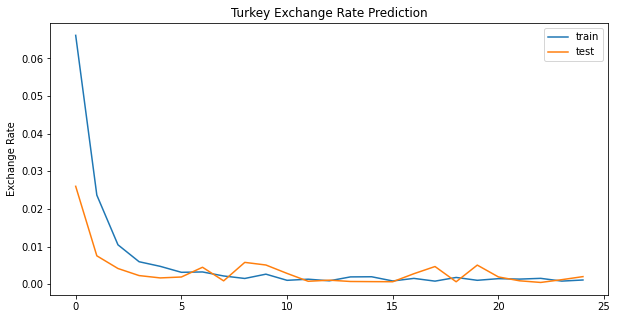

Result for LSTM Unit = 8, Batch Size = 10, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 17ms/step - loss: 0.0116 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.004 
Test Loss: 0.012



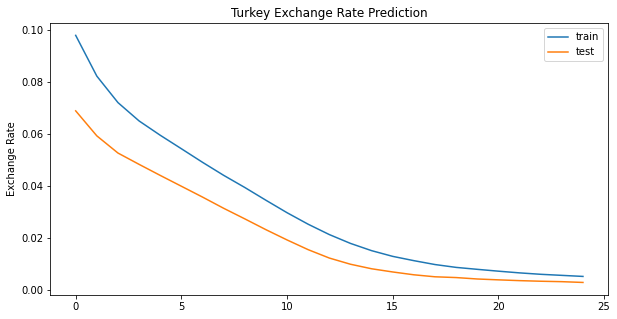

Result for LSTM Unit = 8, Batch Size = 10, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 16ms/step - loss: 0.1544 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.083 
Test Loss: 0.154



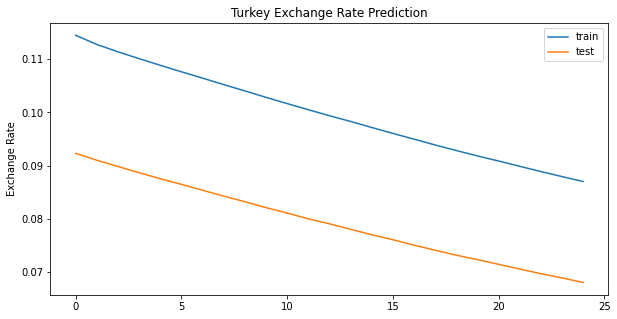

Result for LSTM Unit = 8, Batch Size = 10, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 18ms/step - loss: 6.5032e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



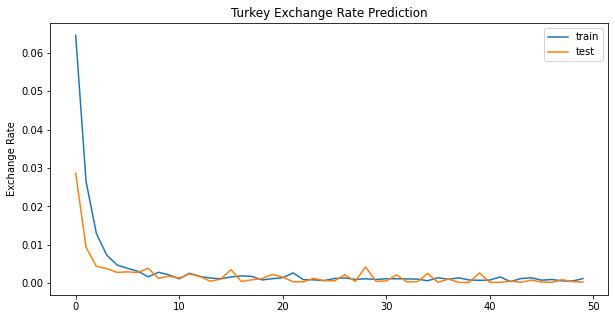

Result for LSTM Unit = 8, Batch Size = 10, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 18ms/step - loss: 0.0069 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.007



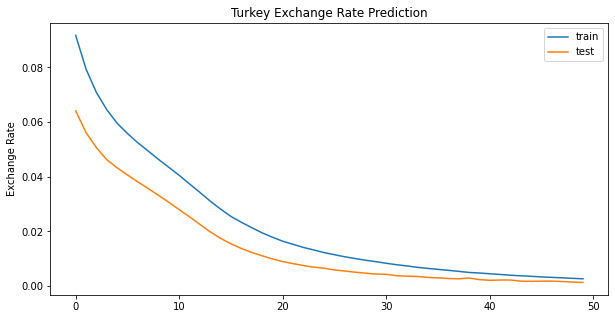

Result for LSTM Unit = 8, Batch Size = 10, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 17ms/step - loss: 0.1321 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.069 
Test Loss: 0.132



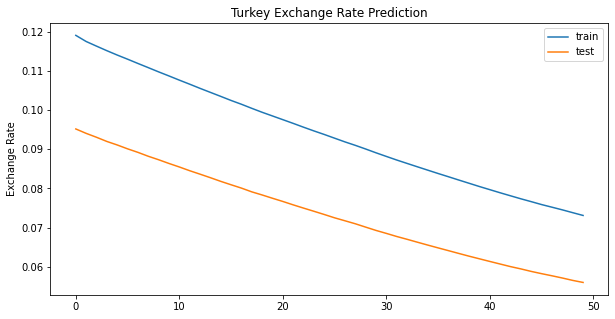

Result for LSTM Unit = 8, Batch Size = 10, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 18ms/step - loss: 4.7460e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



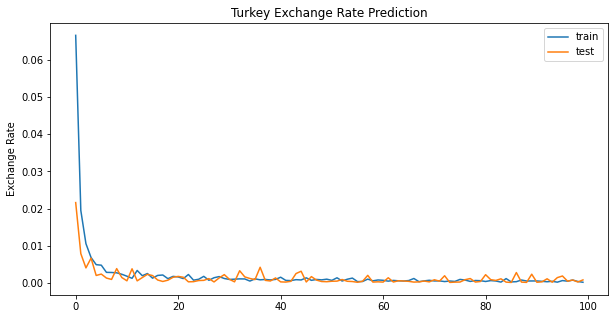

Result for LSTM Unit = 8, Batch Size = 10, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 17ms/step - loss: 0.0017 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



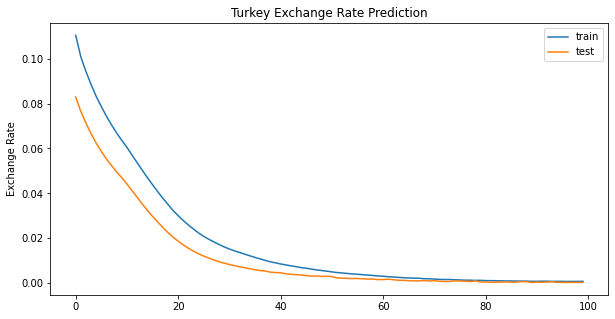

Result for LSTM Unit = 8, Batch Size = 10, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 19ms/step - loss: 0.1011 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.052 
Test Loss: 0.101



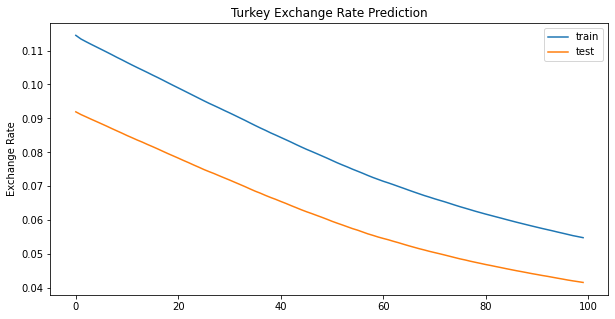

Result for LSTM Unit = 8, Batch Size = 10, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 19ms/step - loss: 6.3698e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



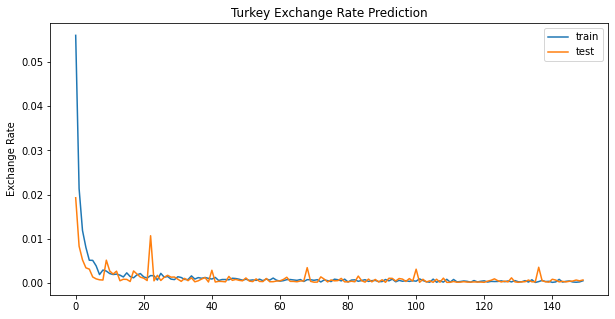

Result for LSTM Unit = 8, Batch Size = 10, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 20ms/step - loss: 3.9717e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



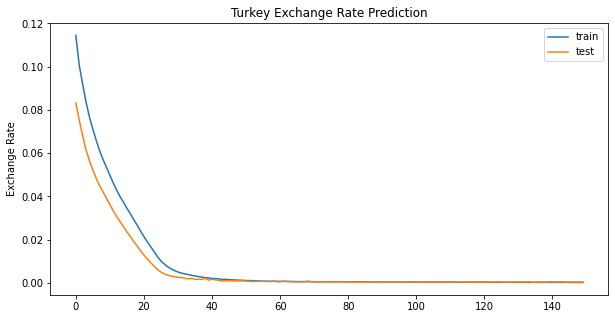

Result for LSTM Unit = 8, Batch Size = 10, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 18ms/step - loss: 0.0590 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.028 
Test Loss: 0.059



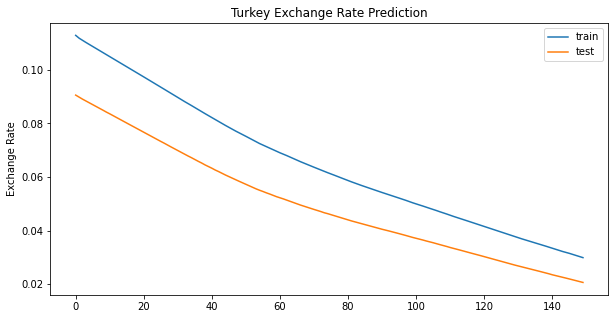

Result for LSTM Unit = 8, Batch Size = 10, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 18ms/step - loss: 4.2464e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



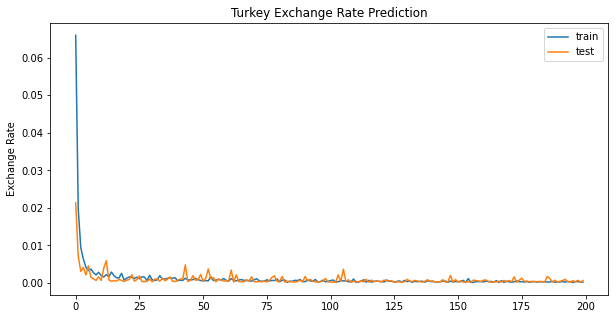

Result for LSTM Unit = 8, Batch Size = 10, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 21ms/step - loss: 8.2915e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



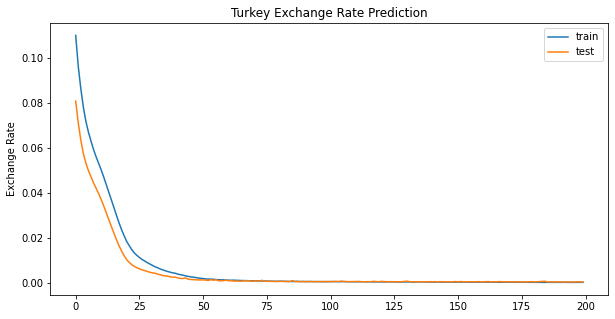

Result for LSTM Unit = 8, Batch Size = 10, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 20ms/step - loss: 0.0455 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.019 
Test Loss: 0.045



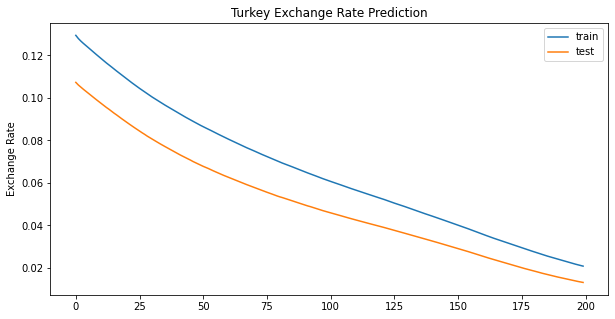

Result for LSTM Unit = 8, Batch Size = 10, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 23ms/step - loss: 3.4227e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



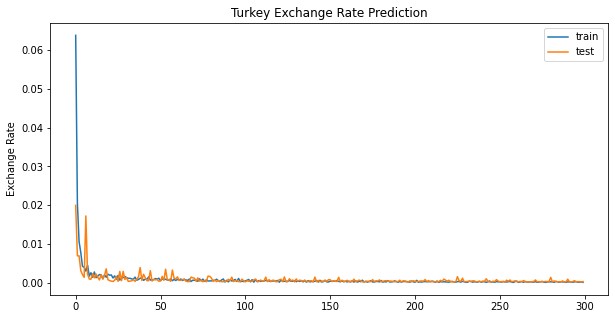

Result for LSTM Unit = 8, Batch Size = 10, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 18ms/step - loss: 5.4943e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



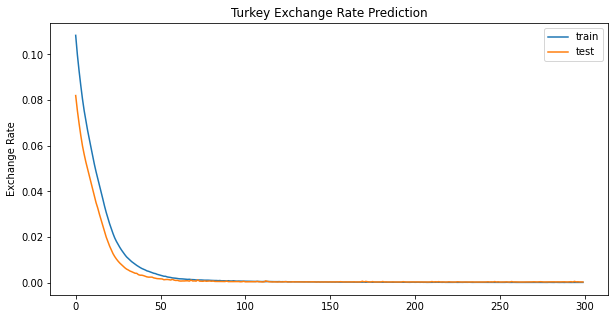

Result for LSTM Unit = 8, Batch Size = 10, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 24ms/step - loss: 0.0182 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.006 
Test Loss: 0.018



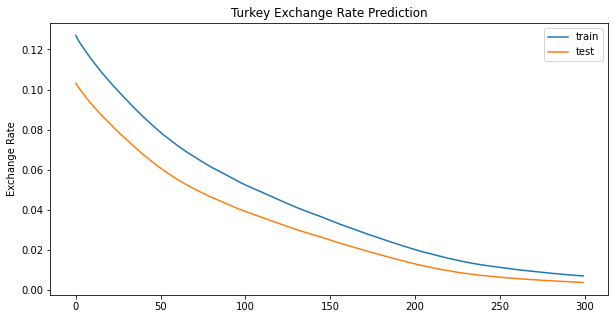

Result for LSTM Unit = 8, Batch Size = 20, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 17ms/step - loss: 0.0024 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



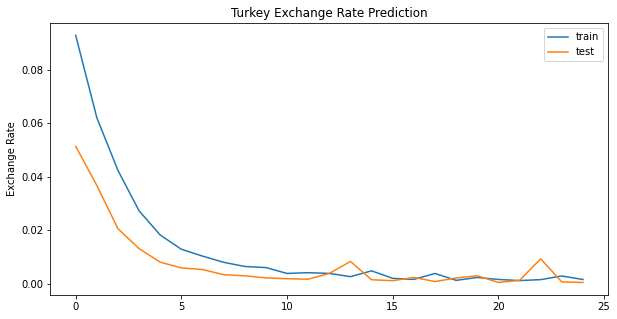

Result for LSTM Unit = 8, Batch Size = 20, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 17ms/step - loss: 0.0796 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.040 
Test Loss: 0.080



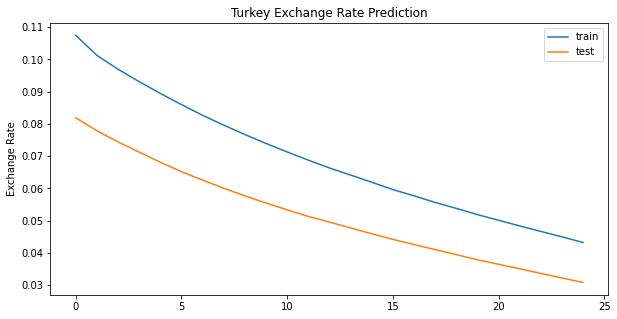

Result for LSTM Unit = 8, Batch Size = 20, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 17ms/step - loss: 0.1743 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.095 
Test Loss: 0.174



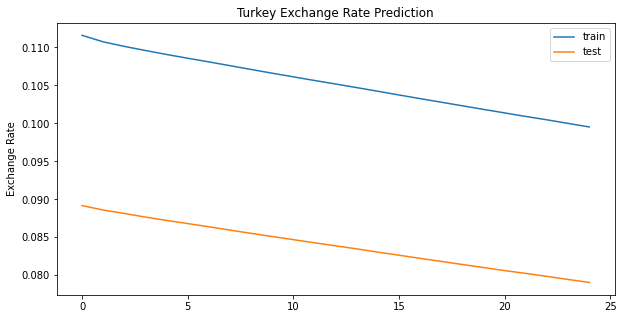

Result for LSTM Unit = 8, Batch Size = 20, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 18ms/step - loss: 0.0014 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



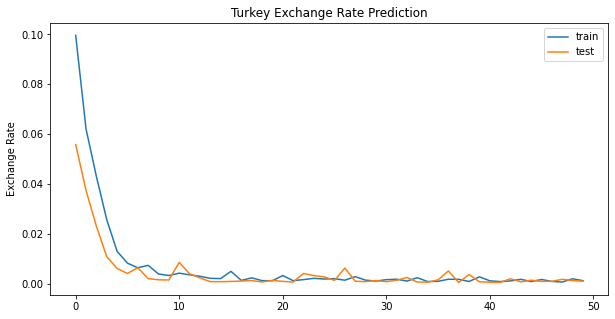

Result for LSTM Unit = 8, Batch Size = 20, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 18ms/step - loss: 0.0238 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.009 
Test Loss: 0.024



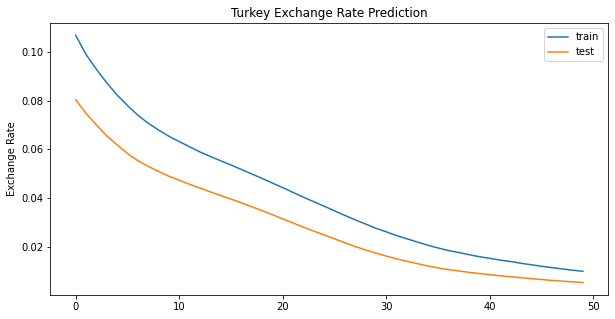

Result for LSTM Unit = 8, Batch Size = 20, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 18ms/step - loss: 0.1645 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.089 
Test Loss: 0.165



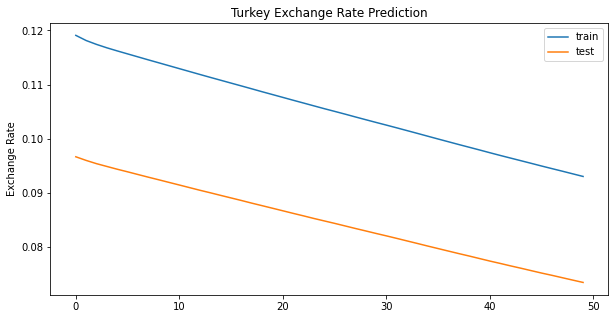

Result for LSTM Unit = 8, Batch Size = 20, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 18ms/step - loss: 5.5564e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



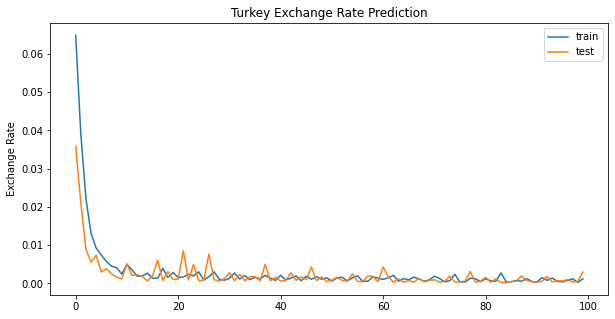

Result for LSTM Unit = 8, Batch Size = 20, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 18ms/step - loss: 0.0020 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



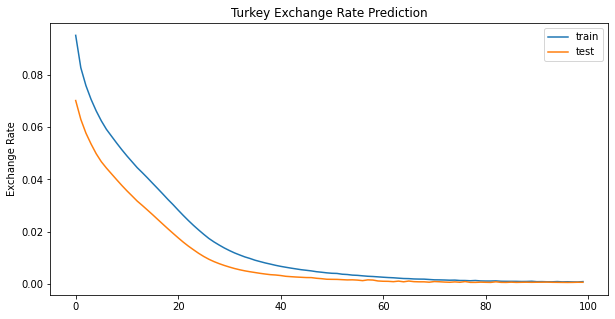

Result for LSTM Unit = 8, Batch Size = 20, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 19ms/step - loss: 0.1477 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.078 
Test Loss: 0.148



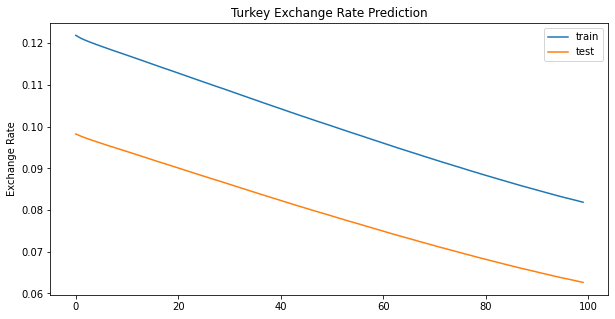

Result for LSTM Unit = 8, Batch Size = 20, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 22ms/step - loss: 7.0345e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



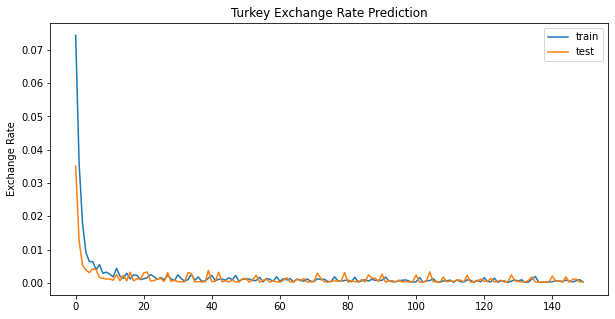

Result for LSTM Unit = 8, Batch Size = 20, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 21ms/step - loss: 0.0014 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



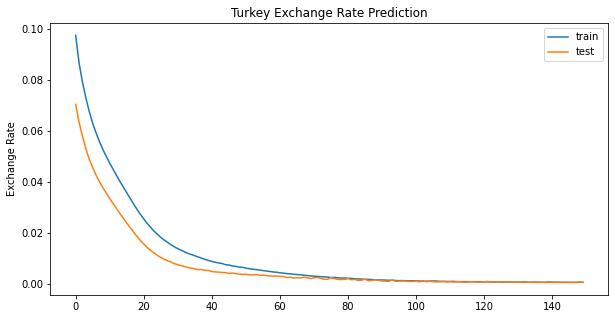

Result for LSTM Unit = 8, Batch Size = 20, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 22ms/step - loss: 0.1165 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.060 
Test Loss: 0.116



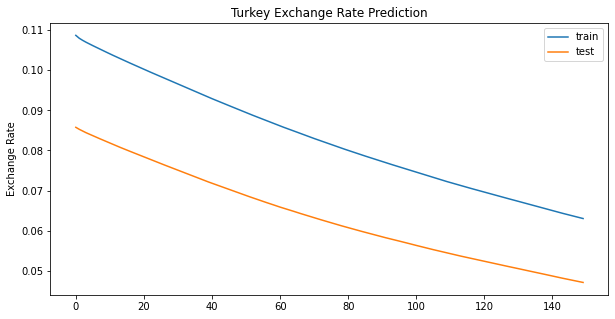

Result for LSTM Unit = 8, Batch Size = 20, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 19ms/step - loss: 3.2666e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



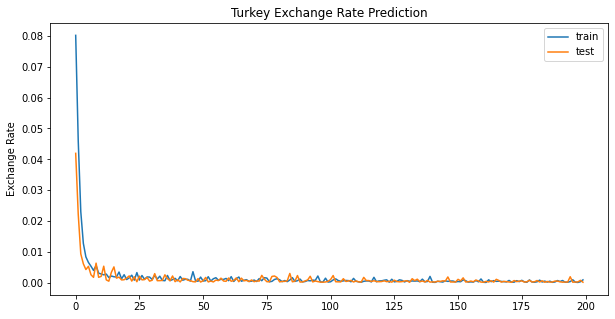

Result for LSTM Unit = 8, Batch Size = 20, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 18ms/step - loss: 9.7115e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



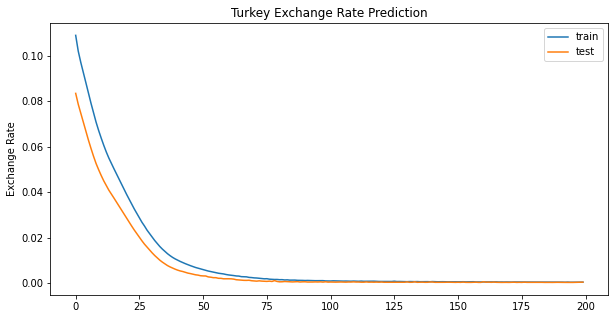

Result for LSTM Unit = 8, Batch Size = 20, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 22ms/step - loss: 0.0694 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.033 
Test Loss: 0.069



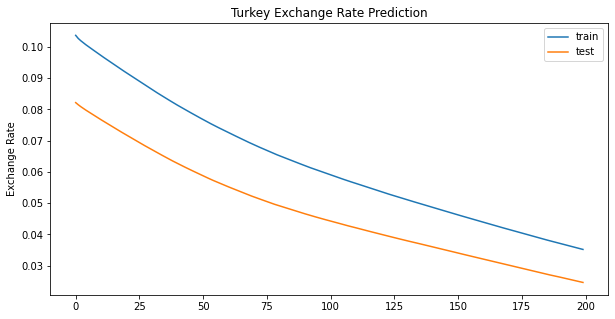

Result for LSTM Unit = 8, Batch Size = 20, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 18ms/step - loss: 4.5302e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



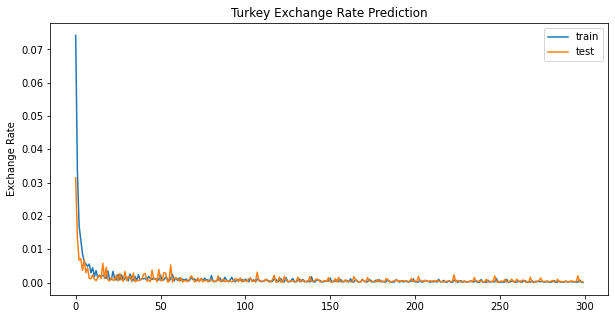

Result for LSTM Unit = 8, Batch Size = 20, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 19ms/step - loss: 5.1465e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



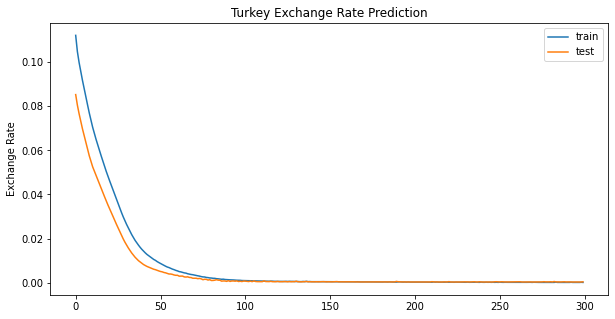

Result for LSTM Unit = 8, Batch Size = 20, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 22ms/step - loss: 0.0403 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.017 
Test Loss: 0.040



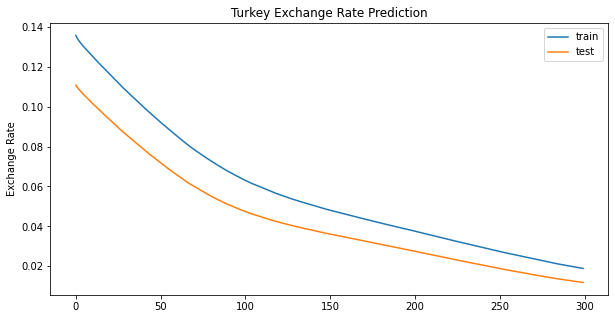

Result for LSTM Unit = 8, Batch Size = 50, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 18ms/step - loss: 0.0046 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.005



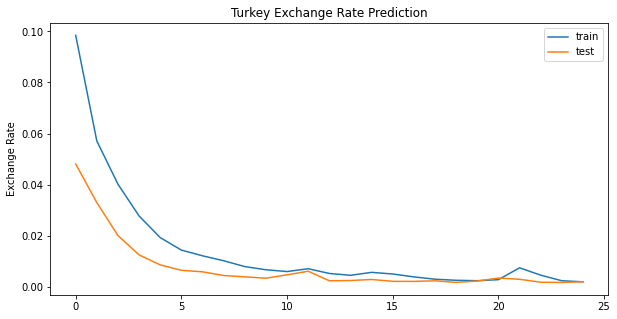

Result for LSTM Unit = 8, Batch Size = 50, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 18ms/step - loss: 0.1323 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.069 
Test Loss: 0.132



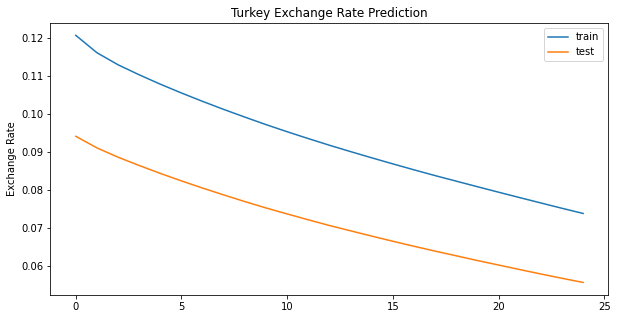

Result for LSTM Unit = 8, Batch Size = 50, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 17ms/step - loss: 0.1873 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.103 
Test Loss: 0.187



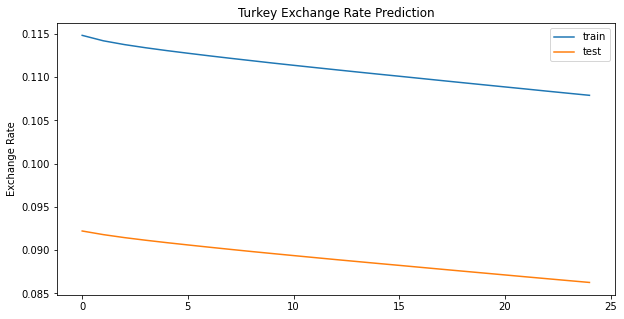

Result for LSTM Unit = 8, Batch Size = 50, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 17ms/step - loss: 0.0020 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



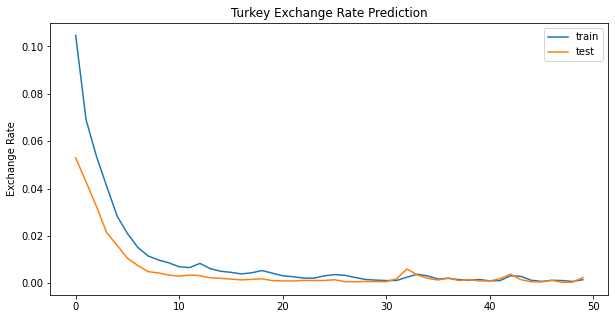

Result for LSTM Unit = 8, Batch Size = 50, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 17ms/step - loss: 0.0530 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.026 
Test Loss: 0.053



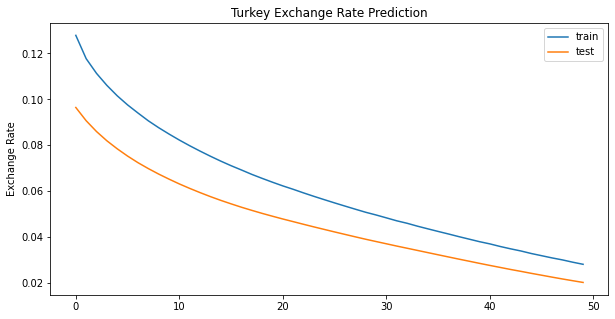

Result for LSTM Unit = 8, Batch Size = 50, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 21ms/step - loss: 0.1854 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.102 
Test Loss: 0.185



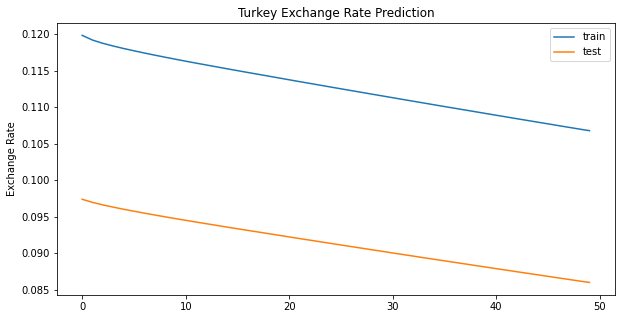

Result for LSTM Unit = 8, Batch Size = 50, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 16ms/step - loss: 9.1708e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



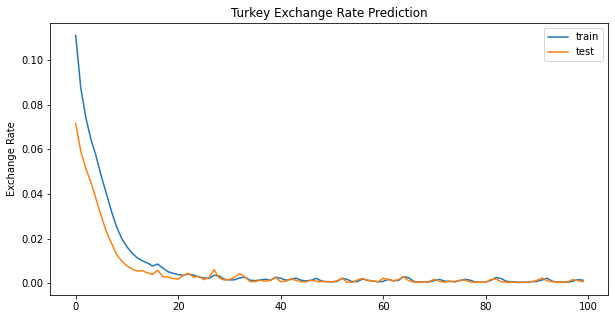

Result for LSTM Unit = 8, Batch Size = 50, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 17ms/step - loss: 0.0283 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.010 
Test Loss: 0.028



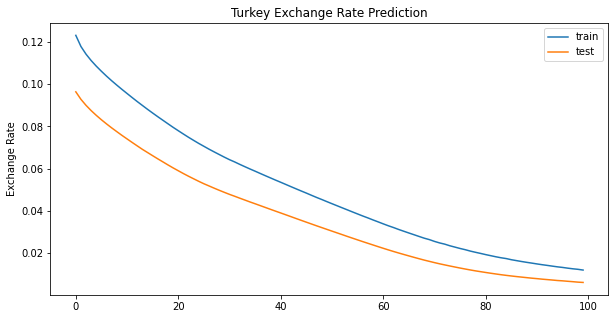

Result for LSTM Unit = 8, Batch Size = 50, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 17ms/step - loss: 0.1656 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.089 
Test Loss: 0.166



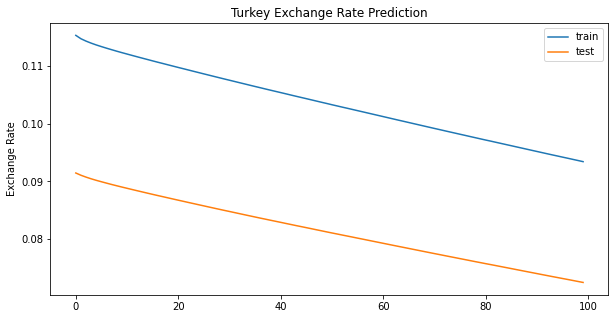

Result for LSTM Unit = 8, Batch Size = 50, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 19ms/step - loss: 6.5940e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



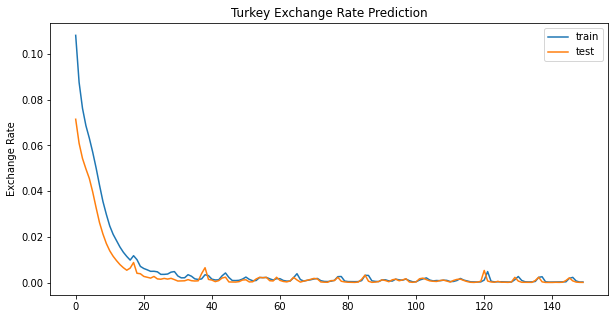

Result for LSTM Unit = 8, Batch Size = 50, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 18ms/step - loss: 0.0207 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.007 
Test Loss: 0.021



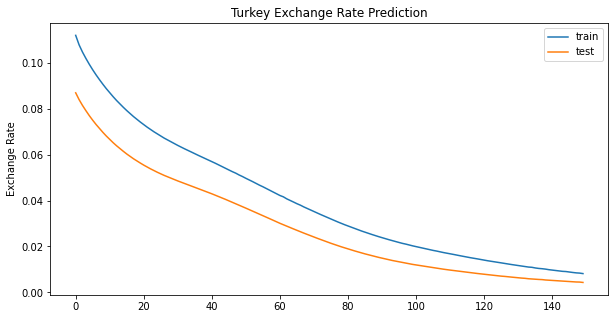

Result for LSTM Unit = 8, Batch Size = 50, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 17ms/step - loss: 0.1478 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.077 
Test Loss: 0.148



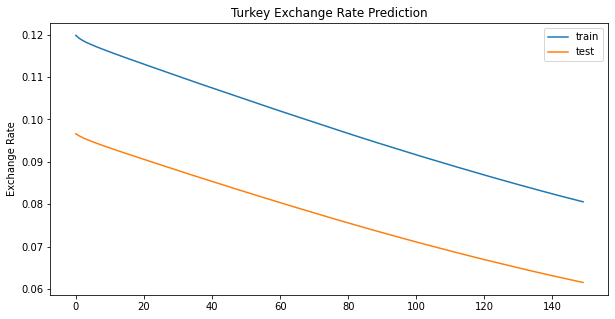

Result for LSTM Unit = 8, Batch Size = 50, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 17ms/step - loss: 7.5064e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



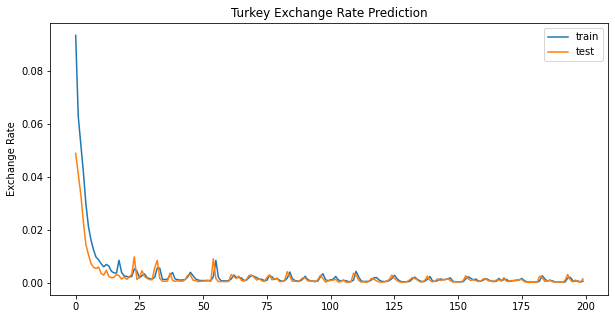

Result for LSTM Unit = 8, Batch Size = 50, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 24ms/step - loss: 0.0059 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.006



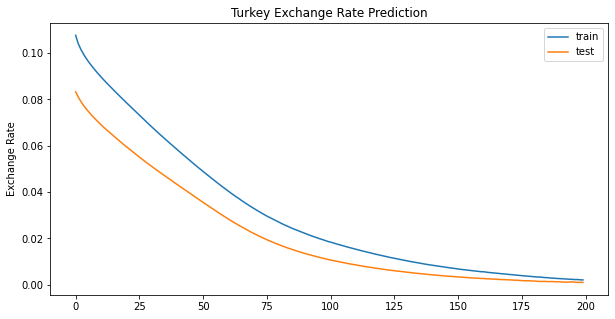

Result for LSTM Unit = 8, Batch Size = 50, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 27ms/step - loss: 0.1078 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.055 
Test Loss: 0.108



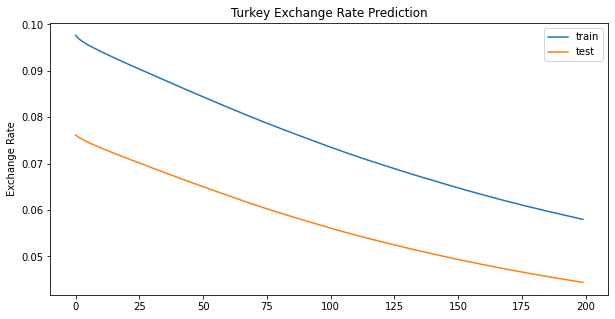

Result for LSTM Unit = 8, Batch Size = 50, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 21ms/step - loss: 5.5948e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



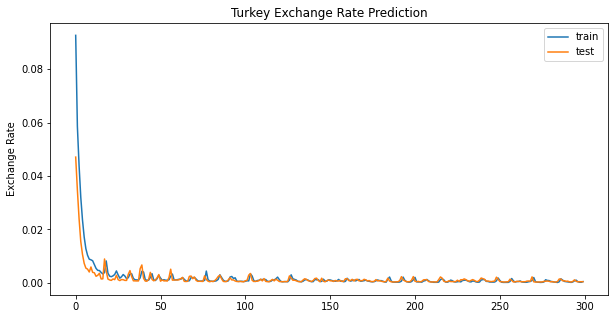

Result for LSTM Unit = 8, Batch Size = 50, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 18ms/step - loss: 0.0011 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



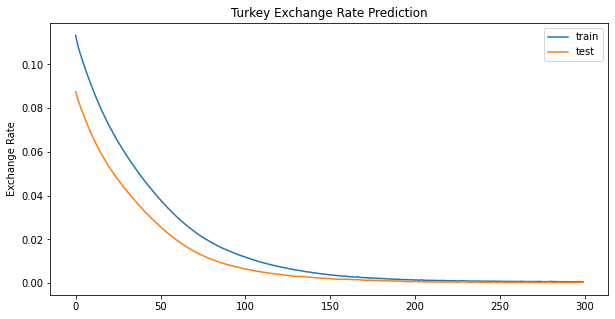

Result for LSTM Unit = 8, Batch Size = 50, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 20ms/step - loss: 0.1453 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.076 
Test Loss: 0.145



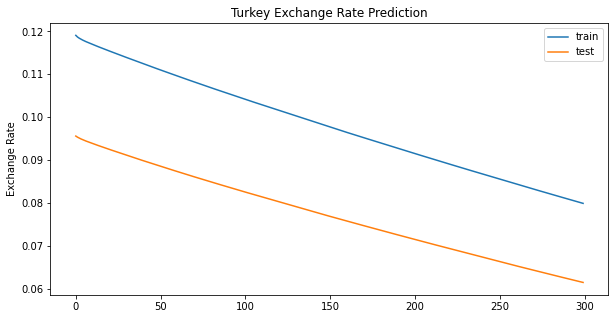

Result for LSTM Unit = 8, Batch Size = 100, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 16ms/step - loss: 0.0167 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.006 
Test Loss: 0.017



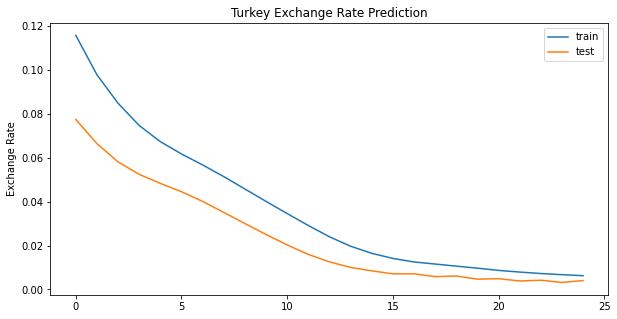

Result for LSTM Unit = 8, Batch Size = 100, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 16ms/step - loss: 0.1517 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.081 
Test Loss: 0.152



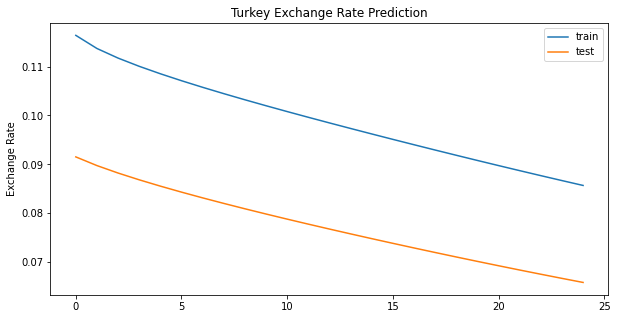

Result for LSTM Unit = 8, Batch Size = 100, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 19ms/step - loss: 0.1945 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.108 
Test Loss: 0.194



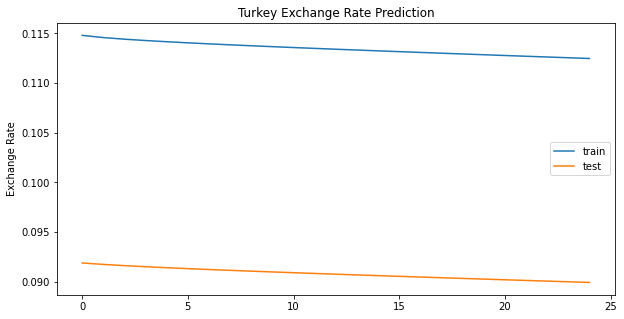

Result for LSTM Unit = 8, Batch Size = 100, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 17ms/step - loss: 0.0088 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.003 
Test Loss: 0.009



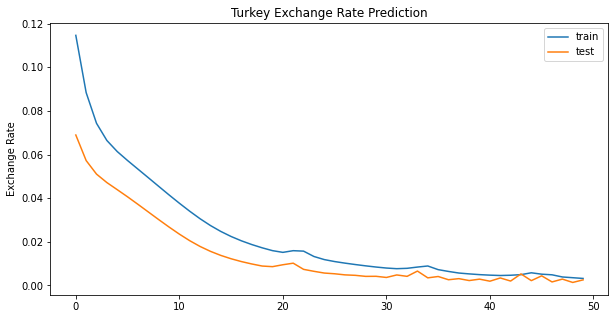

Result for LSTM Unit = 8, Batch Size = 100, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 20ms/step - loss: 0.1193 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.063 
Test Loss: 0.119



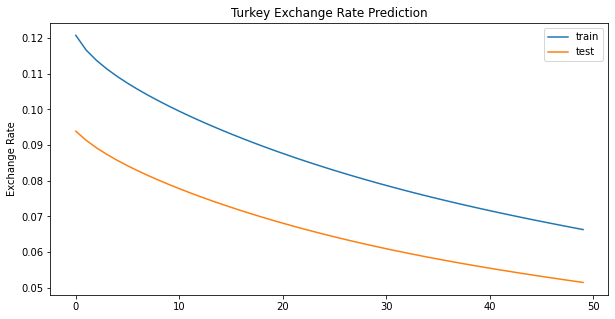

Result for LSTM Unit = 8, Batch Size = 100, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 18ms/step - loss: 0.2006 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.109 
Test Loss: 0.201



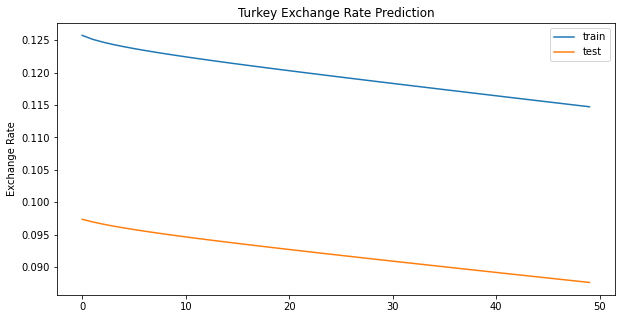

Result for LSTM Unit = 8, Batch Size = 100, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 17ms/step - loss: 0.0038 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.004



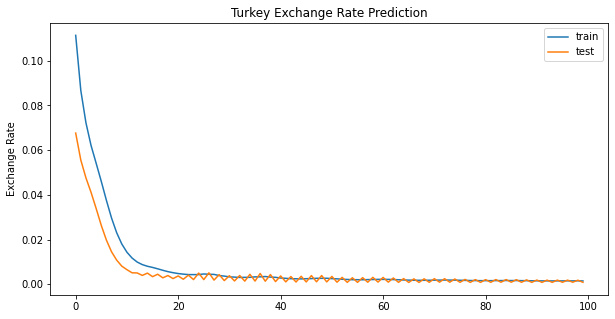

Result for LSTM Unit = 8, Batch Size = 100, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 19ms/step - loss: 0.0714 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.034 
Test Loss: 0.071



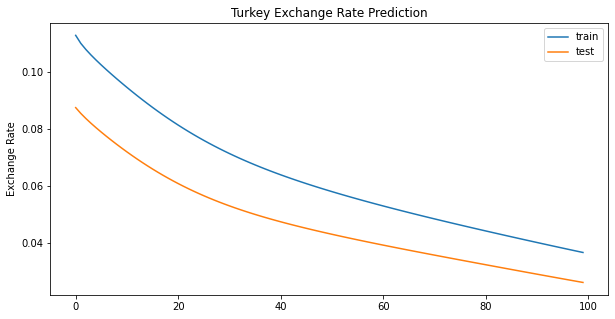

Result for LSTM Unit = 8, Batch Size = 100, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 23ms/step - loss: 0.1811 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.099 
Test Loss: 0.181



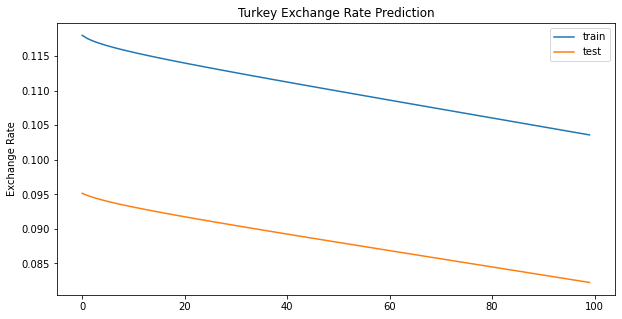

Result for LSTM Unit = 8, Batch Size = 100, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 16ms/step - loss: 0.0031 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.003



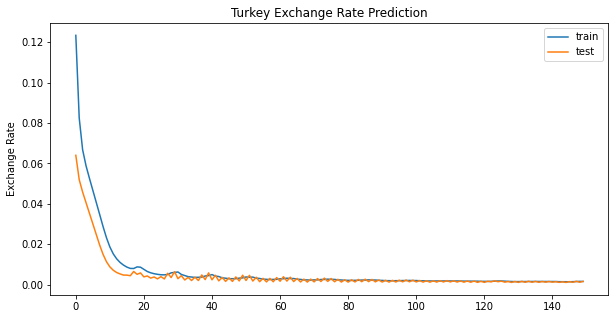

Result for LSTM Unit = 8, Batch Size = 100, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 18ms/step - loss: 0.0526 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.022 
Test Loss: 0.053



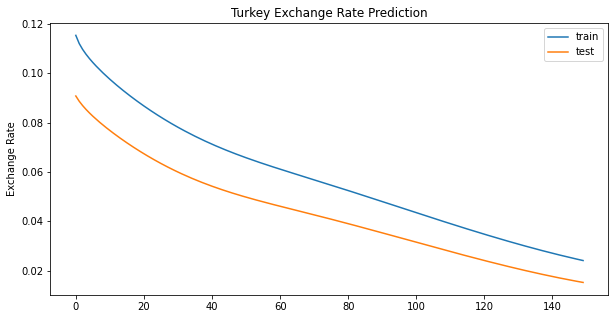

Result for LSTM Unit = 8, Batch Size = 100, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 19ms/step - loss: 0.1830 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.100 
Test Loss: 0.183



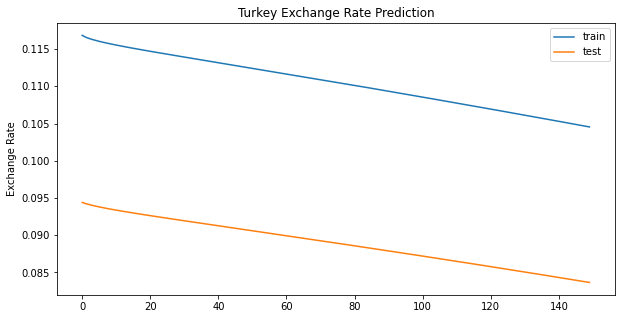

Result for LSTM Unit = 8, Batch Size = 100, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 18ms/step - loss: 0.0023 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



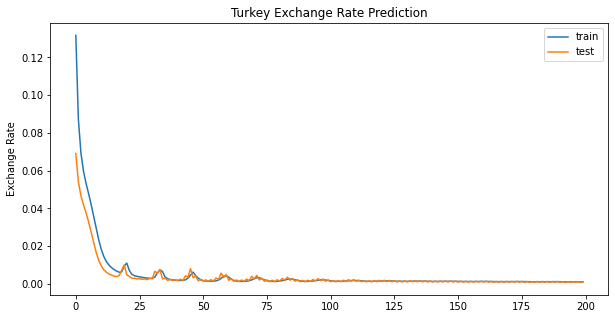

Result for LSTM Unit = 8, Batch Size = 100, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 17ms/step - loss: 0.0303 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.011 
Test Loss: 0.030



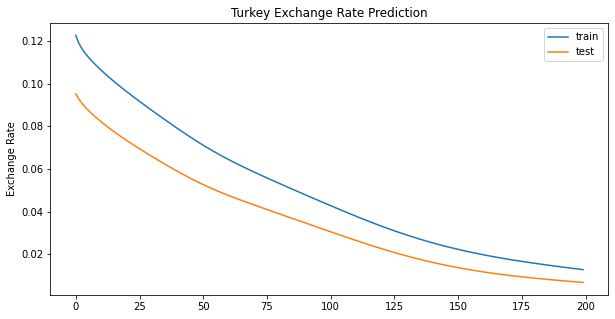

Result for LSTM Unit = 8, Batch Size = 100, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 18ms/step - loss: 0.1333 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.072 
Test Loss: 0.133



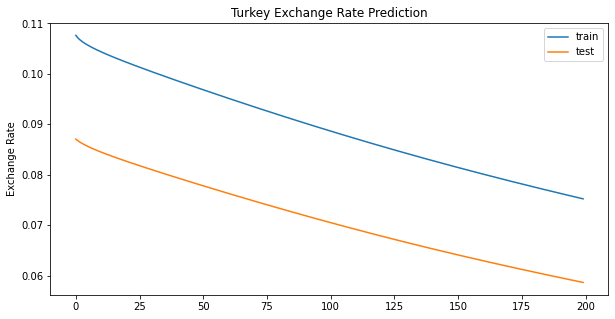

Result for LSTM Unit = 8, Batch Size = 100, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 18ms/step - loss: 0.0019 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



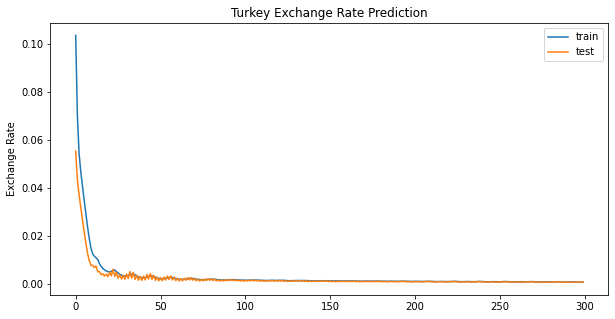

Result for LSTM Unit = 8, Batch Size = 100, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 17ms/step - loss: 0.0041 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.004



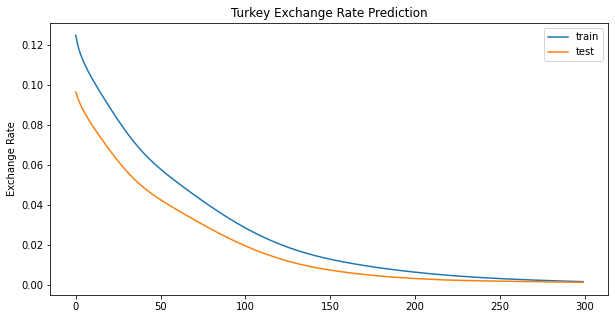

Result for LSTM Unit = 8, Batch Size = 100, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 20ms/step - loss: 0.1624 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.087 
Test Loss: 0.162



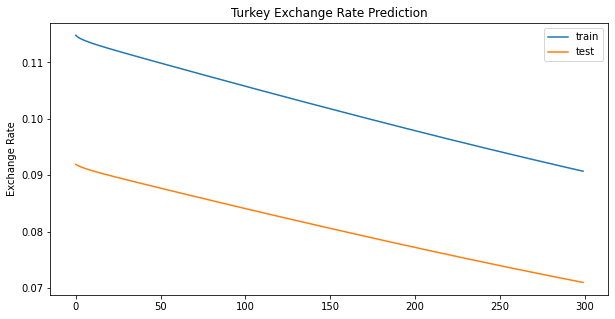

Result for LSTM Unit = 16, Batch Size = 10, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 20ms/step - loss: 9.1780e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



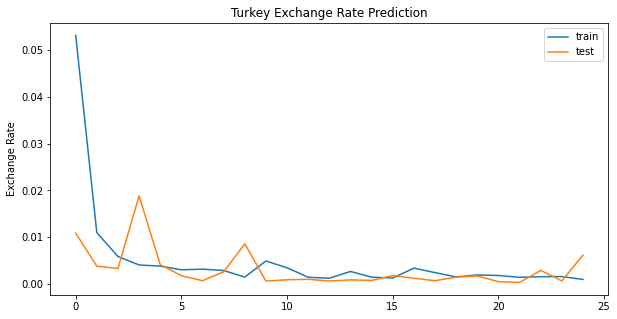

Result for LSTM Unit = 16, Batch Size = 10, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 16ms/step - loss: 0.0085 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.003 
Test Loss: 0.009



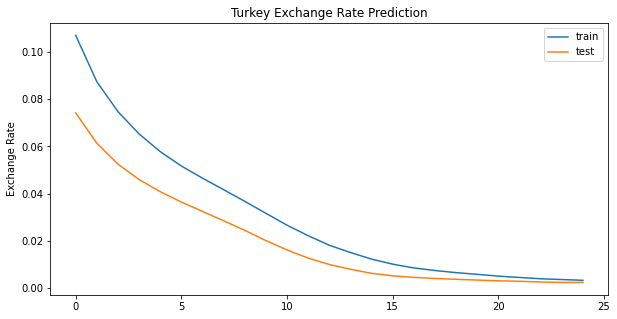

Result for LSTM Unit = 16, Batch Size = 10, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 16ms/step - loss: 0.1263 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.066 
Test Loss: 0.126



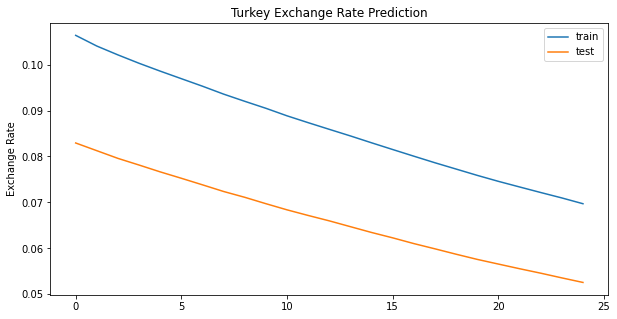

Result for LSTM Unit = 16, Batch Size = 10, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 20ms/step - loss: 6.3387e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



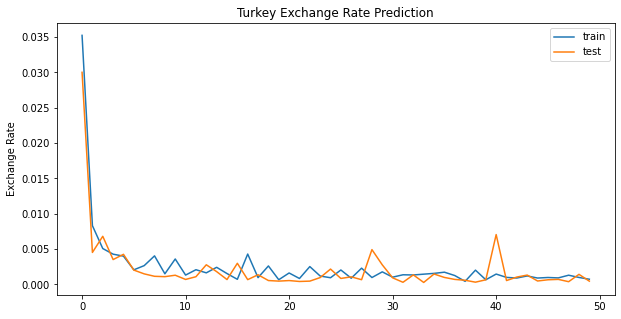

Result for LSTM Unit = 16, Batch Size = 10, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 19ms/step - loss: 0.0029 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.003



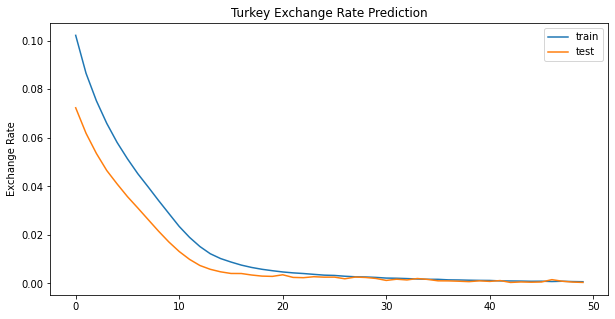

Result for LSTM Unit = 16, Batch Size = 10, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 22ms/step - loss: 0.0977 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.052 
Test Loss: 0.098



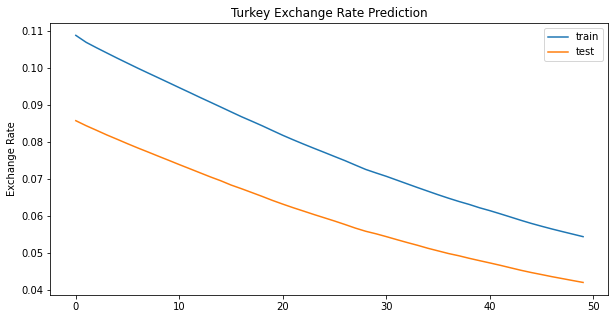

Result for LSTM Unit = 16, Batch Size = 10, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 21ms/step - loss: 4.1181e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



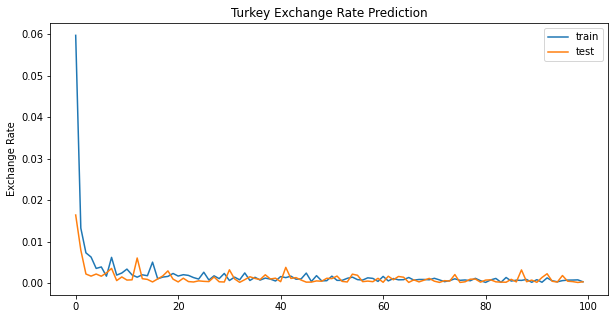

Result for LSTM Unit = 16, Batch Size = 10, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 17ms/step - loss: 0.0011 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



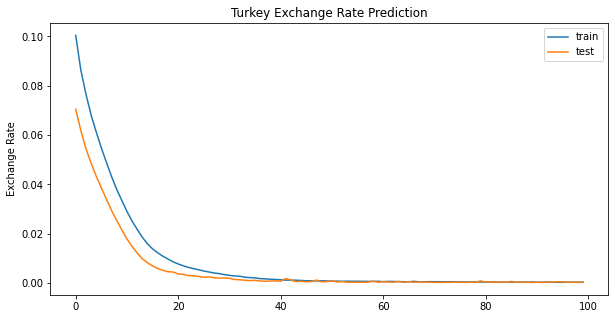

Result for LSTM Unit = 16, Batch Size = 10, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 24ms/step - loss: 0.0473 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.022 
Test Loss: 0.047



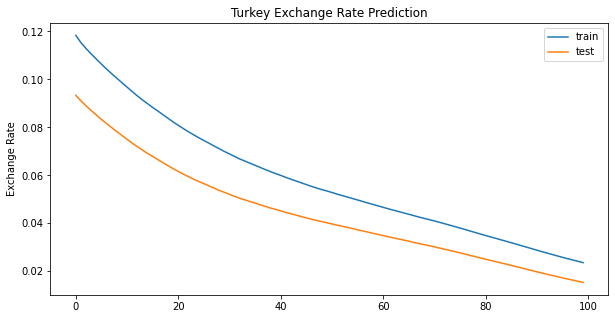

Result for LSTM Unit = 16, Batch Size = 10, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 22ms/step - loss: 3.5611e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



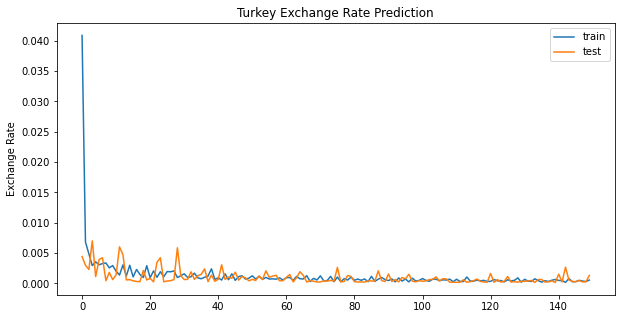

Result for LSTM Unit = 16, Batch Size = 10, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 22ms/step - loss: 9.7289e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



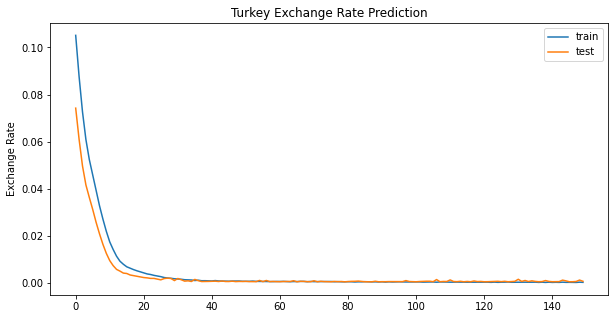

Result for LSTM Unit = 16, Batch Size = 10, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 26ms/step - loss: 0.0092 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.004 
Test Loss: 0.009



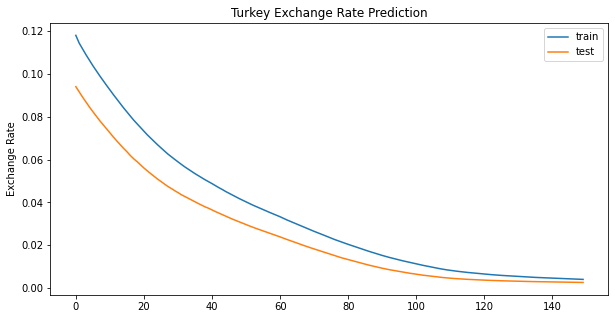

Result for LSTM Unit = 16, Batch Size = 10, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 21ms/step - loss: 4.8688e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



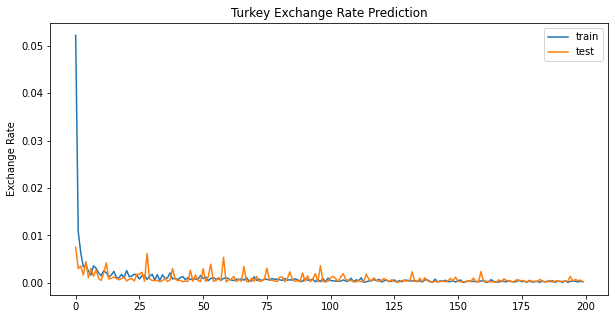

Result for LSTM Unit = 16, Batch Size = 10, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 28ms/step - loss: 7.3071e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



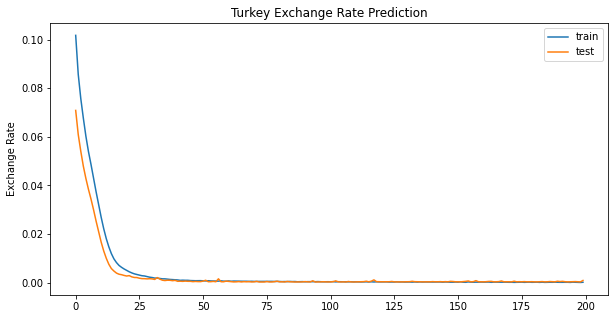

Result for LSTM Unit = 16, Batch Size = 10, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 22ms/step - loss: 0.0121 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.005 
Test Loss: 0.012



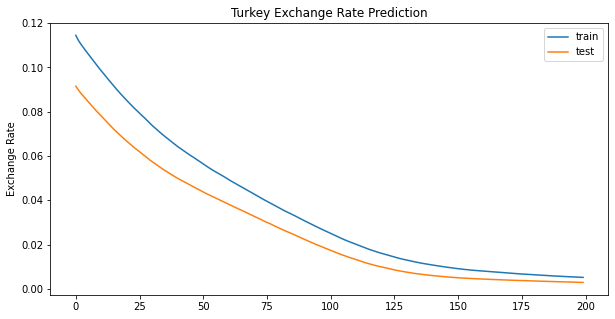

Result for LSTM Unit = 16, Batch Size = 10, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 21ms/step - loss: 4.3963e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



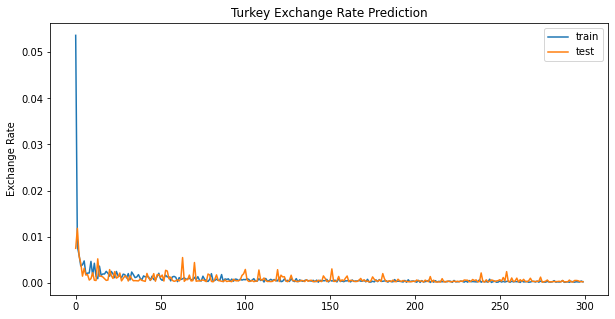

Result for LSTM Unit = 16, Batch Size = 10, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 20ms/step - loss: 7.1100e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



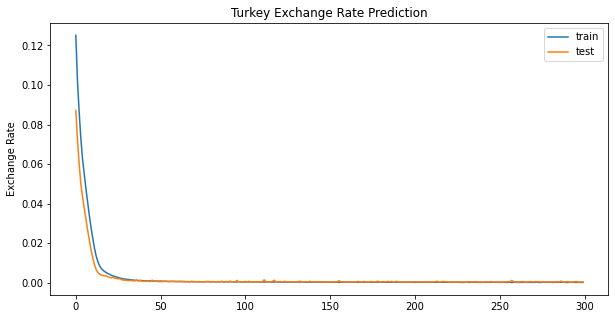

Result for LSTM Unit = 16, Batch Size = 10, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 22ms/step - loss: 0.0068 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.007



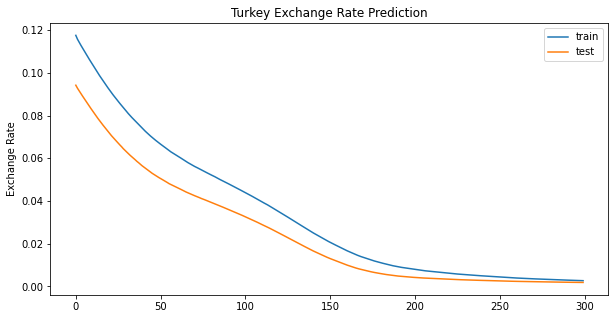

Result for LSTM Unit = 16, Batch Size = 20, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 22ms/step - loss: 0.0021 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



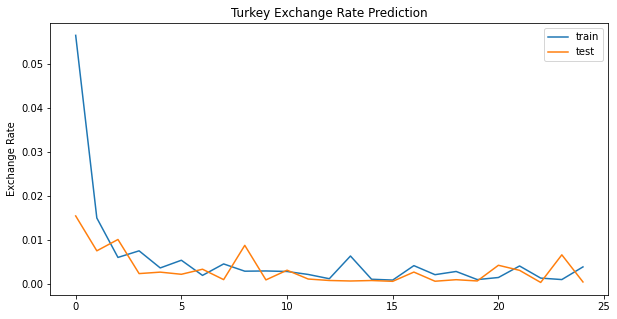

Result for LSTM Unit = 16, Batch Size = 20, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 16ms/step - loss: 0.0259 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.010 
Test Loss: 0.026



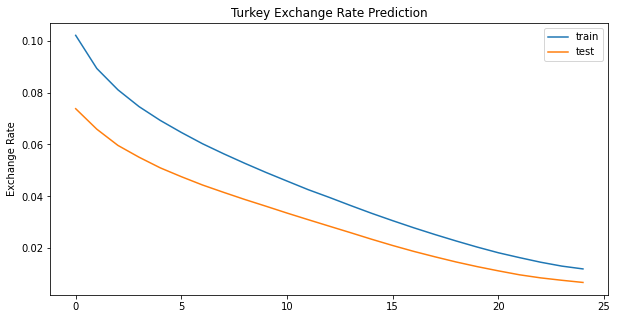

Result for LSTM Unit = 16, Batch Size = 20, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 25ms/step - loss: 0.1659 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.088 
Test Loss: 0.166



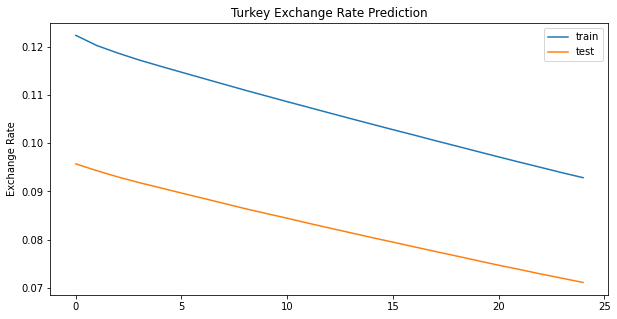

Result for LSTM Unit = 16, Batch Size = 20, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 28ms/step - loss: 0.0013 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



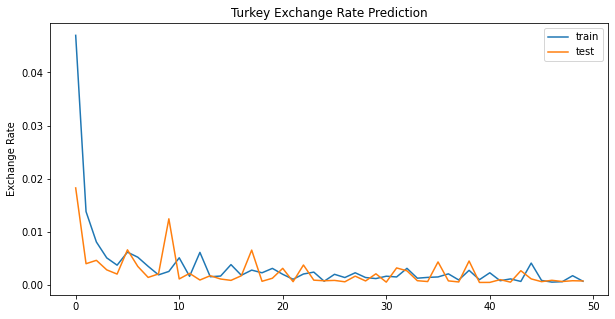

Result for LSTM Unit = 16, Batch Size = 20, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 29ms/step - loss: 0.0021 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



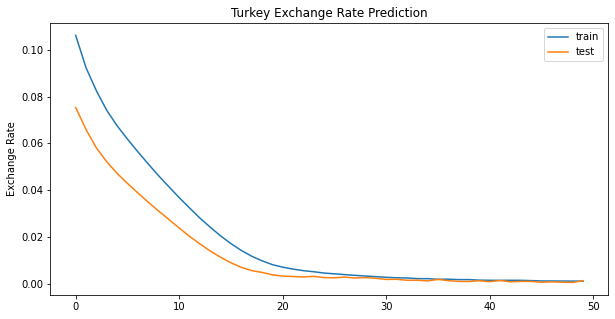

Result for LSTM Unit = 16, Batch Size = 20, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 24ms/step - loss: 0.1473 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.077 
Test Loss: 0.147



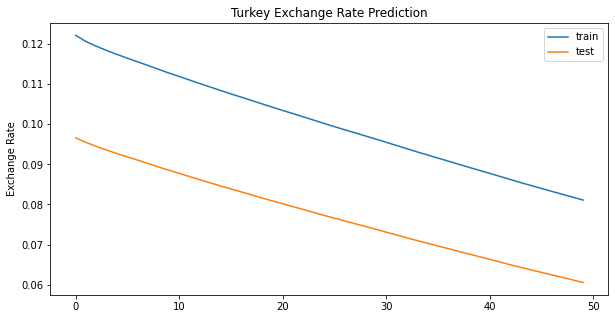

Result for LSTM Unit = 16, Batch Size = 20, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 18ms/step - loss: 6.9581e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



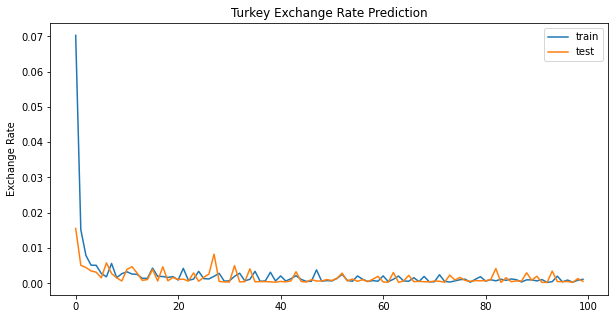

Result for LSTM Unit = 16, Batch Size = 20, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 26ms/step - loss: 0.0012 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



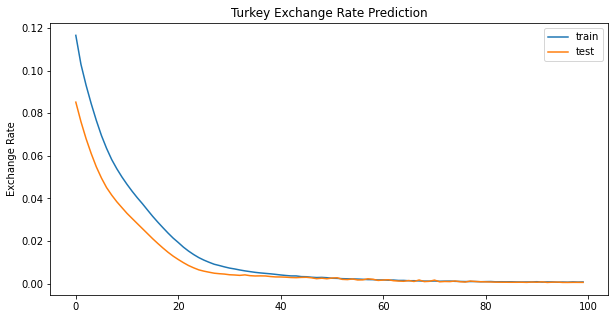

Result for LSTM Unit = 16, Batch Size = 20, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 28ms/step - loss: 0.0874 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.045 
Test Loss: 0.087



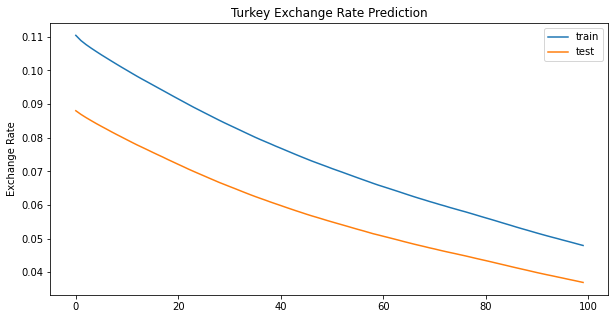

Result for LSTM Unit = 16, Batch Size = 20, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 26ms/step - loss: 4.8784e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



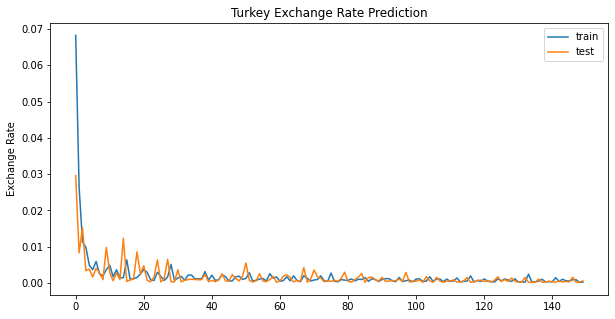

Result for LSTM Unit = 16, Batch Size = 20, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 29ms/step - loss: 8.3699e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



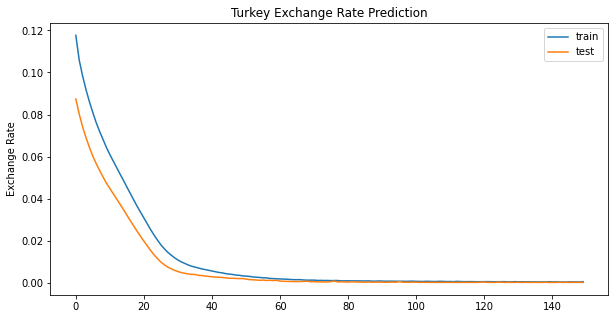

Result for LSTM Unit = 16, Batch Size = 20, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 19ms/step - loss: 0.0987 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.050 
Test Loss: 0.099



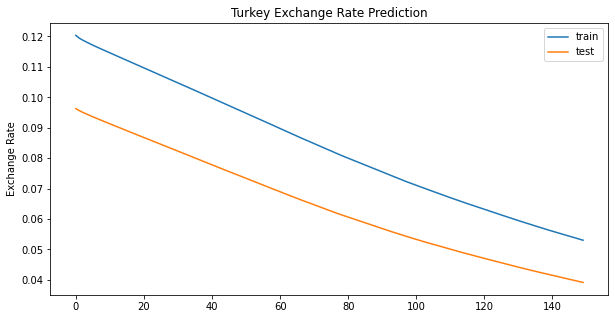

Result for LSTM Unit = 16, Batch Size = 20, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 20ms/step - loss: 4.9338e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



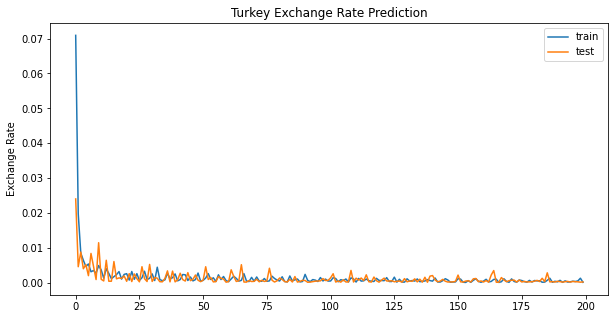

Result for LSTM Unit = 16, Batch Size = 20, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 18ms/step - loss: 9.5330e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



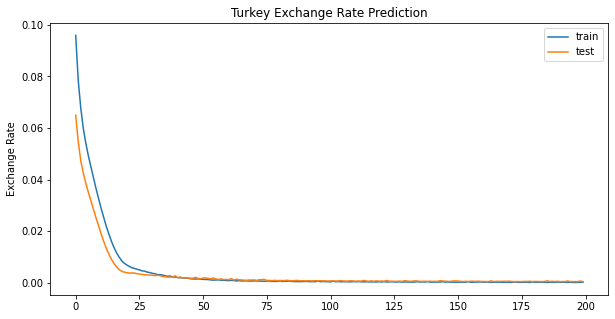

Result for LSTM Unit = 16, Batch Size = 20, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 21ms/step - loss: 0.0683 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.033 
Test Loss: 0.068



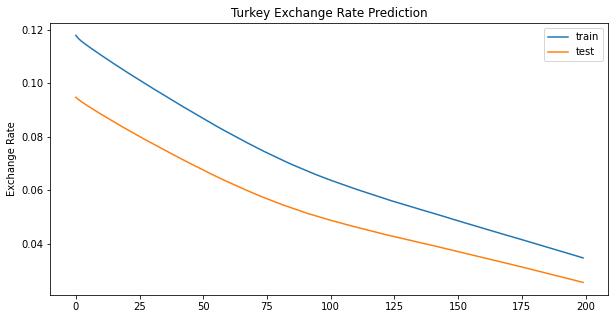

Result for LSTM Unit = 16, Batch Size = 20, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 24ms/step - loss: 2.8260e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



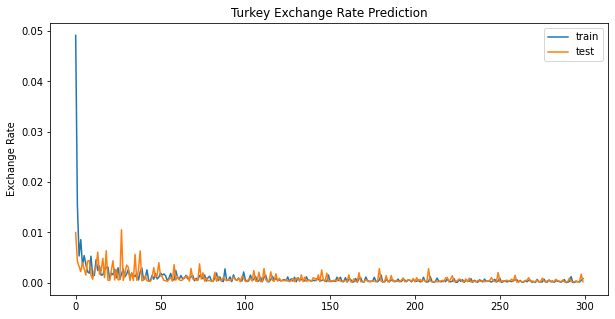

Result for LSTM Unit = 16, Batch Size = 20, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 32ms/step - loss: 5.4157e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



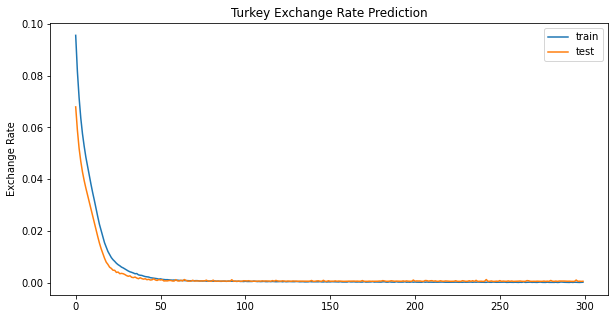

Result for LSTM Unit = 16, Batch Size = 20, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 18ms/step - loss: 0.0146 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.006 
Test Loss: 0.015



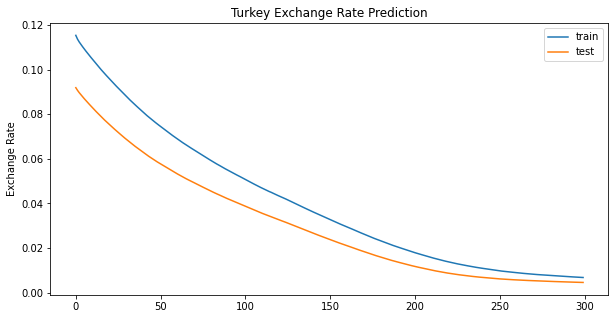

Result for LSTM Unit = 16, Batch Size = 50, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 31ms/step - loss: 0.0024 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



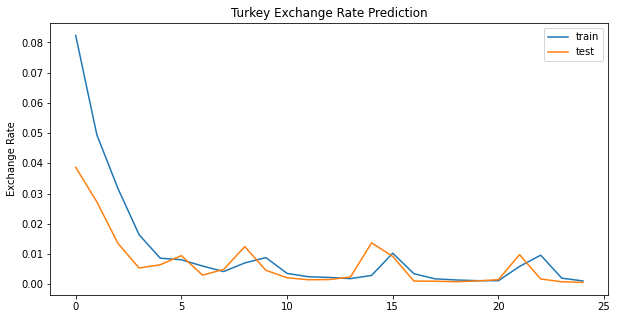

Result for LSTM Unit = 16, Batch Size = 50, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 27ms/step - loss: 0.0951 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.050 
Test Loss: 0.095



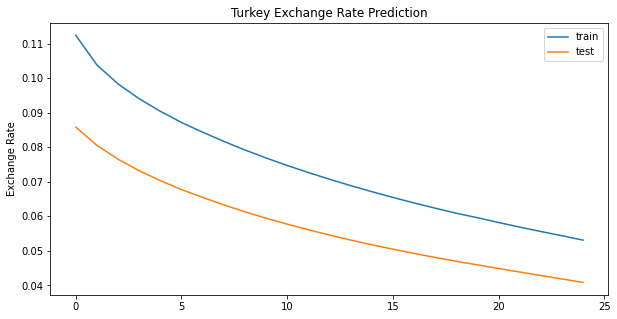

Result for LSTM Unit = 16, Batch Size = 50, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 18ms/step - loss: 0.1868 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.103 
Test Loss: 0.187



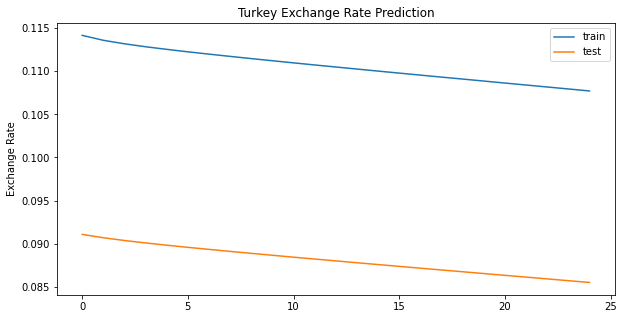

Result for LSTM Unit = 16, Batch Size = 50, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 20ms/step - loss: 0.0027 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.003



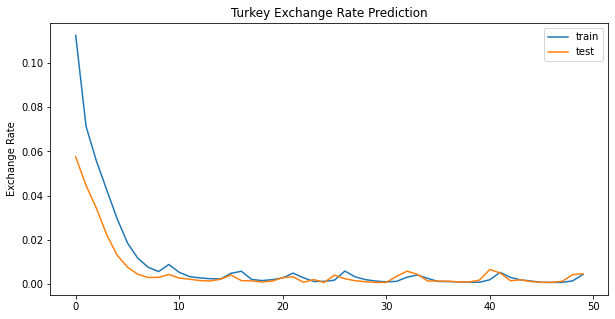

Result for LSTM Unit = 16, Batch Size = 50, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 22ms/step - loss: 0.0160 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.006 
Test Loss: 0.016



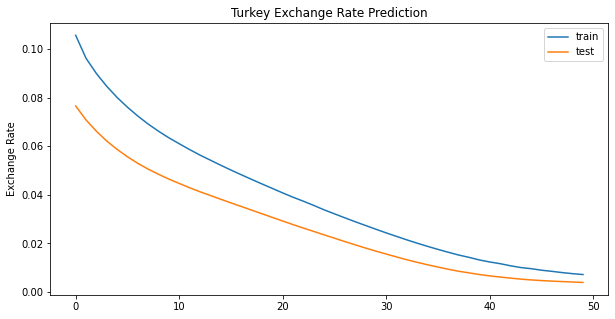

Result for LSTM Unit = 16, Batch Size = 50, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 27ms/step - loss: 0.1780 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.097 
Test Loss: 0.178



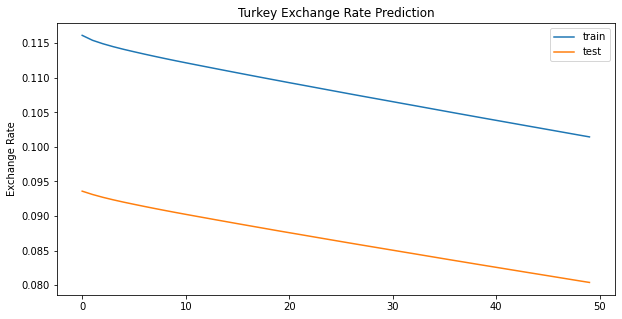

Result for LSTM Unit = 16, Batch Size = 50, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 25ms/step - loss: 0.0010 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



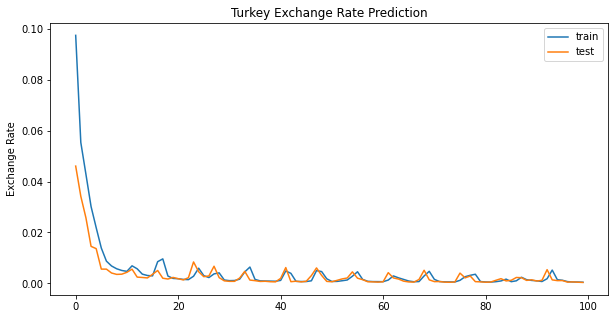

Result for LSTM Unit = 16, Batch Size = 50, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 21ms/step - loss: 0.0059 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.006



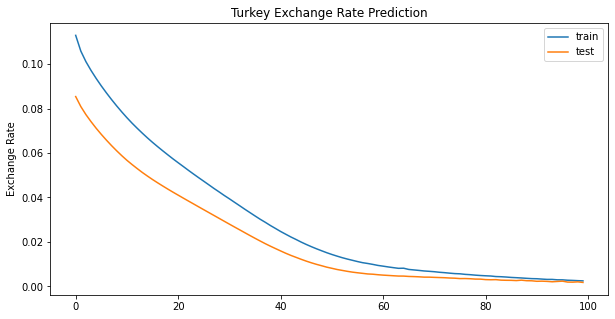

Result for LSTM Unit = 16, Batch Size = 50, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 27ms/step - loss: 0.1364 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.073 
Test Loss: 0.136



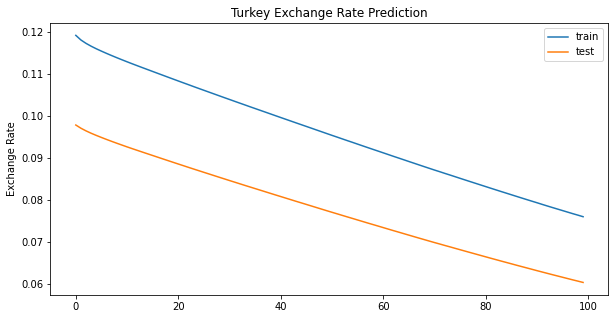

Result for LSTM Unit = 16, Batch Size = 50, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 23ms/step - loss: 6.6023e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



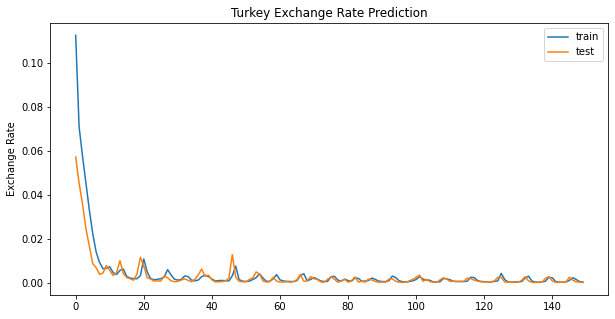

Result for LSTM Unit = 16, Batch Size = 50, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 16ms/step - loss: 0.0014 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



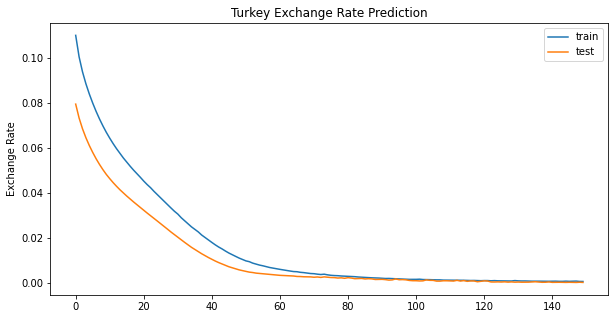

Result for LSTM Unit = 16, Batch Size = 50, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 27ms/step - loss: 0.1170 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.060 
Test Loss: 0.117



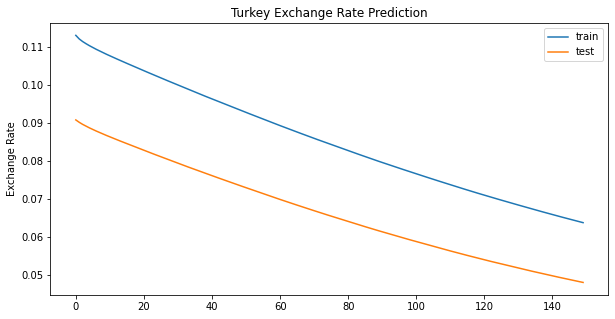

Result for LSTM Unit = 16, Batch Size = 50, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 24ms/step - loss: 6.3270e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



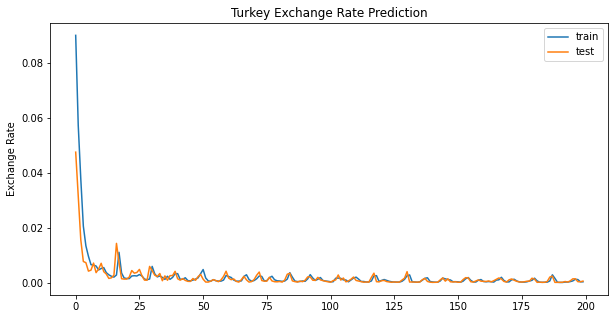

Result for LSTM Unit = 16, Batch Size = 50, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 23ms/step - loss: 0.0014 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



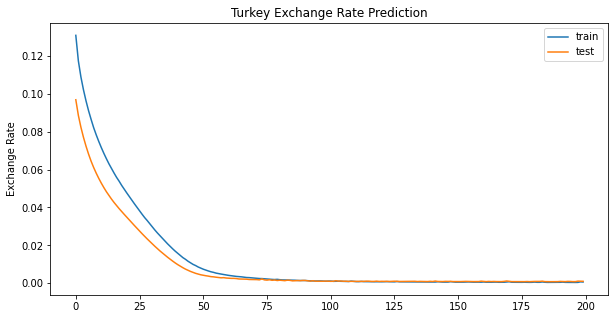

Result for LSTM Unit = 16, Batch Size = 50, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 19ms/step - loss: 0.1108 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.058 
Test Loss: 0.111



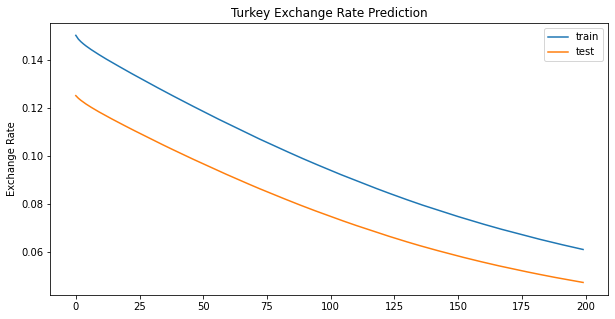

Result for LSTM Unit = 16, Batch Size = 50, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 27ms/step - loss: 5.0463e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



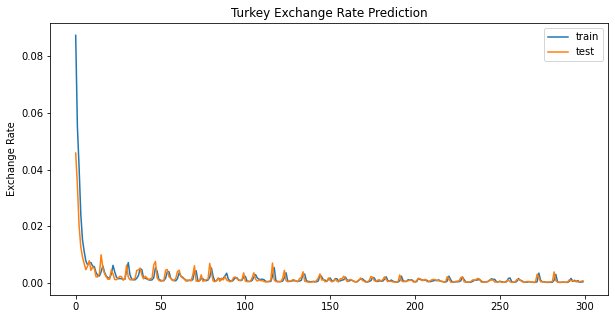

Result for LSTM Unit = 16, Batch Size = 50, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 29ms/step - loss: 8.8129e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



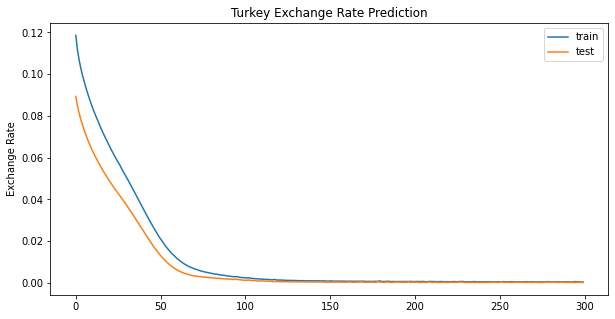

Result for LSTM Unit = 16, Batch Size = 50, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 17ms/step - loss: 0.0741 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.038 
Test Loss: 0.074



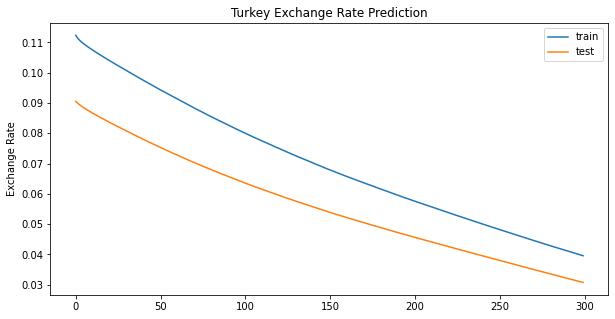

Result for LSTM Unit = 16, Batch Size = 100, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 23ms/step - loss: 0.0070 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.003 
Test Loss: 0.007



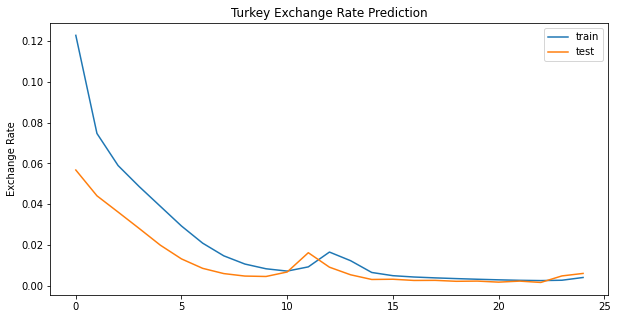

Result for LSTM Unit = 16, Batch Size = 100, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 25ms/step - loss: 0.1290 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.068 
Test Loss: 0.129



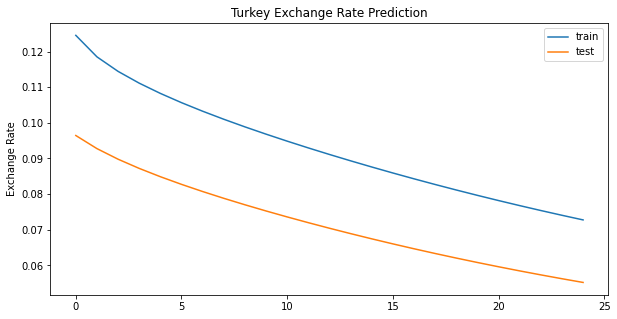

Result for LSTM Unit = 16, Batch Size = 100, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 17ms/step - loss: 0.1774 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.098 
Test Loss: 0.177



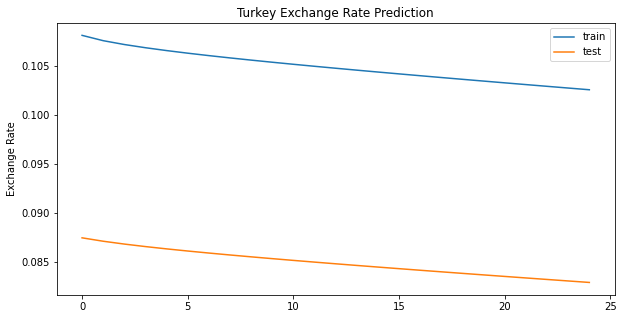

Result for LSTM Unit = 16, Batch Size = 100, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 17ms/step - loss: 0.0039 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.004



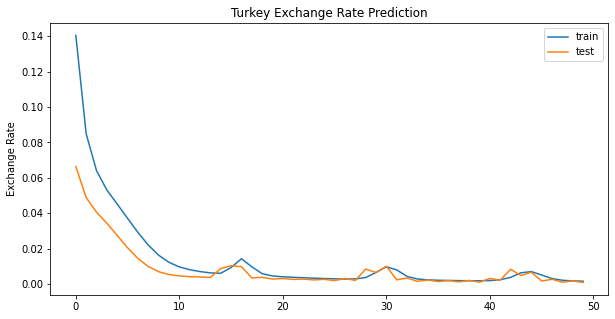

Result for LSTM Unit = 16, Batch Size = 100, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 18ms/step - loss: 0.0921 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.046 
Test Loss: 0.092



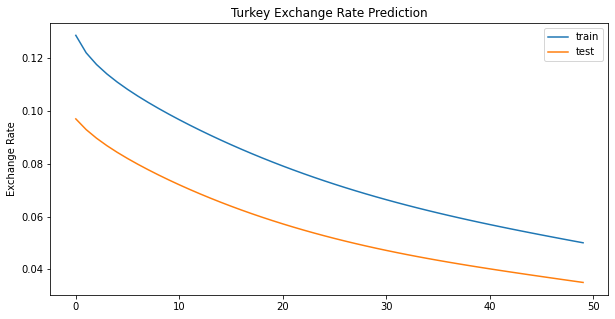

Result for LSTM Unit = 16, Batch Size = 100, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 28ms/step - loss: 0.1828 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.099 
Test Loss: 0.183



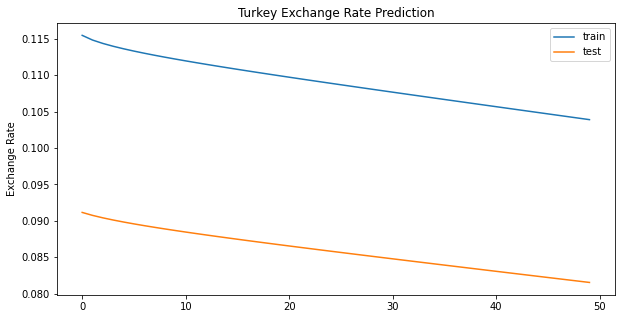

Result for LSTM Unit = 16, Batch Size = 100, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 29ms/step - loss: 0.0039 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.004



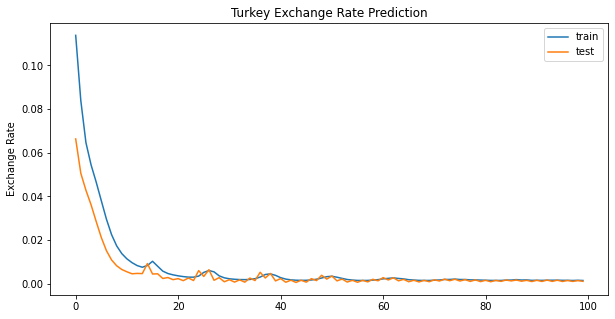

Result for LSTM Unit = 16, Batch Size = 100, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 31ms/step - loss: 0.0355 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.016 
Test Loss: 0.036



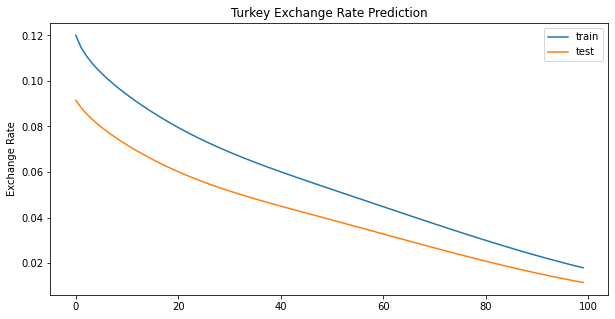

Result for LSTM Unit = 16, Batch Size = 100, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 26ms/step - loss: 0.1802 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.098 
Test Loss: 0.180



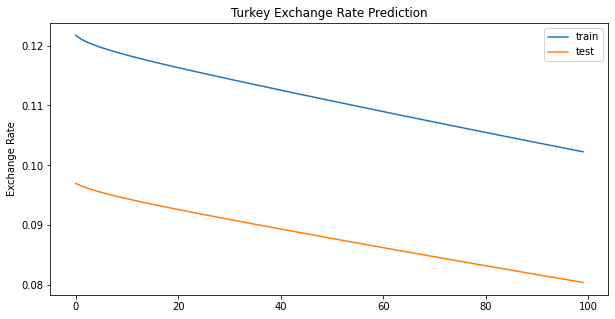

Result for LSTM Unit = 16, Batch Size = 100, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 28ms/step - loss: 0.0038 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.004



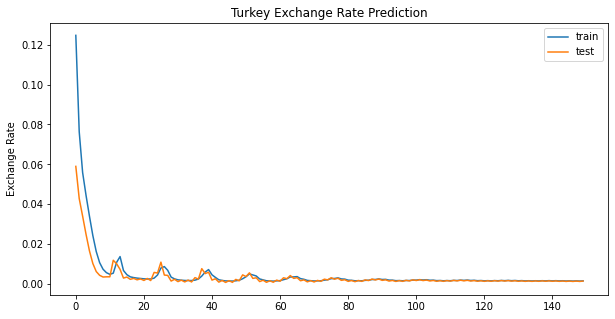

Result for LSTM Unit = 16, Batch Size = 100, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 26ms/step - loss: 0.0054 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.005



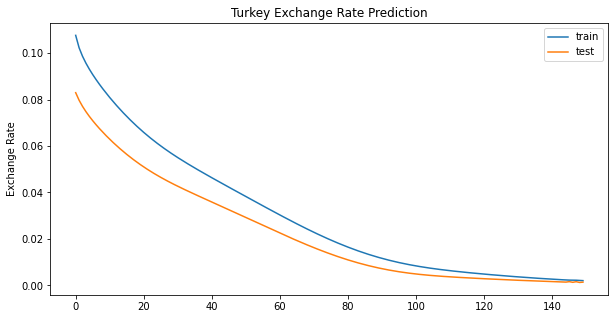

Result for LSTM Unit = 16, Batch Size = 100, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 28ms/step - loss: 0.1338 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.071 
Test Loss: 0.134



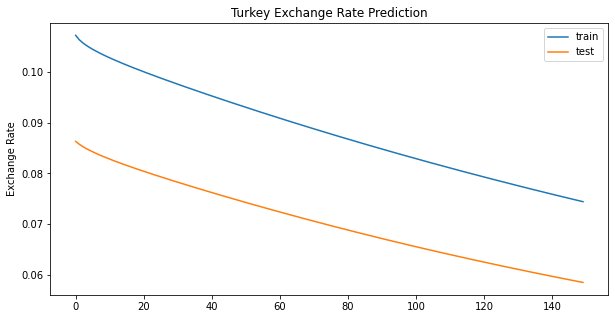

Result for LSTM Unit = 16, Batch Size = 100, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 17ms/step - loss: 0.0025 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



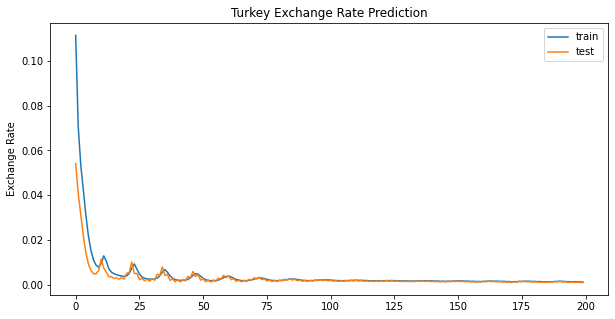

Result for LSTM Unit = 16, Batch Size = 100, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 27ms/step - loss: 0.0032 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.003



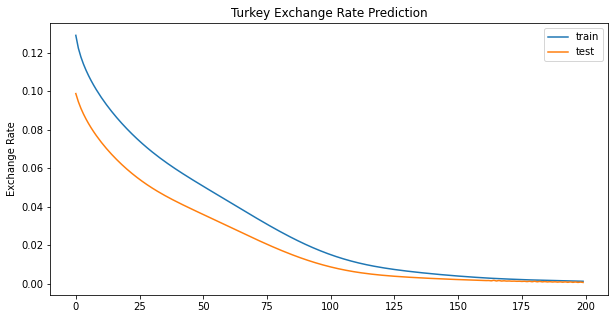

Result for LSTM Unit = 16, Batch Size = 100, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 30ms/step - loss: 0.1526 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.082 
Test Loss: 0.153



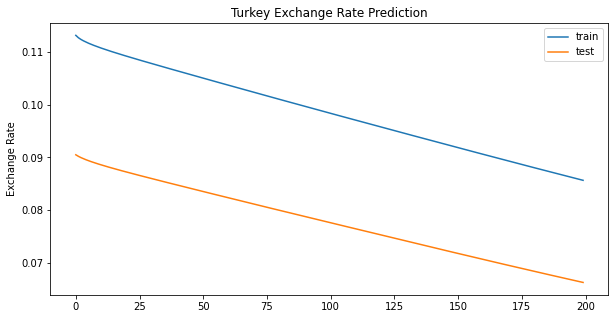

Result for LSTM Unit = 16, Batch Size = 100, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 30ms/step - loss: 0.0020 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



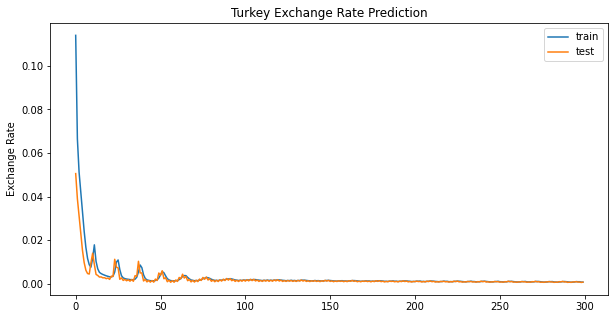

Result for LSTM Unit = 16, Batch Size = 100, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 27ms/step - loss: 9.1089e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



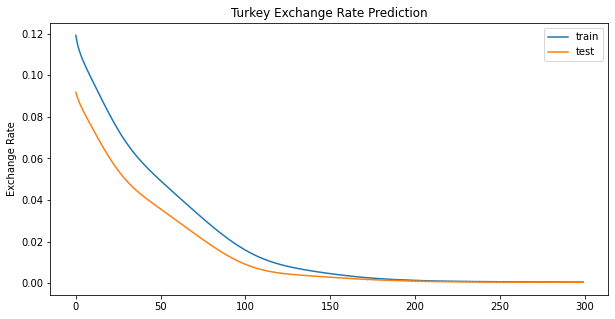

Result for LSTM Unit = 16, Batch Size = 100, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 27ms/step - loss: 0.1517 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.080 
Test Loss: 0.152



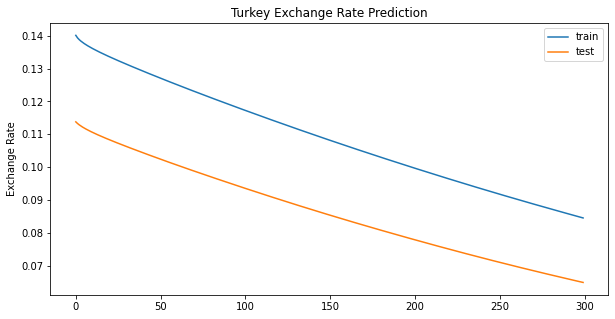

Result for LSTM Unit = 32, Batch Size = 10, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 19ms/step - loss: 0.0021 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



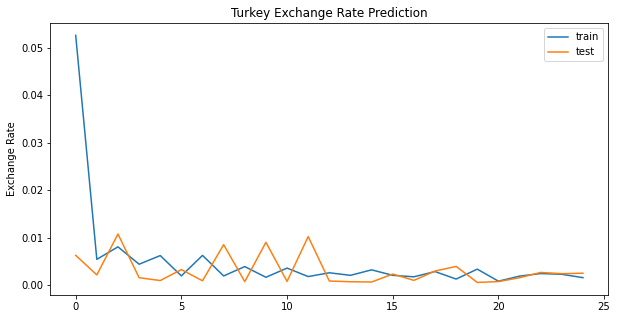

Result for LSTM Unit = 32, Batch Size = 10, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 27ms/step - loss: 0.0021 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



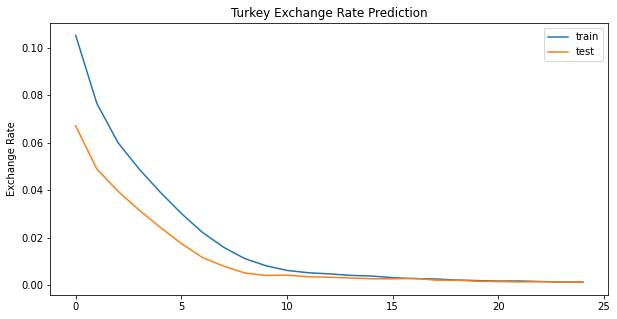

Result for LSTM Unit = 32, Batch Size = 10, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 24ms/step - loss: 0.1045 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.055 
Test Loss: 0.104



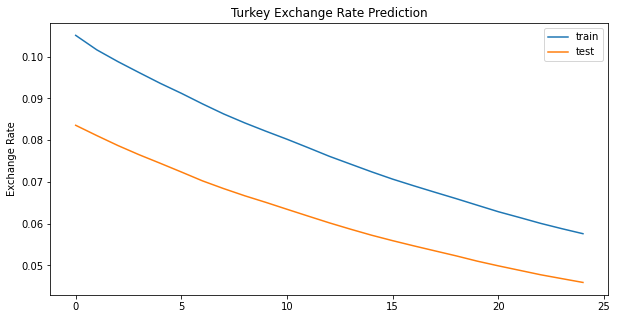

Result for LSTM Unit = 32, Batch Size = 10, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 19ms/step - loss: 7.8633e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



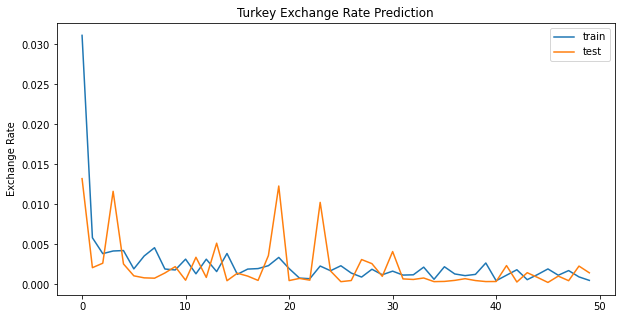

Result for LSTM Unit = 32, Batch Size = 10, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 28ms/step - loss: 8.9501e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



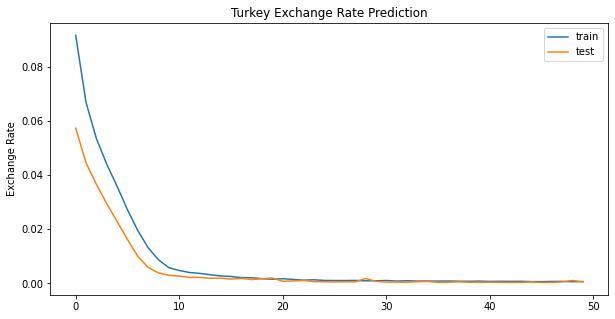

Result for LSTM Unit = 32, Batch Size = 10, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 30ms/step - loss: 0.0662 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.035 
Test Loss: 0.066



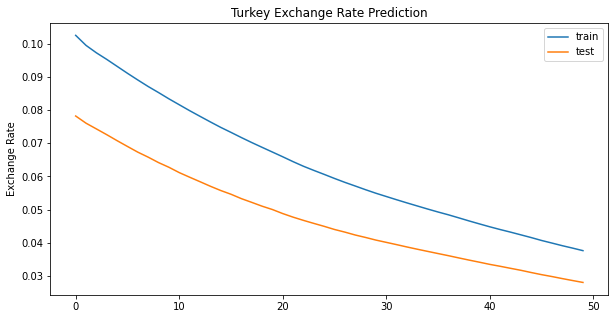

Result for LSTM Unit = 32, Batch Size = 10, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 28ms/step - loss: 5.0083e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



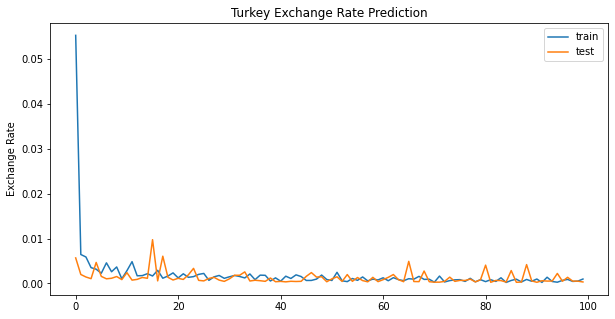

Result for LSTM Unit = 32, Batch Size = 10, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 27ms/step - loss: 4.8349e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



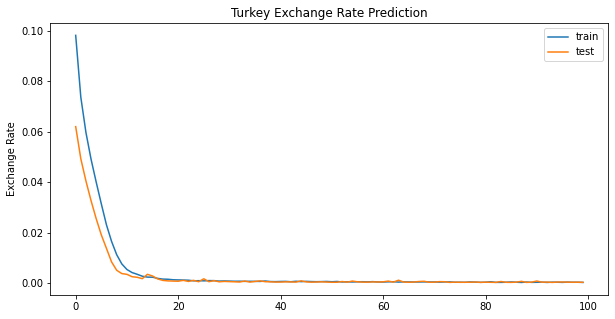

Result for LSTM Unit = 32, Batch Size = 10, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 29ms/step - loss: 0.0164 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.006 
Test Loss: 0.016



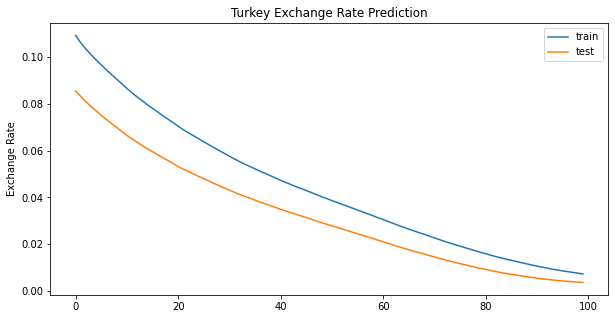

Result for LSTM Unit = 32, Batch Size = 10, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 31ms/step - loss: 5.6872e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



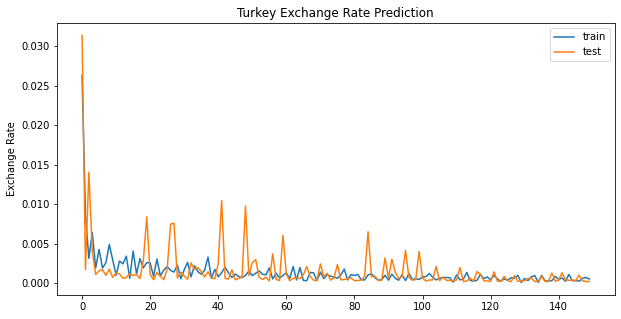

Result for LSTM Unit = 32, Batch Size = 10, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 20ms/step - loss: 4.3490e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



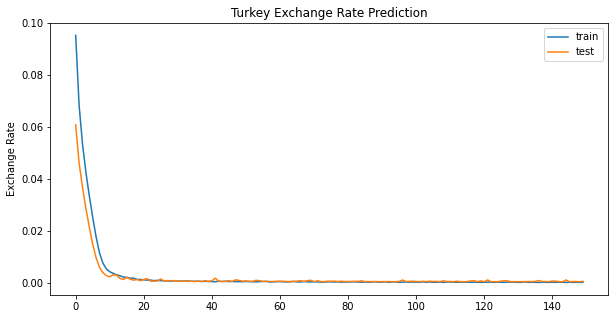

Result for LSTM Unit = 32, Batch Size = 10, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 27ms/step - loss: 0.0038 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.004



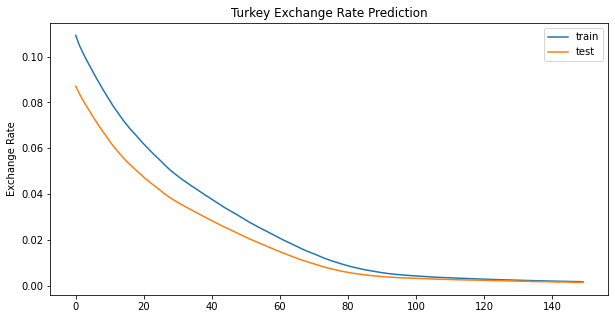

Result for LSTM Unit = 32, Batch Size = 10, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 30ms/step - loss: 4.2166e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



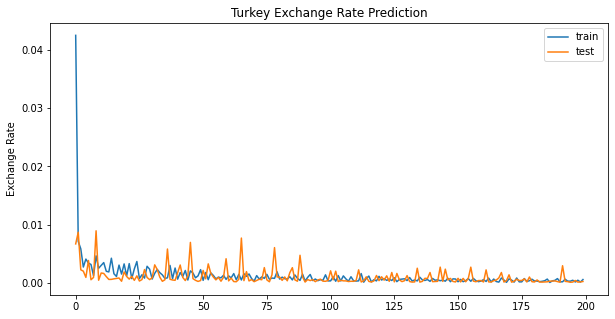

Result for LSTM Unit = 32, Batch Size = 10, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 27ms/step - loss: 7.0615e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



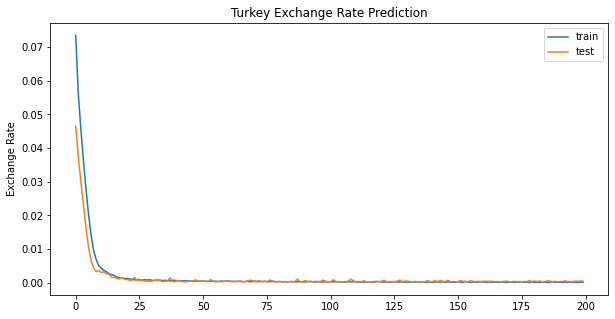

Result for LSTM Unit = 32, Batch Size = 10, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 24ms/step - loss: 0.0019 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



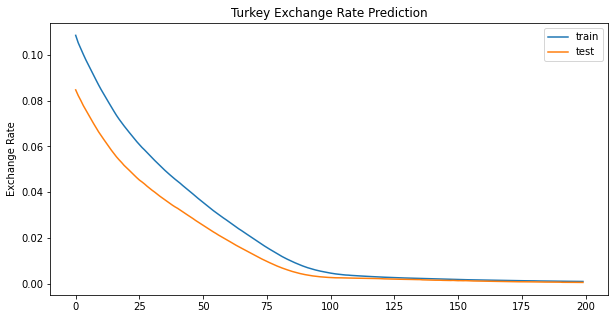

Result for LSTM Unit = 32, Batch Size = 10, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 21ms/step - loss: 3.9042e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



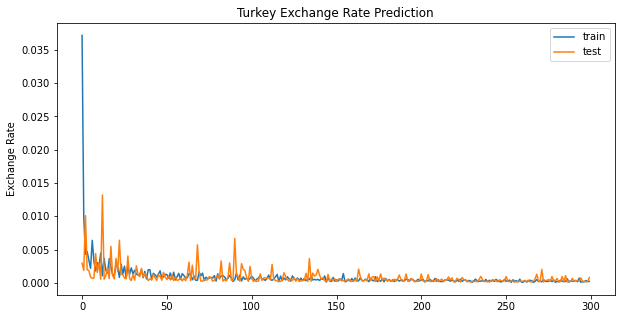

Result for LSTM Unit = 32, Batch Size = 10, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 29ms/step - loss: 8.0060e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



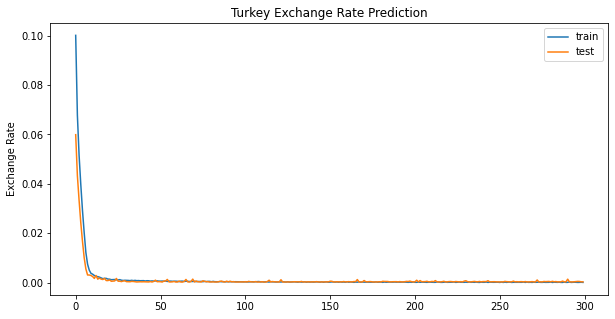

Result for LSTM Unit = 32, Batch Size = 10, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 30ms/step - loss: 0.0012 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



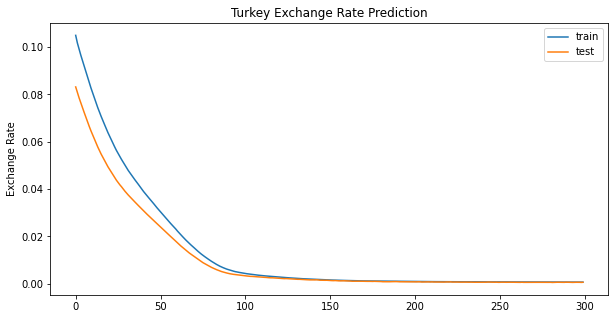

Result for LSTM Unit = 32, Batch Size = 20, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 30ms/step - loss: 0.0015 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



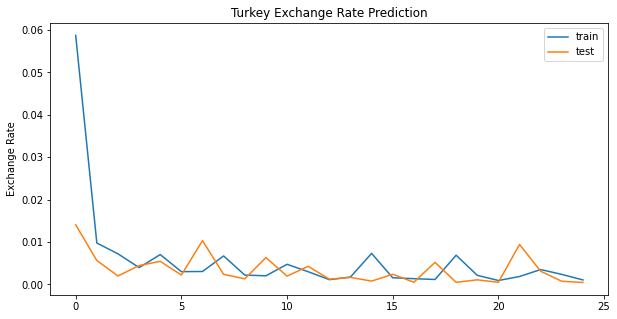

Result for LSTM Unit = 32, Batch Size = 20, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 21ms/step - loss: 0.0082 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.003 
Test Loss: 0.008



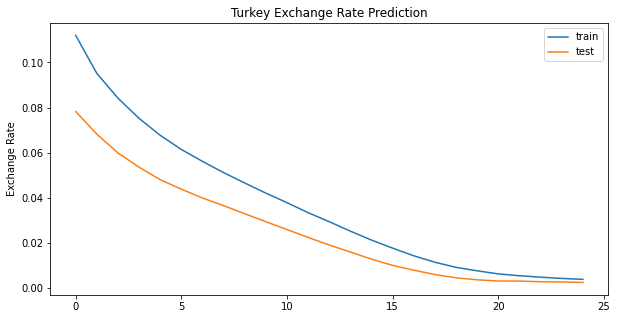

Result for LSTM Unit = 32, Batch Size = 20, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 30ms/step - loss: 0.1496 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.079 
Test Loss: 0.150



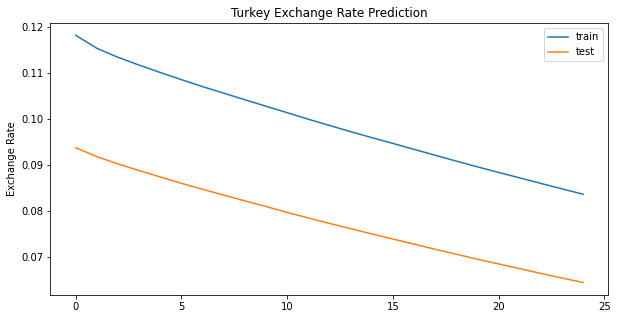

Result for LSTM Unit = 32, Batch Size = 20, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 32ms/step - loss: 9.2146e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



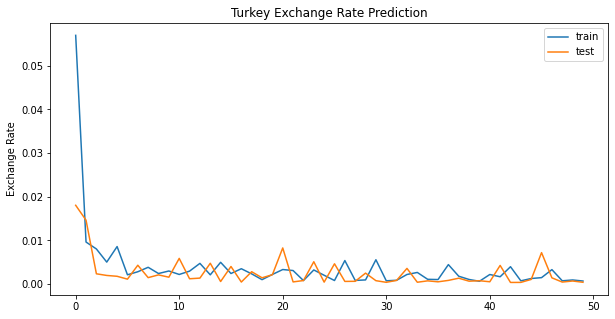

Result for LSTM Unit = 32, Batch Size = 20, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 22ms/step - loss: 0.0014 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



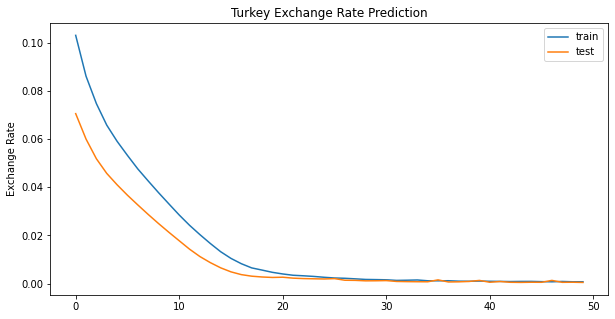

Result for LSTM Unit = 32, Batch Size = 20, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 30ms/step - loss: 0.0976 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.053 
Test Loss: 0.098



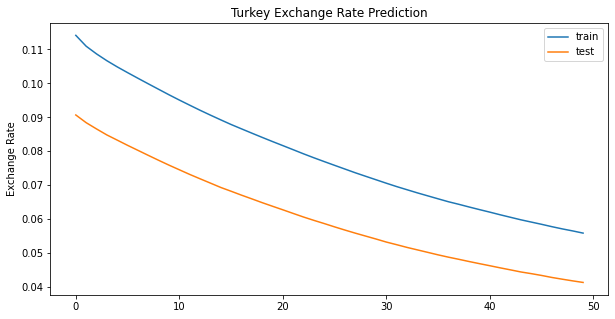

Result for LSTM Unit = 32, Batch Size = 20, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 31ms/step - loss: 4.5815e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



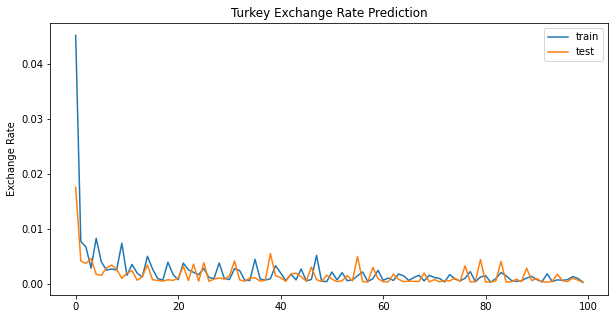

Result for LSTM Unit = 32, Batch Size = 20, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 29ms/step - loss: 7.7415e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



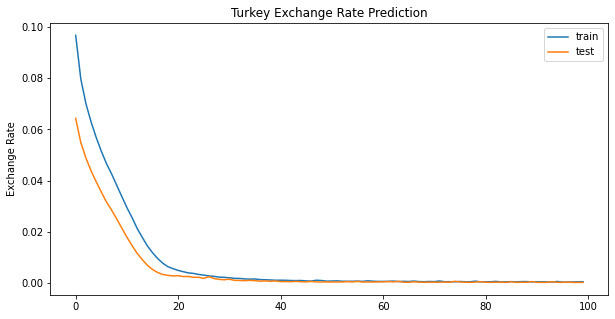

Result for LSTM Unit = 32, Batch Size = 20, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 30ms/step - loss: 0.0585 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.031 
Test Loss: 0.059



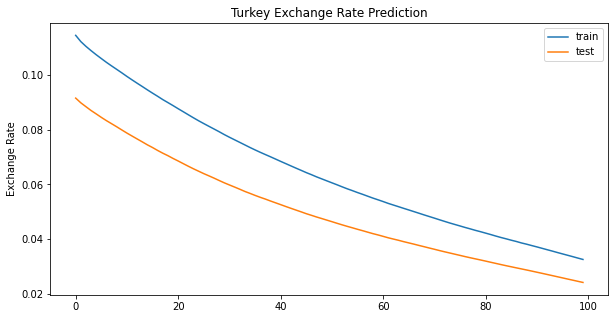

Result for LSTM Unit = 32, Batch Size = 20, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 27ms/step - loss: 4.7279e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



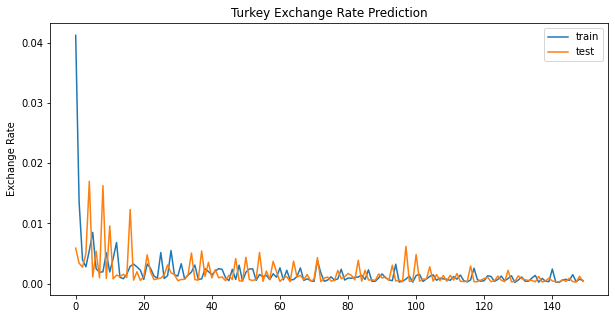

Result for LSTM Unit = 32, Batch Size = 20, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 28ms/step - loss: 8.2614e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



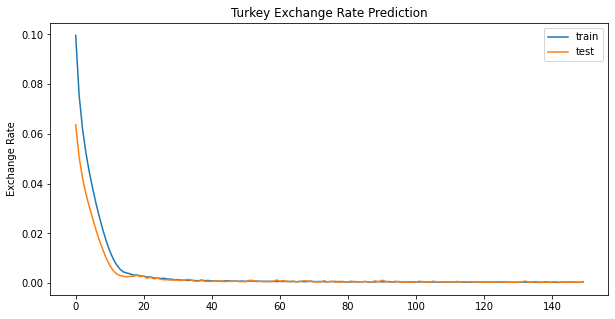

Result for LSTM Unit = 32, Batch Size = 20, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 33ms/step - loss: 0.0160 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.007 
Test Loss: 0.016



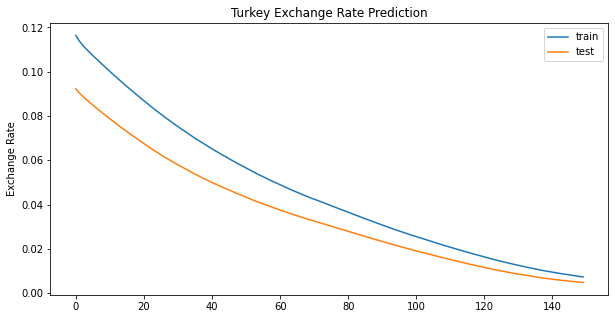

Result for LSTM Unit = 32, Batch Size = 20, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 28ms/step - loss: 4.9335e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



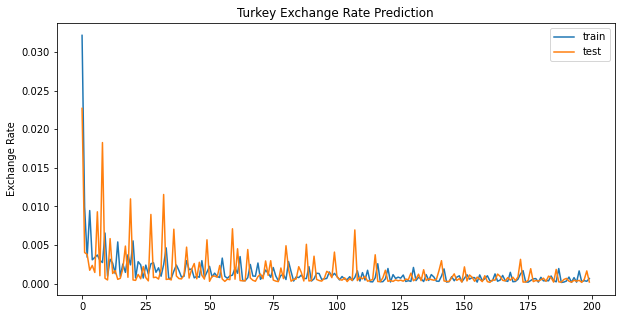

Result for LSTM Unit = 32, Batch Size = 20, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 35ms/step - loss: 6.4530e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



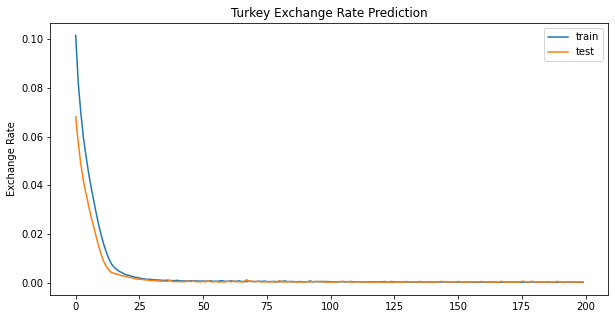

Result for LSTM Unit = 32, Batch Size = 20, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 26ms/step - loss: 0.0098 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.004 
Test Loss: 0.010



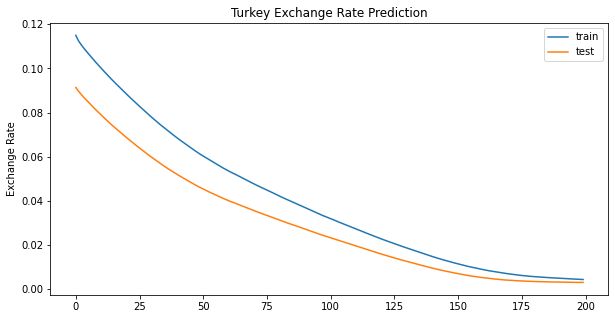

Result for LSTM Unit = 32, Batch Size = 20, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 43ms/step - loss: 2.6519e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



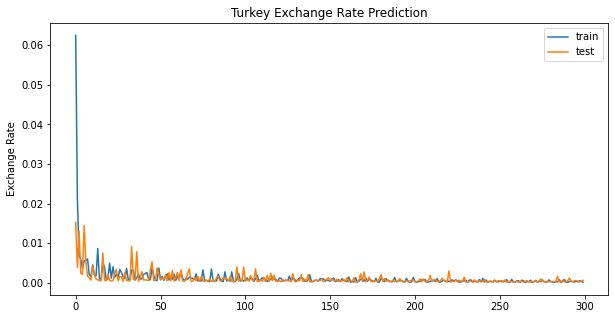

Result for LSTM Unit = 32, Batch Size = 20, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 26ms/step - loss: 6.9692e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



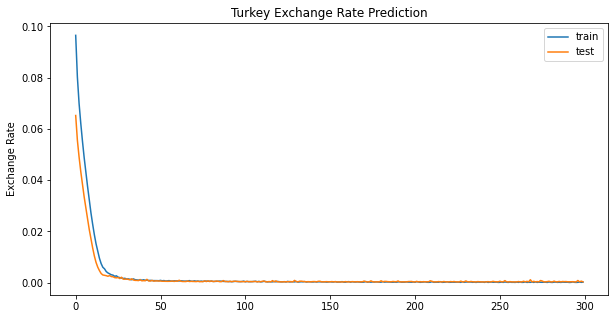

Result for LSTM Unit = 32, Batch Size = 20, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 45ms/step - loss: 0.0021 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



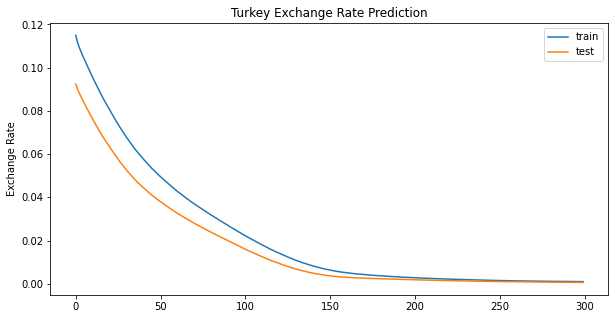

Result for LSTM Unit = 32, Batch Size = 50, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 29ms/step - loss: 0.0018 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



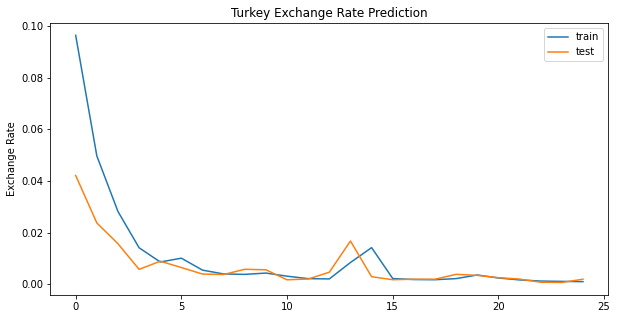

Result for LSTM Unit = 32, Batch Size = 50, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 32ms/step - loss: 0.0360 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.016 
Test Loss: 0.036



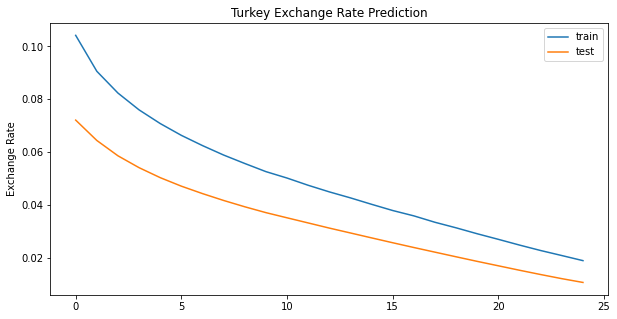

Result for LSTM Unit = 32, Batch Size = 50, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 32ms/step - loss: 0.1421 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.074 
Test Loss: 0.142



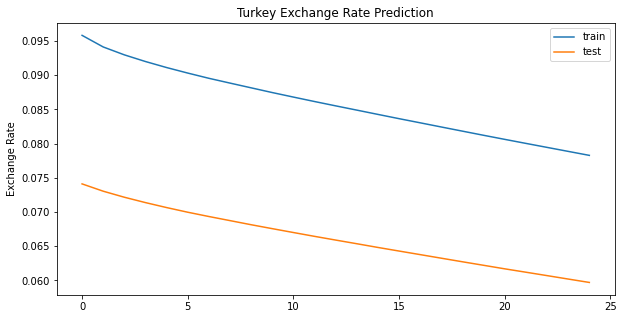

Result for LSTM Unit = 32, Batch Size = 50, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 26ms/step - loss: 0.0018 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



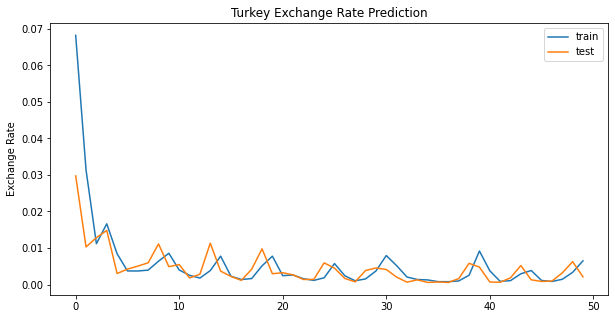

Result for LSTM Unit = 32, Batch Size = 50, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 25ms/step - loss: 0.0043 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.004



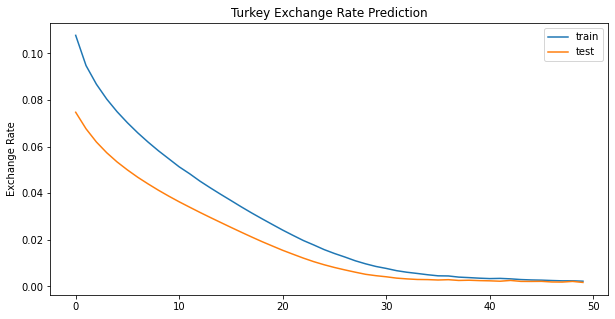

Result for LSTM Unit = 32, Batch Size = 50, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 31ms/step - loss: 0.1719 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.094 
Test Loss: 0.172



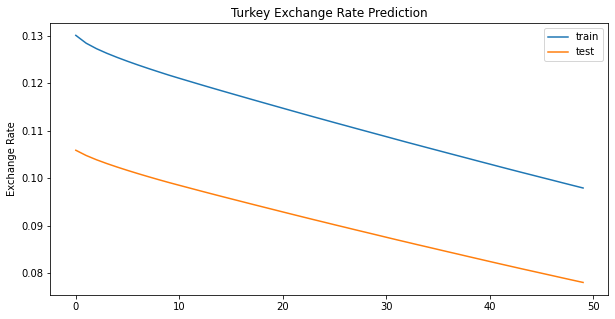

Result for LSTM Unit = 32, Batch Size = 50, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 31ms/step - loss: 9.9929e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



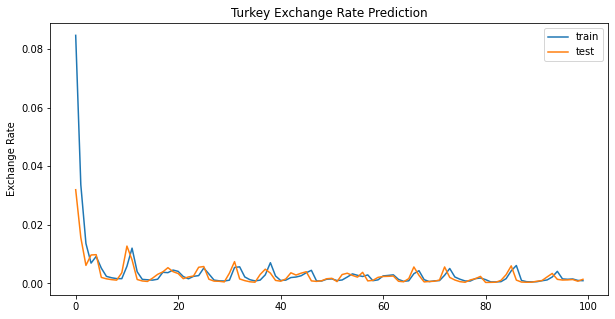

Result for LSTM Unit = 32, Batch Size = 50, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 29ms/step - loss: 0.0013 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



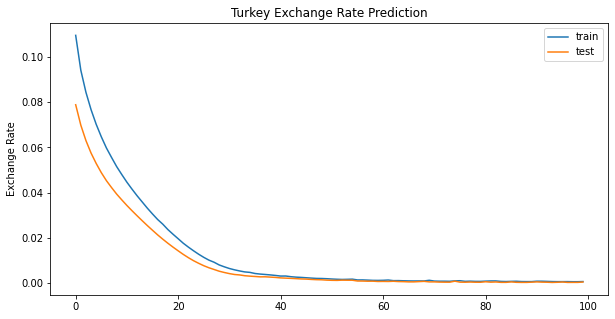

Result for LSTM Unit = 32, Batch Size = 50, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 27ms/step - loss: 0.1313 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.069 
Test Loss: 0.131



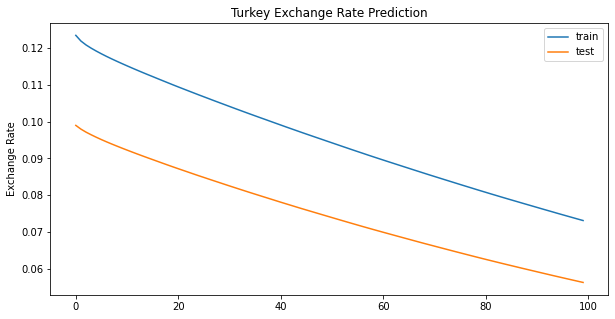

Result for LSTM Unit = 32, Batch Size = 50, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 31ms/step - loss: 5.6575e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



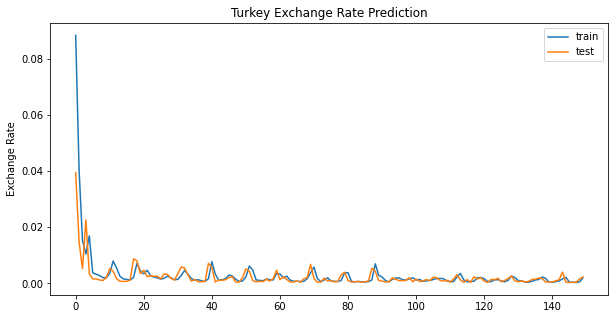

Result for LSTM Unit = 32, Batch Size = 50, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 28ms/step - loss: 9.2008e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



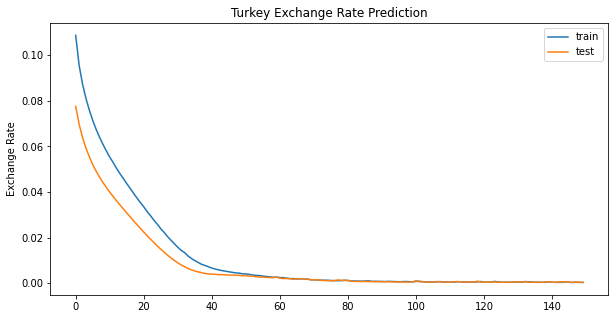

Result for LSTM Unit = 32, Batch Size = 50, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 25ms/step - loss: 0.0879 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.048 
Test Loss: 0.088



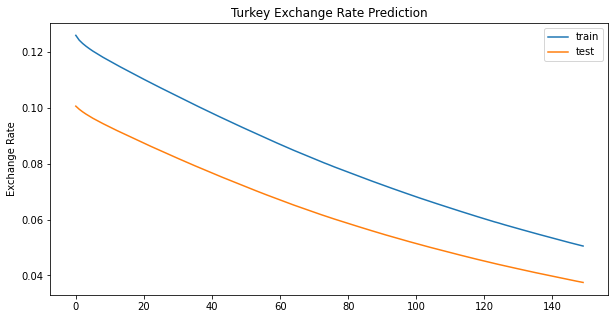

Result for LSTM Unit = 32, Batch Size = 50, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 33ms/step - loss: 7.4966e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



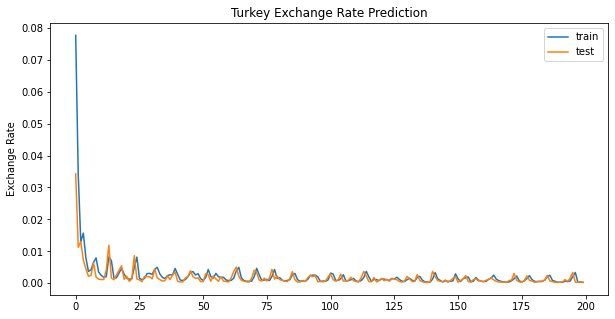

Result for LSTM Unit = 32, Batch Size = 50, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 30ms/step - loss: 9.5670e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



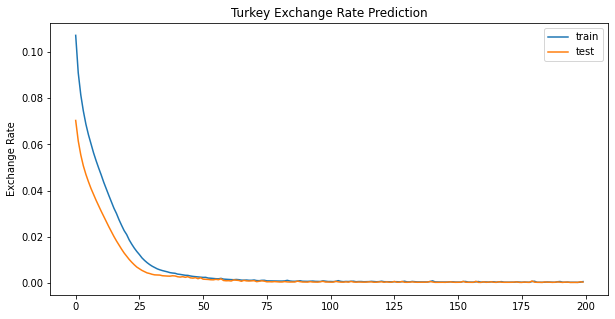

Result for LSTM Unit = 32, Batch Size = 50, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 32ms/step - loss: 0.0576 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.031 
Test Loss: 0.058



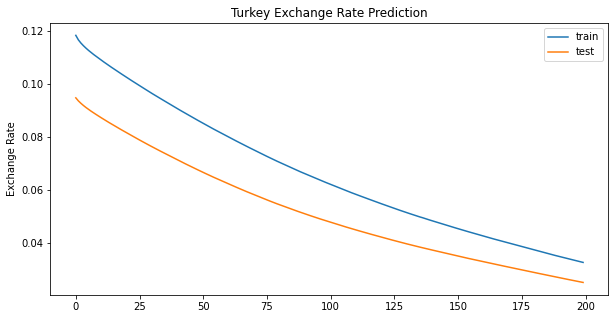

Result for LSTM Unit = 32, Batch Size = 50, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 28ms/step - loss: 4.5367e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



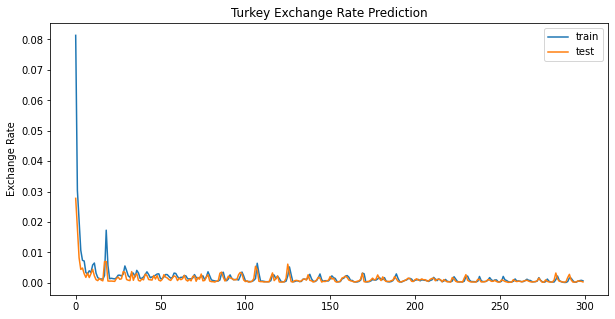

Result for LSTM Unit = 32, Batch Size = 50, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 29ms/step - loss: 8.1982e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



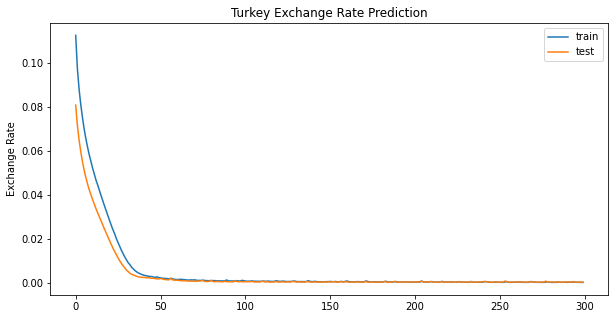

Result for LSTM Unit = 32, Batch Size = 50, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 29ms/step - loss: 0.0398 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.019 
Test Loss: 0.040



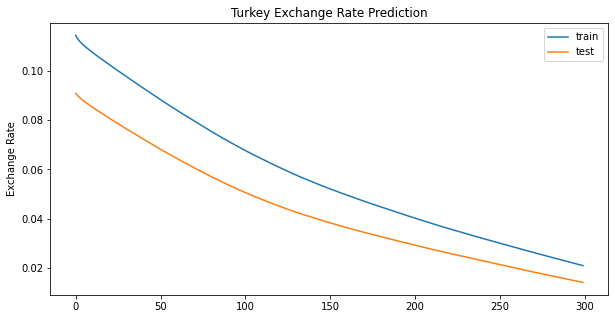

Result for LSTM Unit = 32, Batch Size = 100, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 41ms/step - loss: 0.0041 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.004



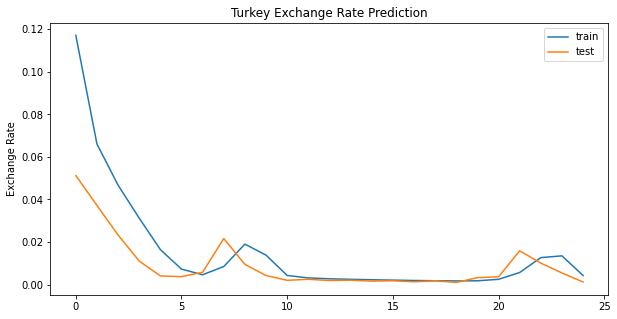

Result for LSTM Unit = 32, Batch Size = 100, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 33ms/step - loss: 0.0610 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.033 
Test Loss: 0.061



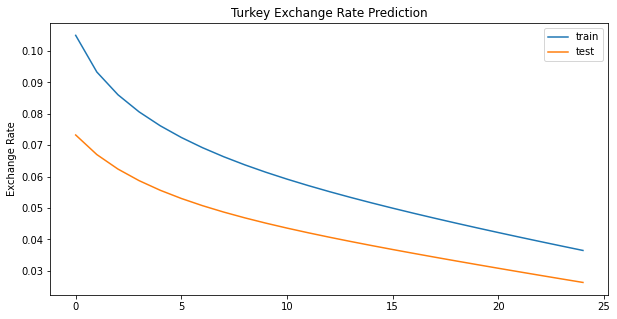

Result for LSTM Unit = 32, Batch Size = 100, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 28ms/step - loss: 0.1490 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.079 
Test Loss: 0.149



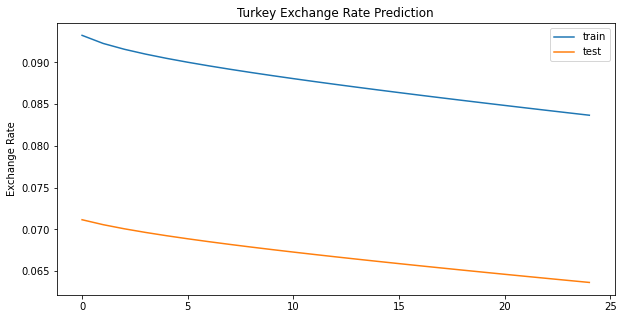

Result for LSTM Unit = 32, Batch Size = 100, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 28ms/step - loss: 0.0038 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.004



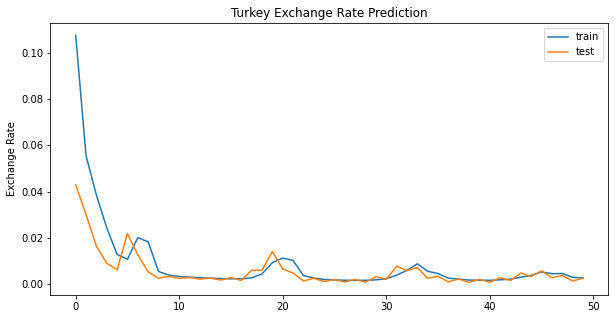

Result for LSTM Unit = 32, Batch Size = 100, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 27ms/step - loss: 0.0154 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.007 
Test Loss: 0.015



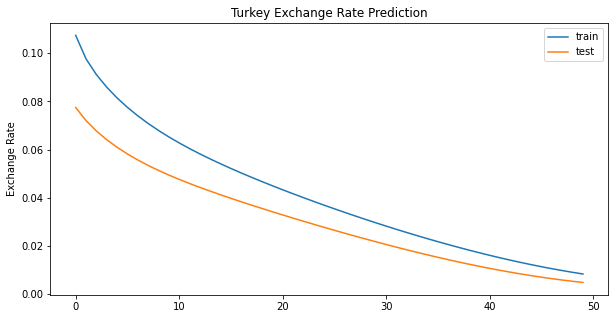

Result for LSTM Unit = 32, Batch Size = 100, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 31ms/step - loss: 0.1580 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.083 
Test Loss: 0.158



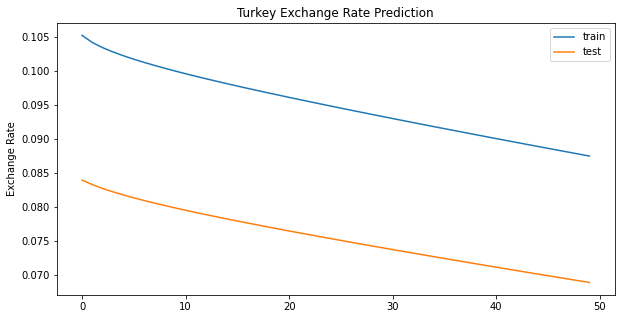

Result for LSTM Unit = 32, Batch Size = 100, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 32ms/step - loss: 0.0032 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.003



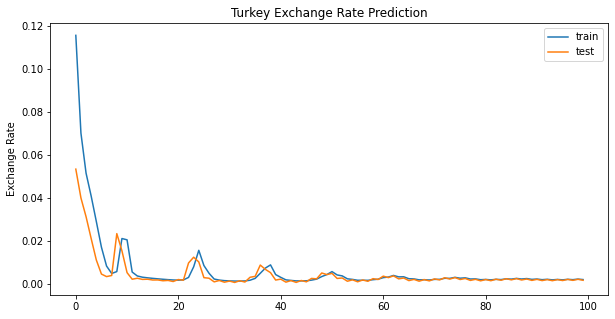

Result for LSTM Unit = 32, Batch Size = 100, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 31ms/step - loss: 0.0029 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.003



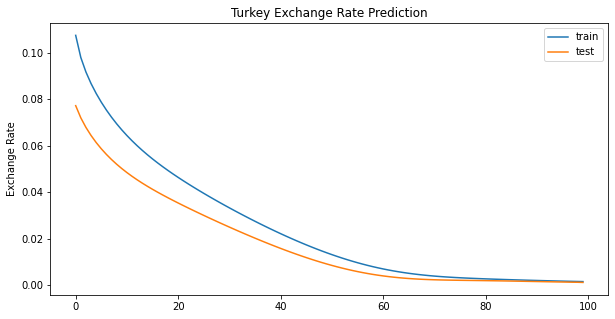

Result for LSTM Unit = 32, Batch Size = 100, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 28ms/step - loss: 0.1650 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.091 
Test Loss: 0.165



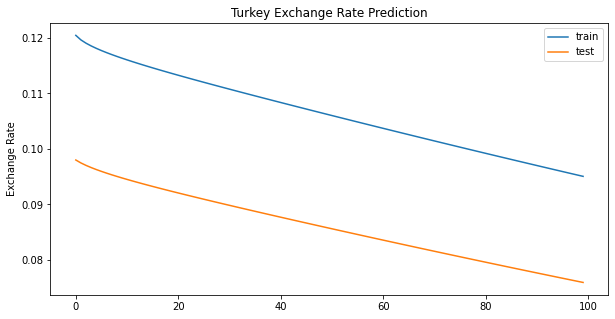

Result for LSTM Unit = 32, Batch Size = 100, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 27ms/step - loss: 0.0046 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.005



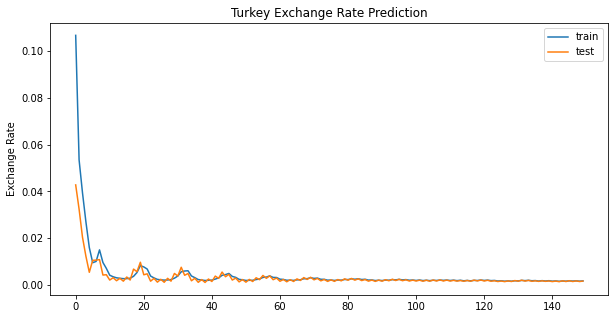

Result for LSTM Unit = 32, Batch Size = 100, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 24ms/step - loss: 0.0018 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



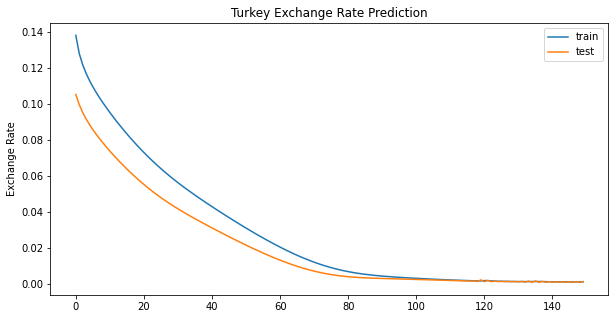

Result for LSTM Unit = 32, Batch Size = 100, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 31ms/step - loss: 0.1181 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.063 
Test Loss: 0.118



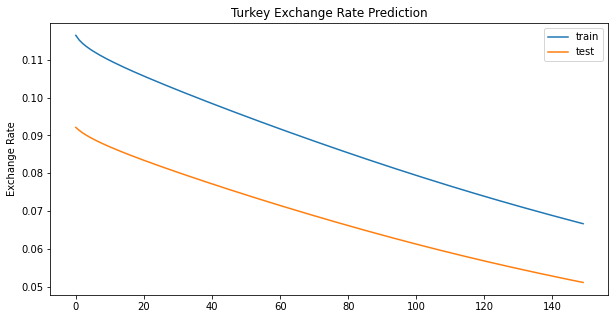

Result for LSTM Unit = 32, Batch Size = 100, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 20ms/step - loss: 0.0041 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.004



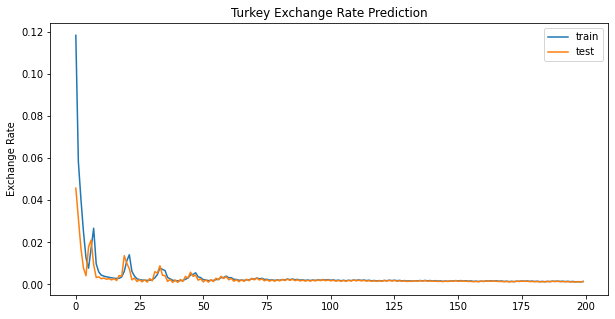

Result for LSTM Unit = 32, Batch Size = 100, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 30ms/step - loss: 0.0012 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



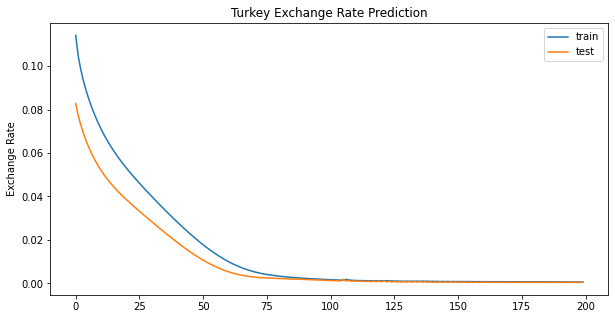

Result for LSTM Unit = 32, Batch Size = 100, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 26ms/step - loss: 0.1208 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.063 
Test Loss: 0.121



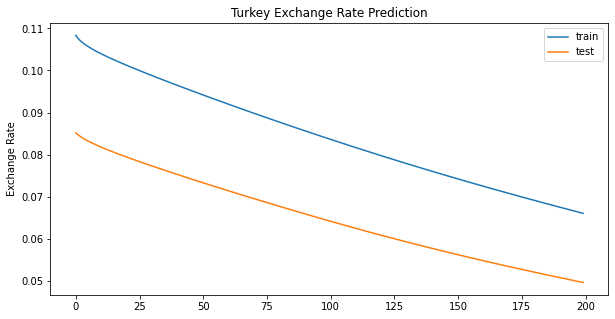

Result for LSTM Unit = 32, Batch Size = 100, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 29ms/step - loss: 7.6706e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



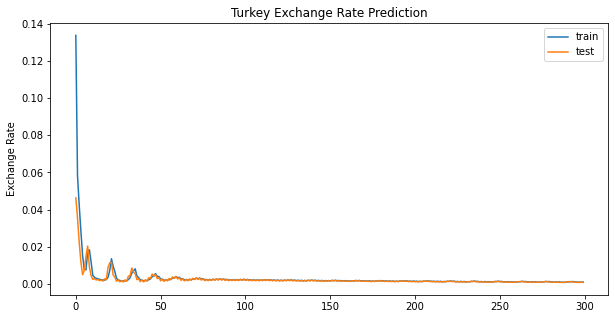

Result for LSTM Unit = 32, Batch Size = 100, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 28ms/step - loss: 0.0011 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



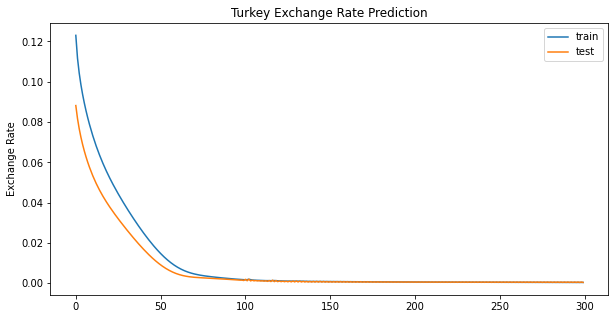

Result for LSTM Unit = 32, Batch Size = 100, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 26ms/step - loss: 0.0703 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.038 
Test Loss: 0.070



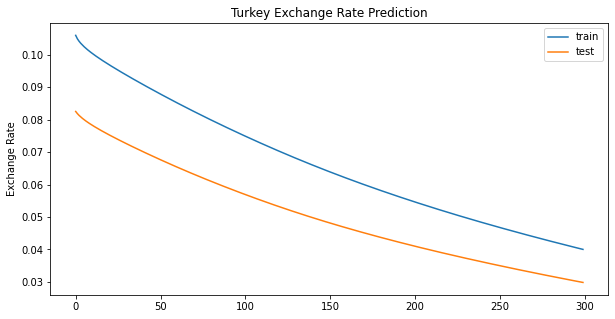

Result for LSTM Unit = 50, Batch Size = 10, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 27ms/step - loss: 0.0012 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



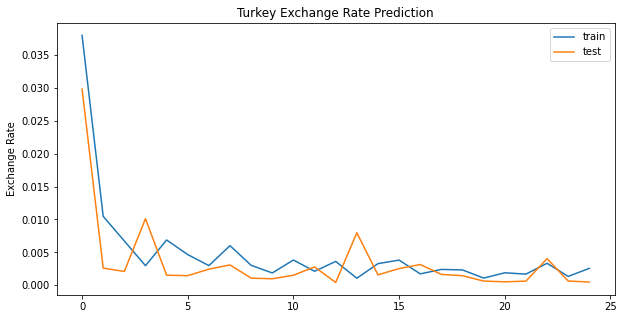

Result for LSTM Unit = 50, Batch Size = 10, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 26ms/step - loss: 0.0015 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



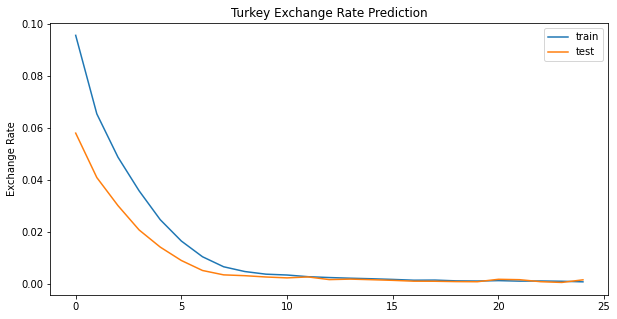

Result for LSTM Unit = 50, Batch Size = 10, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 36ms/step - loss: 0.1056 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.054 
Test Loss: 0.106



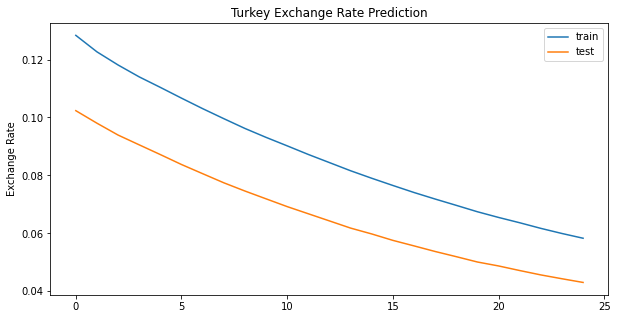

Result for LSTM Unit = 50, Batch Size = 10, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 29ms/step - loss: 6.1541e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



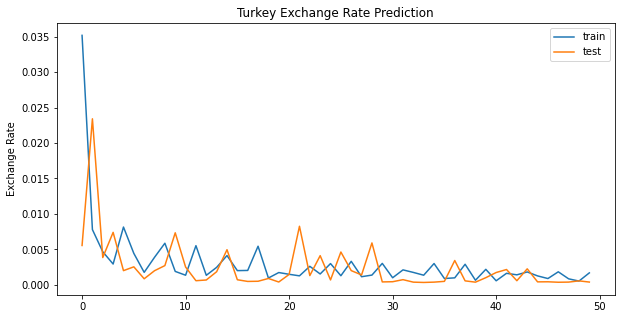

Result for LSTM Unit = 50, Batch Size = 10, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 36ms/step - loss: 0.0010 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



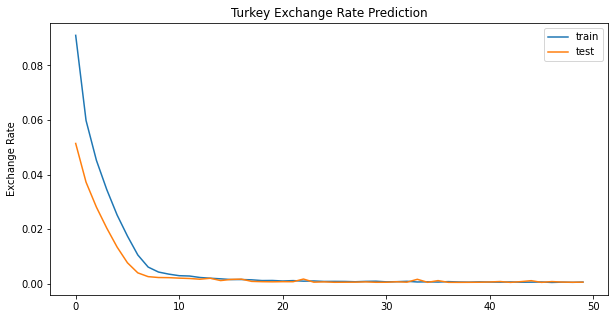

Result for LSTM Unit = 50, Batch Size = 10, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 24ms/step - loss: 0.0383 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.020 
Test Loss: 0.038



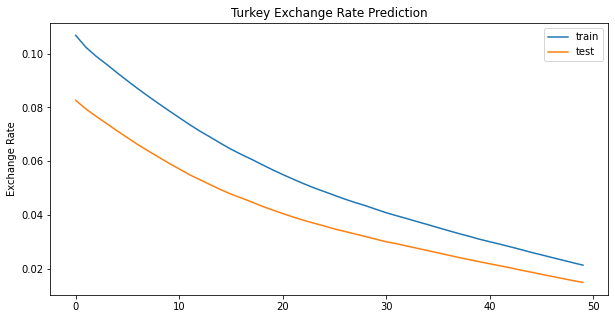

Result for LSTM Unit = 50, Batch Size = 10, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 26ms/step - loss: 4.5417e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



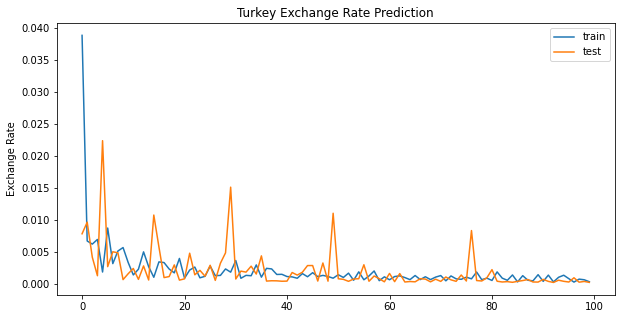

Result for LSTM Unit = 50, Batch Size = 10, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 41ms/step - loss: 6.6793e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



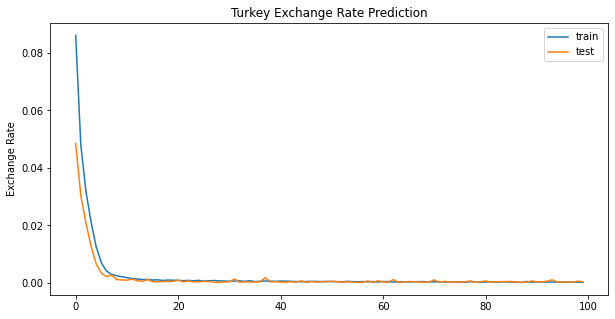

Result for LSTM Unit = 50, Batch Size = 10, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 29ms/step - loss: 0.0046 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.005



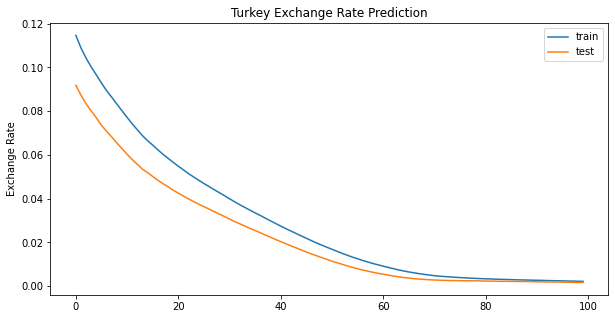

Result for LSTM Unit = 50, Batch Size = 10, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 26ms/step - loss: 3.4854e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



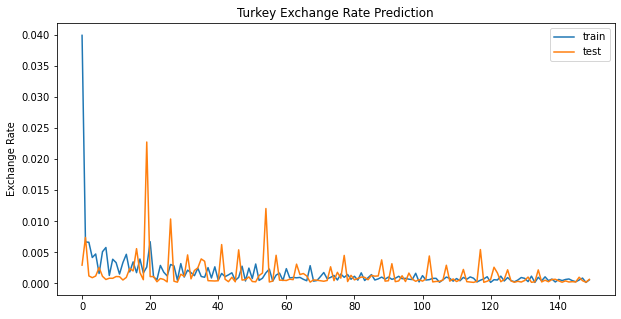

Result for LSTM Unit = 50, Batch Size = 10, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 30ms/step - loss: 9.1717e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



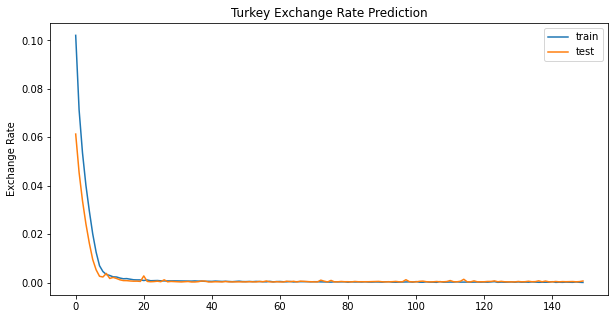

Result for LSTM Unit = 50, Batch Size = 10, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 30ms/step - loss: 0.0016 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



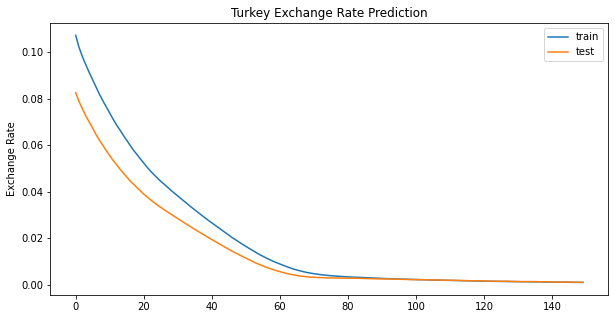

Result for LSTM Unit = 50, Batch Size = 10, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 31ms/step - loss: 3.8828e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



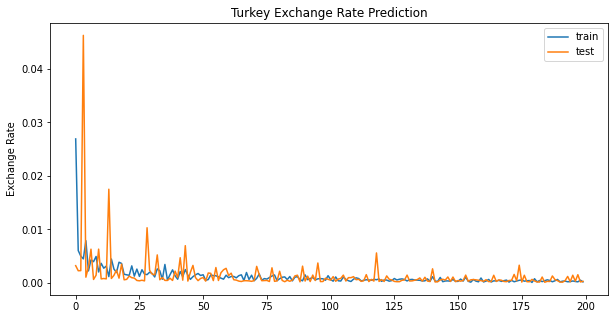

Result for LSTM Unit = 50, Batch Size = 10, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 39ms/step - loss: 5.1195e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



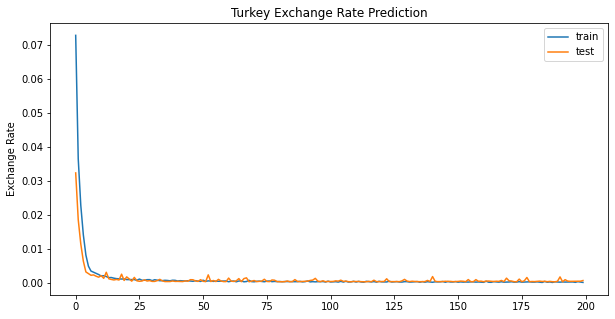

Result for LSTM Unit = 50, Batch Size = 10, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 26ms/step - loss: 0.0016 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



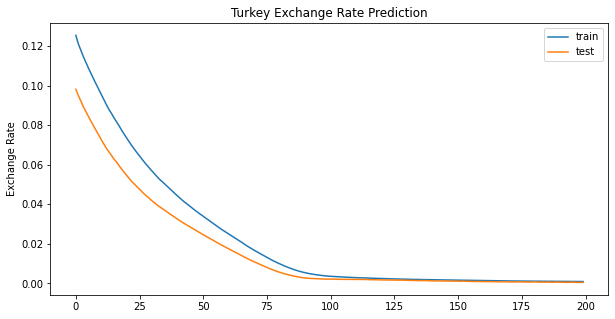

Result for LSTM Unit = 50, Batch Size = 10, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 27ms/step - loss: 3.5506e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



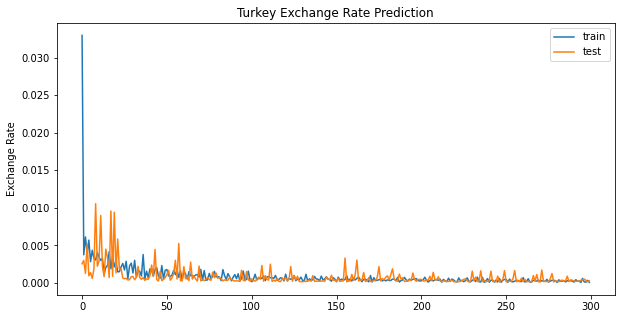

Result for LSTM Unit = 50, Batch Size = 10, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 29ms/step - loss: 6.3990e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



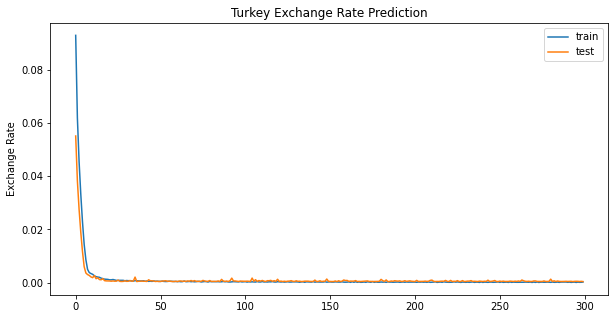

Result for LSTM Unit = 50, Batch Size = 10, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 27ms/step - loss: 0.0010 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



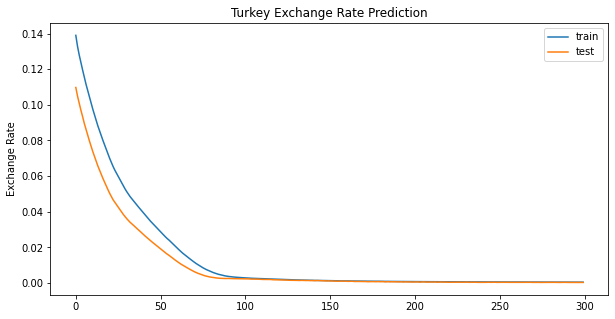

Result for LSTM Unit = 50, Batch Size = 20, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 24ms/step - loss: 0.0012 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



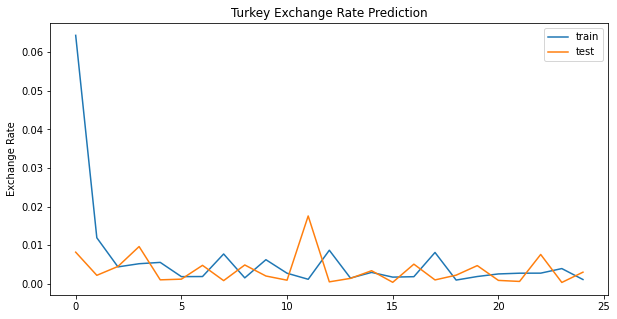

Result for LSTM Unit = 50, Batch Size = 20, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 27ms/step - loss: 0.0025 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.003



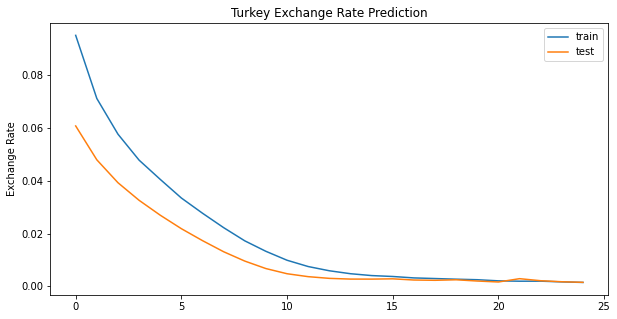

Result for LSTM Unit = 50, Batch Size = 20, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 28ms/step - loss: 0.1275 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.067 
Test Loss: 0.128



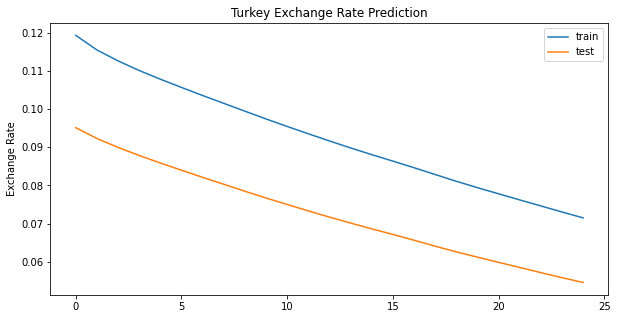

Result for LSTM Unit = 50, Batch Size = 20, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 36ms/step - loss: 6.4590e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



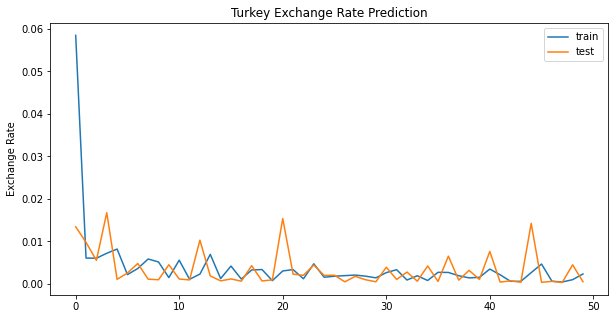

Result for LSTM Unit = 50, Batch Size = 20, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 30ms/step - loss: 0.0011 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



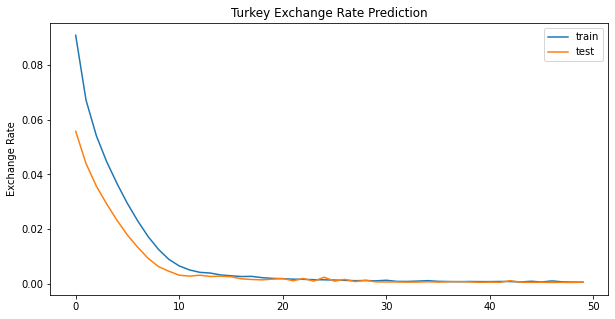

Result for LSTM Unit = 50, Batch Size = 20, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 26ms/step - loss: 0.0916 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.049 
Test Loss: 0.092



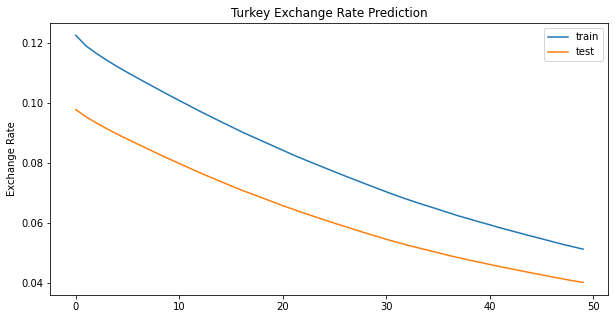

Result for LSTM Unit = 50, Batch Size = 20, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 30ms/step - loss: 7.0114e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



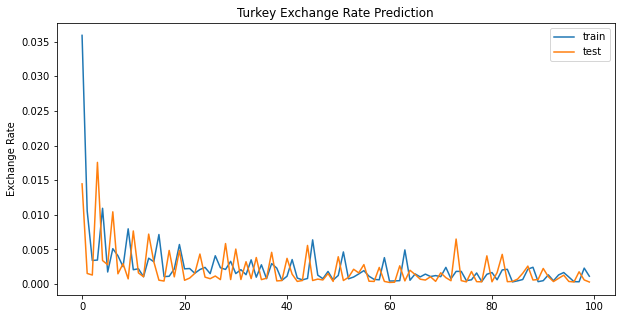

Result for LSTM Unit = 50, Batch Size = 20, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 33ms/step - loss: 8.3157e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



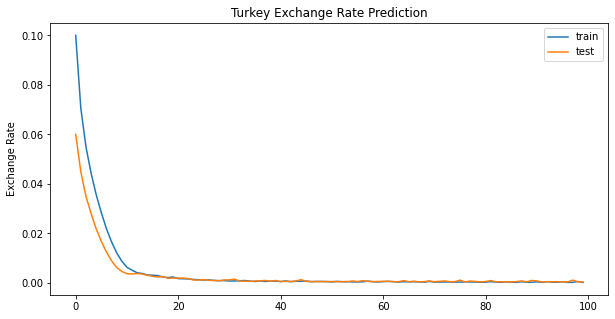

Result for LSTM Unit = 50, Batch Size = 20, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 29ms/step - loss: 0.0270 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.013 
Test Loss: 0.027



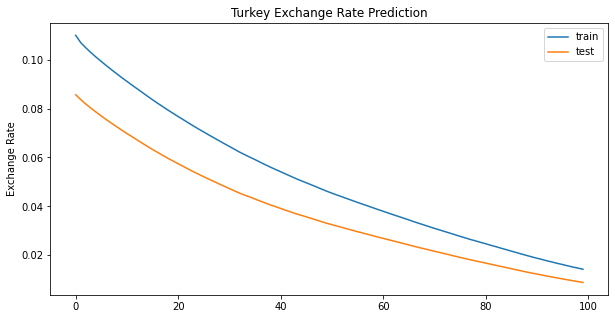

Result for LSTM Unit = 50, Batch Size = 20, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 29ms/step - loss: 4.7299e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



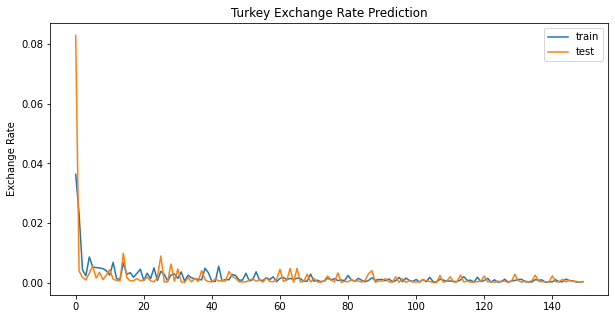

Result for LSTM Unit = 50, Batch Size = 20, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 27ms/step - loss: 7.7517e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



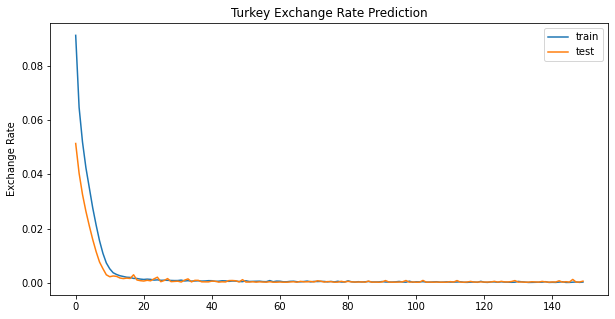

Result for LSTM Unit = 50, Batch Size = 20, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 41ms/step - loss: 0.0080 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.003 
Test Loss: 0.008



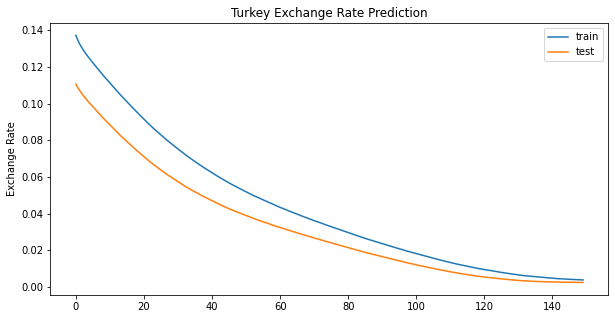

Result for LSTM Unit = 50, Batch Size = 20, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 29ms/step - loss: 3.0196e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



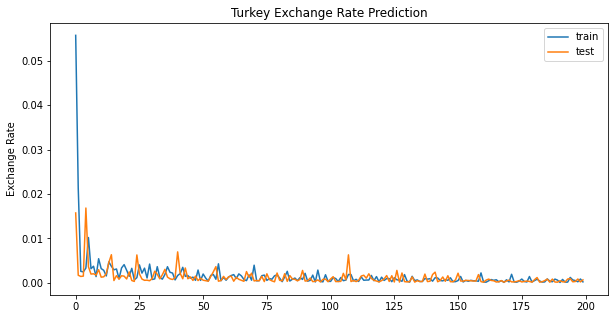

Result for LSTM Unit = 50, Batch Size = 20, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 25ms/step - loss: 7.3656e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



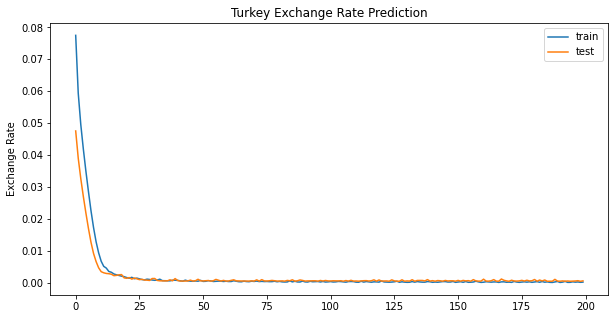

Result for LSTM Unit = 50, Batch Size = 20, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 29ms/step - loss: 0.0035 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.004



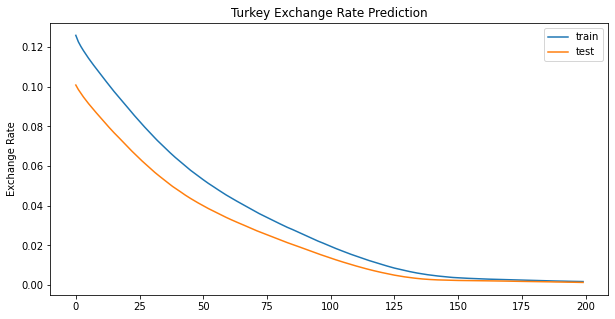

Result for LSTM Unit = 50, Batch Size = 20, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 31ms/step - loss: 3.9076e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



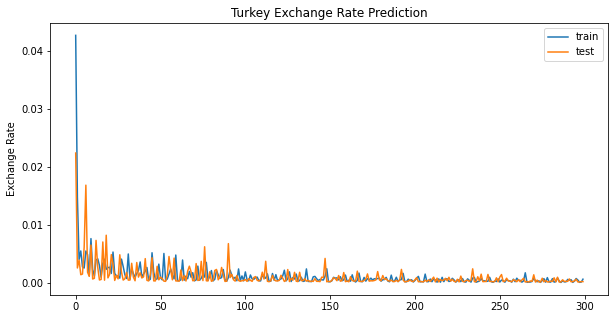

Result for LSTM Unit = 50, Batch Size = 20, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 32ms/step - loss: 5.4921e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



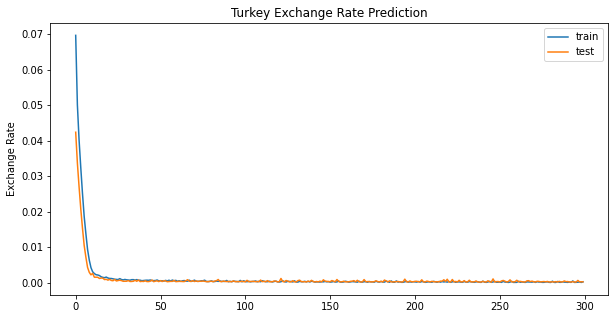

Result for LSTM Unit = 50, Batch Size = 20, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 41ms/step - loss: 0.0016 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



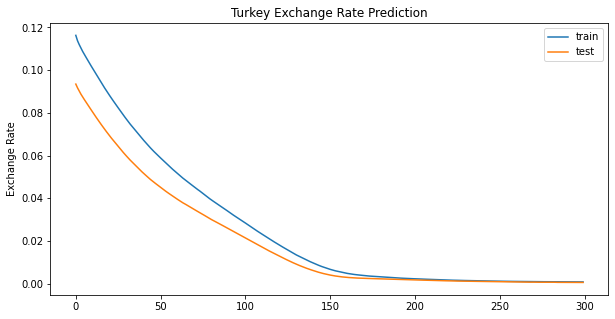

Result for LSTM Unit = 50, Batch Size = 50, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 27ms/step - loss: 0.0018 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



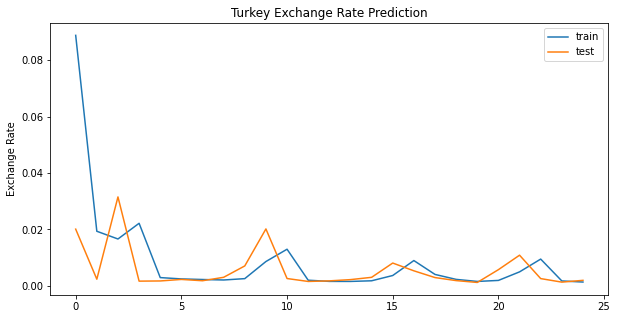

Result for LSTM Unit = 50, Batch Size = 50, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 27ms/step - loss: 0.0320 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.015 
Test Loss: 0.032



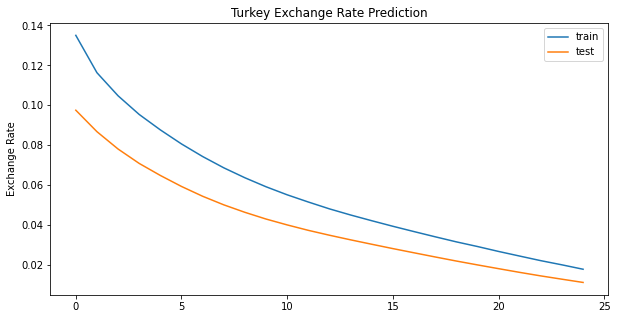

Result for LSTM Unit = 50, Batch Size = 50, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 30ms/step - loss: 0.1799 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.097 
Test Loss: 0.180



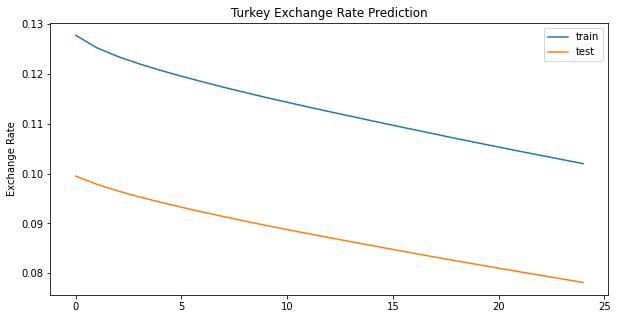

Result for LSTM Unit = 50, Batch Size = 50, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 26ms/step - loss: 0.0021 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



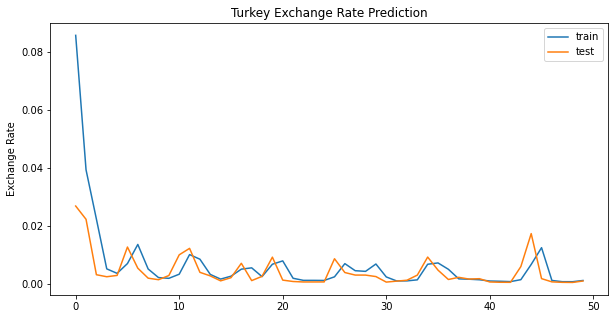

Result for LSTM Unit = 50, Batch Size = 50, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 30ms/step - loss: 0.0021 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



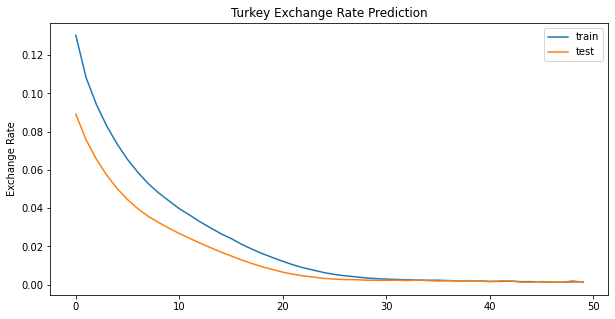

Result for LSTM Unit = 50, Batch Size = 50, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 30ms/step - loss: 0.1489 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.081 
Test Loss: 0.149



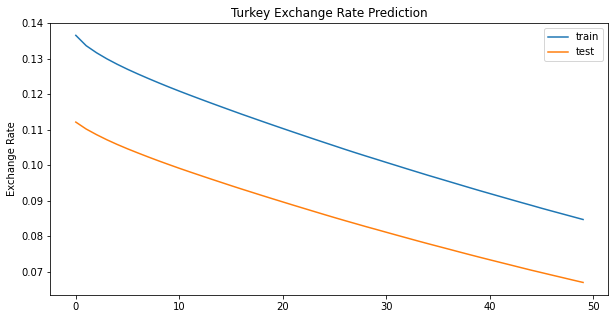

Result for LSTM Unit = 50, Batch Size = 50, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 28ms/step - loss: 0.0011 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



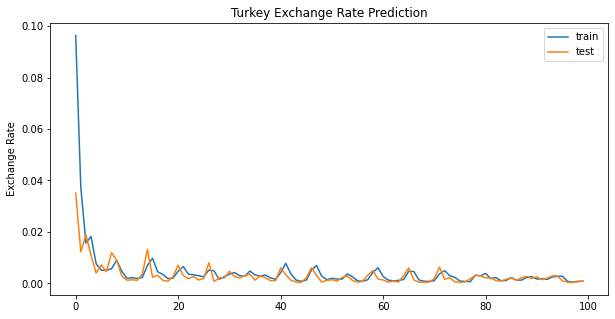

Result for LSTM Unit = 50, Batch Size = 50, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 24ms/step - loss: 0.0012 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



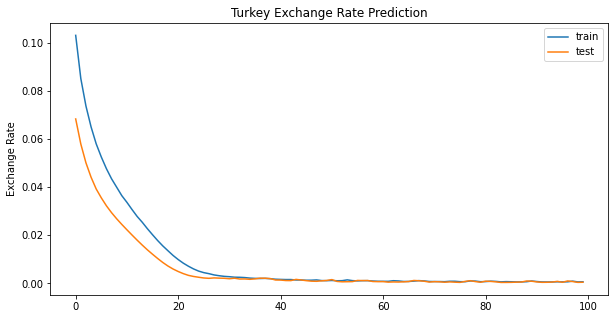

Result for LSTM Unit = 50, Batch Size = 50, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 25ms/step - loss: 0.0889 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.046 
Test Loss: 0.089



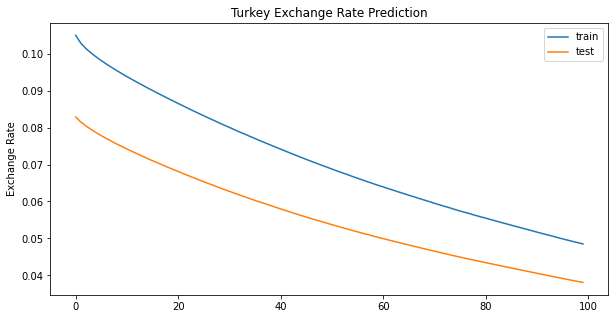

Result for LSTM Unit = 50, Batch Size = 50, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 28ms/step - loss: 9.4929e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



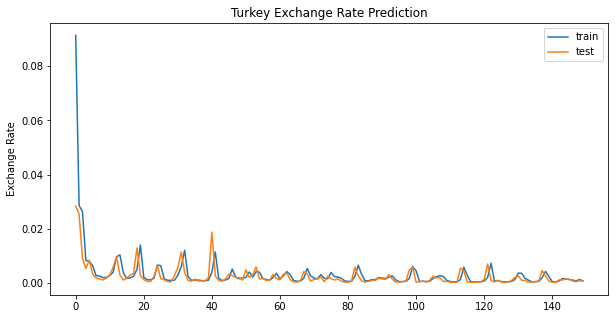

Result for LSTM Unit = 50, Batch Size = 50, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 35ms/step - loss: 6.0998e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



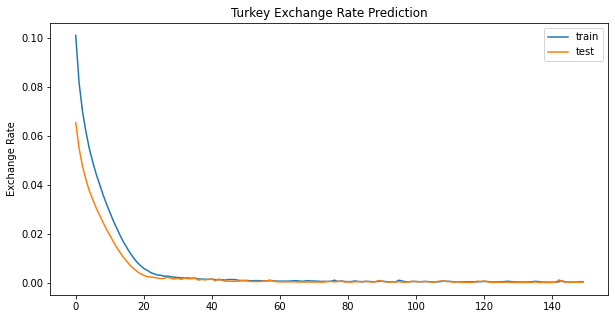

Result for LSTM Unit = 50, Batch Size = 50, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 24ms/step - loss: 0.0489 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.027 
Test Loss: 0.049



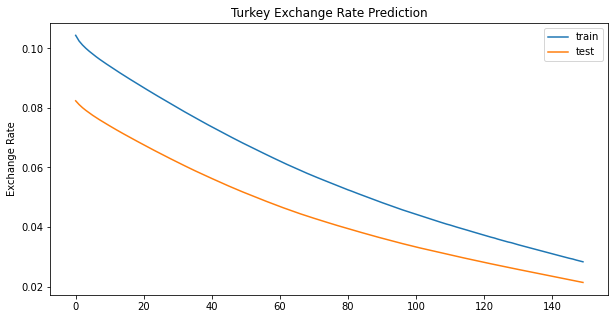

Result for LSTM Unit = 50, Batch Size = 50, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 30ms/step - loss: 6.4426e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



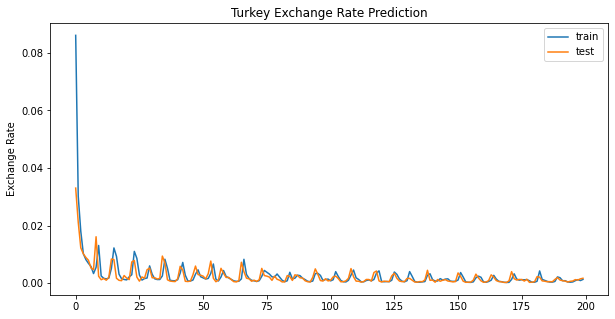

Result for LSTM Unit = 50, Batch Size = 50, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 27ms/step - loss: 9.2584e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



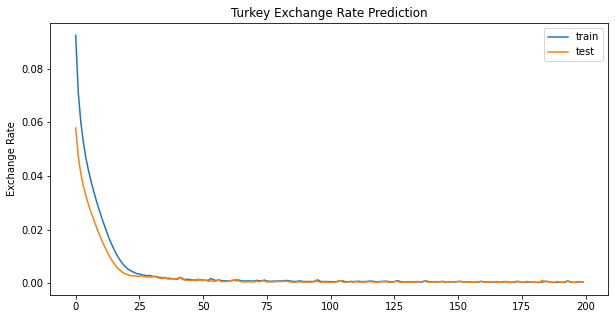

Result for LSTM Unit = 50, Batch Size = 50, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 33ms/step - loss: 0.0237 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.011 
Test Loss: 0.024



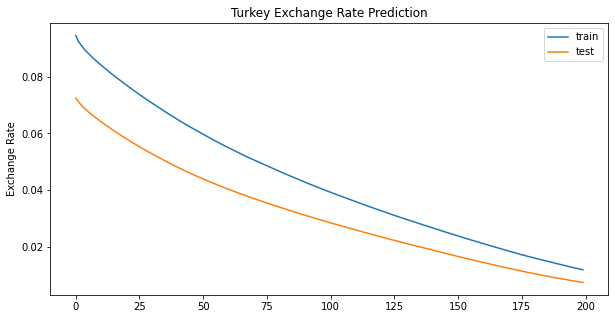

Result for LSTM Unit = 50, Batch Size = 50, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 26ms/step - loss: 4.8682e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



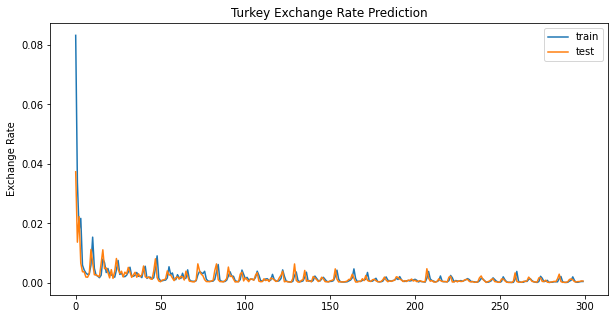

Result for LSTM Unit = 50, Batch Size = 50, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 26ms/step - loss: 8.0728e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



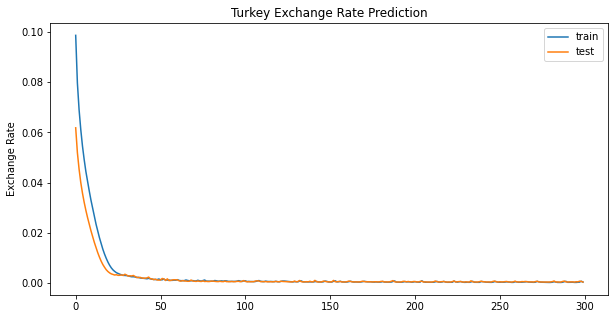

Result for LSTM Unit = 50, Batch Size = 50, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 27ms/step - loss: 0.0110 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.005 
Test Loss: 0.011



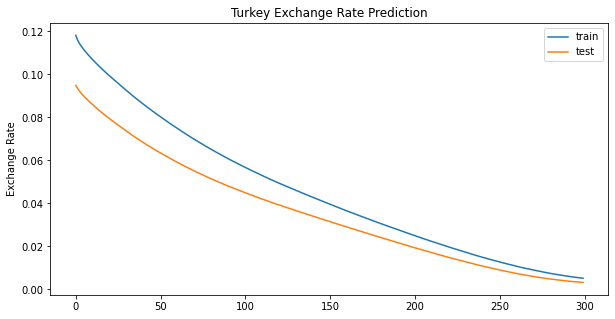

Result for LSTM Unit = 50, Batch Size = 100, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 25ms/step - loss: 0.0051 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.005



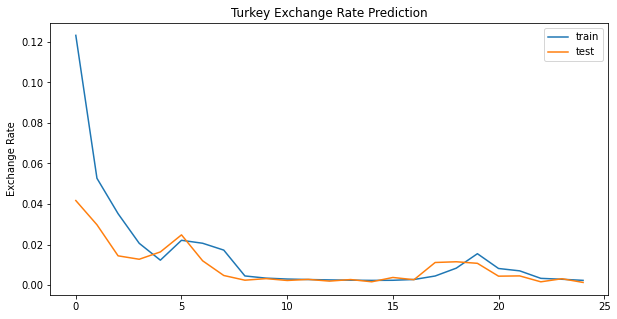

Result for LSTM Unit = 50, Batch Size = 100, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 29ms/step - loss: 0.0514 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.027 
Test Loss: 0.051



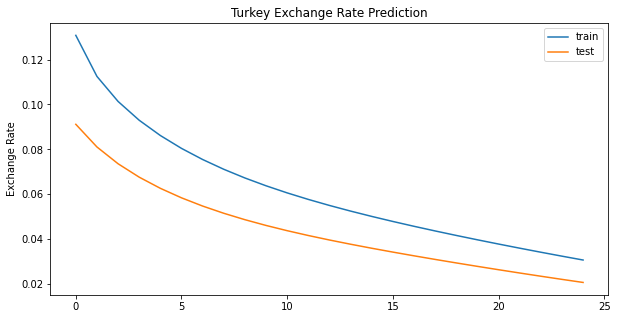

Result for LSTM Unit = 50, Batch Size = 100, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 28ms/step - loss: 0.1845 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.100 
Test Loss: 0.184



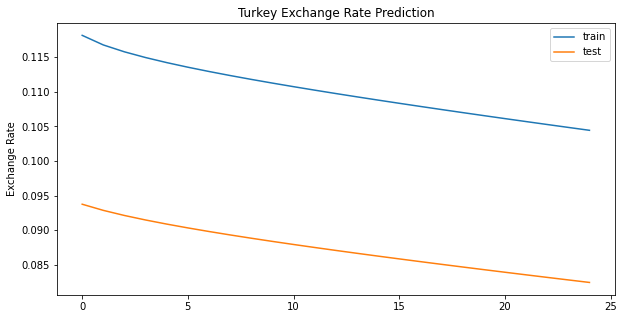

Result for LSTM Unit = 50, Batch Size = 100, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 31ms/step - loss: 0.0071 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.003 
Test Loss: 0.007



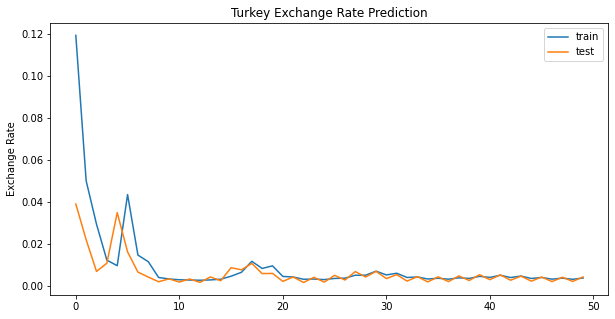

Result for LSTM Unit = 50, Batch Size = 100, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 27ms/step - loss: 0.0116 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.005 
Test Loss: 0.012



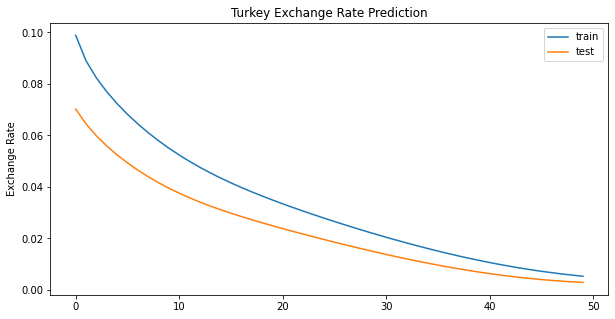

Result for LSTM Unit = 50, Batch Size = 100, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 33ms/step - loss: 0.1620 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.087 
Test Loss: 0.162



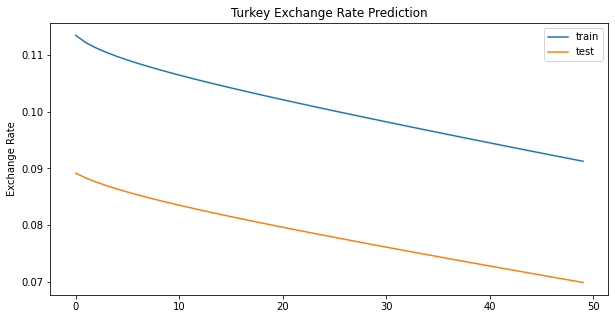

Result for LSTM Unit = 50, Batch Size = 100, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 27ms/step - loss: 0.0061 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.003 
Test Loss: 0.006



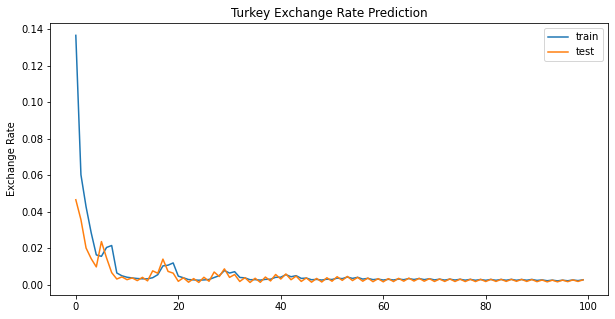

Result for LSTM Unit = 50, Batch Size = 100, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 28ms/step - loss: 0.0024 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



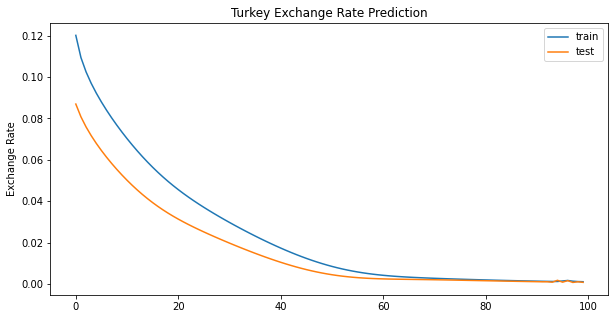

Result for LSTM Unit = 50, Batch Size = 100, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 33ms/step - loss: 0.1475 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.079 
Test Loss: 0.147



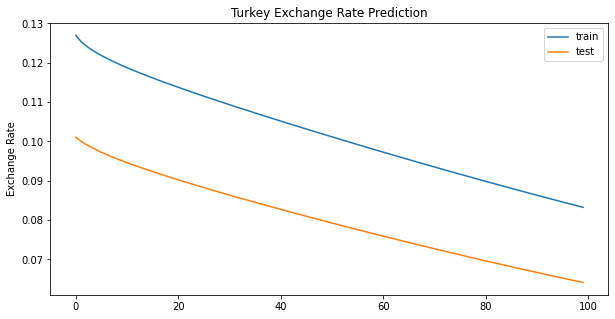

Result for LSTM Unit = 50, Batch Size = 100, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 24ms/step - loss: 0.0053 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.005



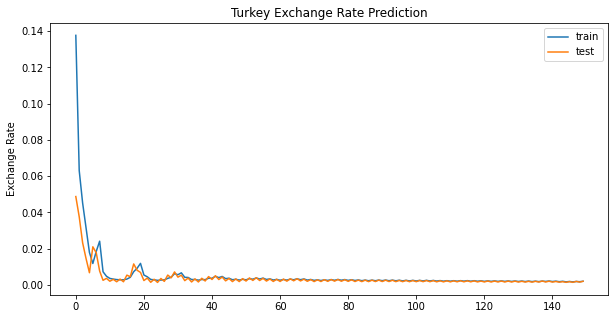

Result for LSTM Unit = 50, Batch Size = 100, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 23ms/step - loss: 0.0016 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



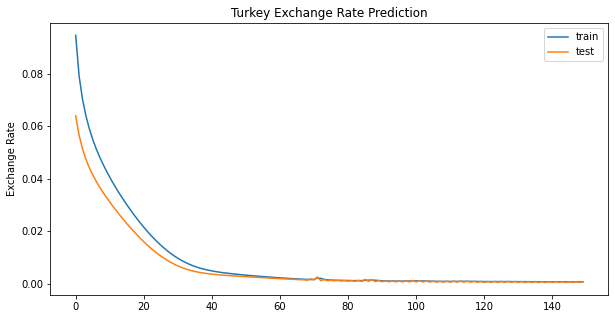

Result for LSTM Unit = 50, Batch Size = 100, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 25ms/step - loss: 0.1018 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.053 
Test Loss: 0.102



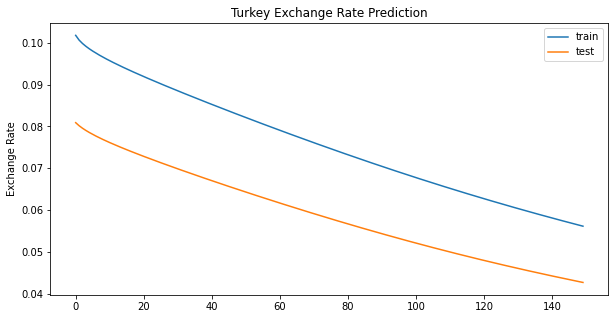

Result for LSTM Unit = 50, Batch Size = 100, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 29ms/step - loss: 0.0027 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.003



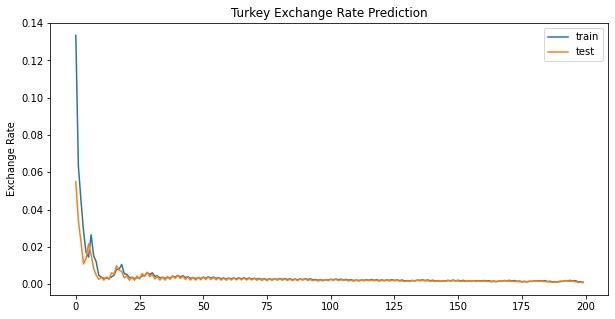

Result for LSTM Unit = 50, Batch Size = 100, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 25ms/step - loss: 0.0012 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



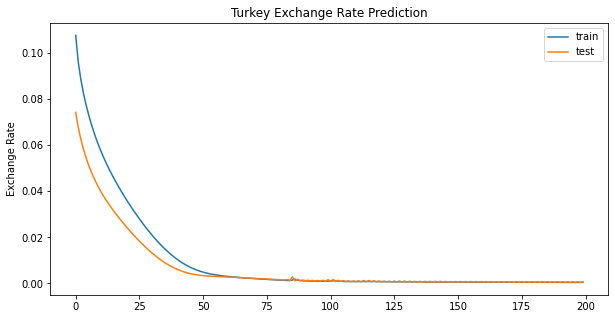

Result for LSTM Unit = 50, Batch Size = 100, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 28ms/step - loss: 0.1015 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.053 
Test Loss: 0.102



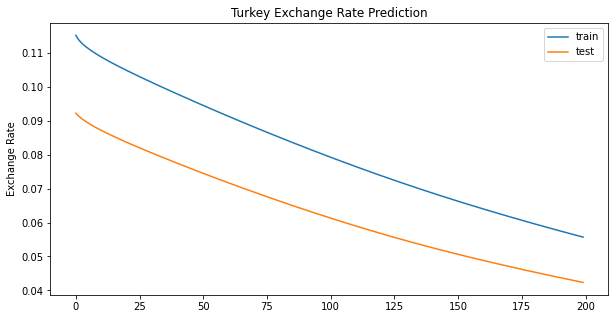

Result for LSTM Unit = 50, Batch Size = 100, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 30ms/step - loss: 0.0030 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.003



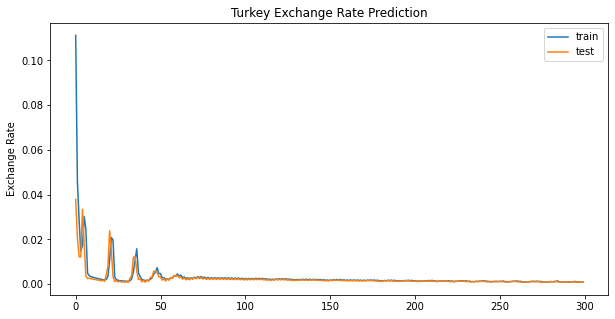

Result for LSTM Unit = 50, Batch Size = 100, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 26ms/step - loss: 0.0014 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



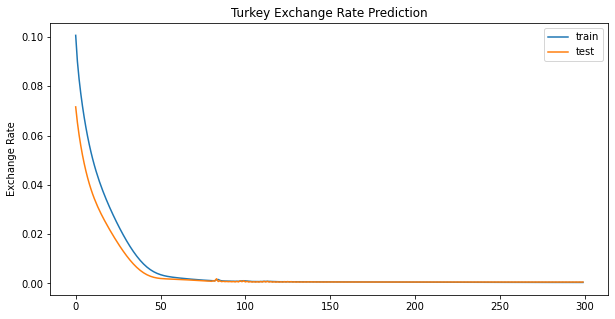

Result for LSTM Unit = 50, Batch Size = 100, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 28ms/step - loss: 0.0518 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.027 
Test Loss: 0.052



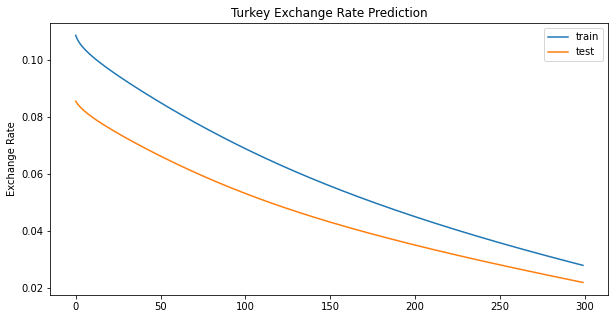

Result for LSTM Unit = 100, Batch Size = 10, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 28ms/step - loss: 0.0012 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



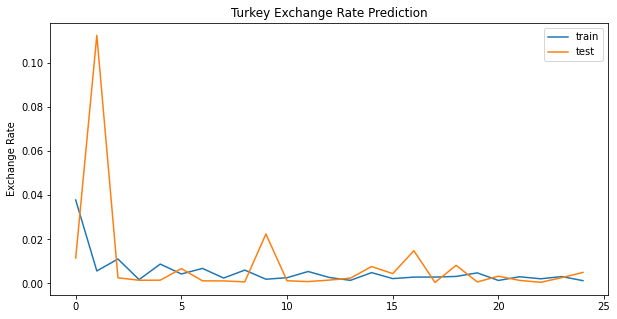

Result for LSTM Unit = 100, Batch Size = 10, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 30ms/step - loss: 0.0015 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



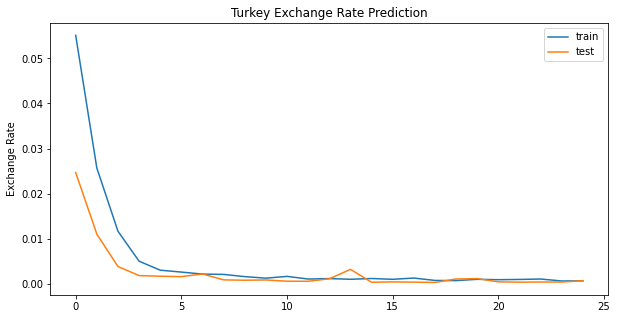

Result for LSTM Unit = 100, Batch Size = 10, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 27ms/step - loss: 0.0454 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.022 
Test Loss: 0.045



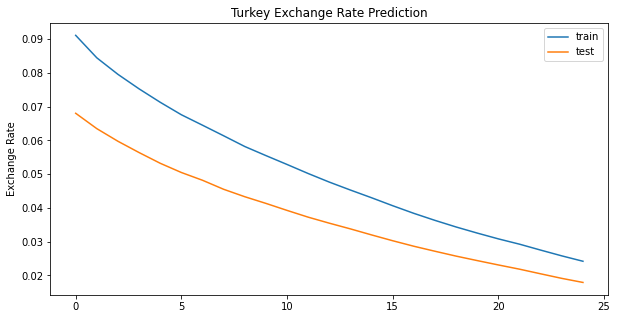

Result for LSTM Unit = 100, Batch Size = 10, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 35ms/step - loss: 8.0413e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



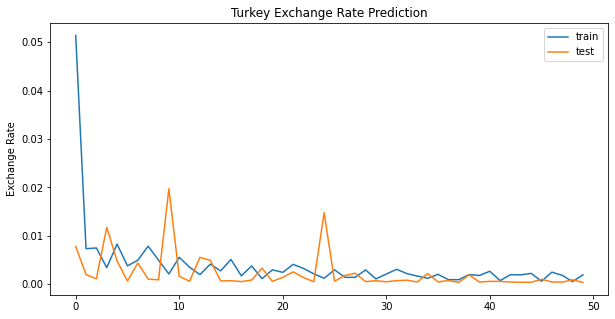

Result for LSTM Unit = 100, Batch Size = 10, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 29ms/step - loss: 8.9826e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



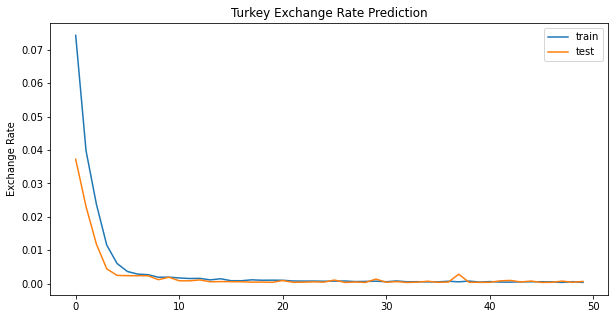

Result for LSTM Unit = 100, Batch Size = 10, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 32ms/step - loss: 0.0055 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.003 
Test Loss: 0.006



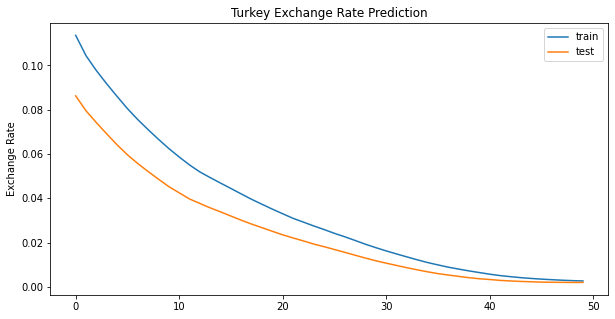

Result for LSTM Unit = 100, Batch Size = 10, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 36ms/step - loss: 6.1072e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



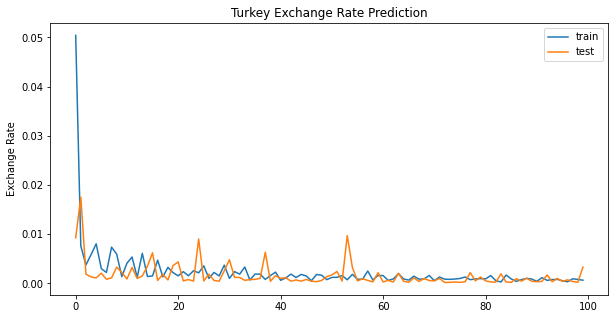

Result for LSTM Unit = 100, Batch Size = 10, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 29ms/step - loss: 6.8239e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



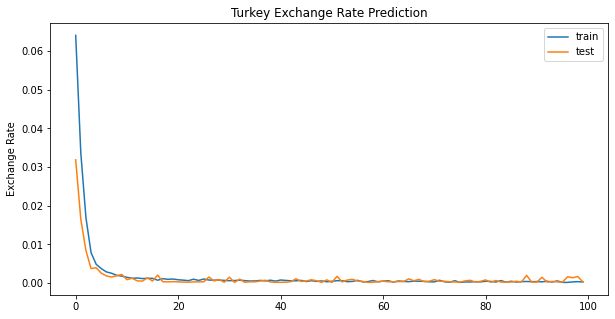

Result for LSTM Unit = 100, Batch Size = 10, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 30ms/step - loss: 0.0022 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



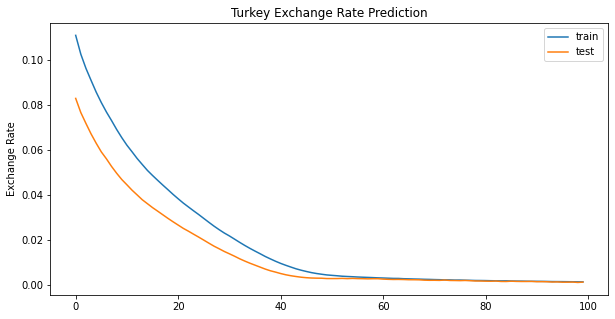

Result for LSTM Unit = 100, Batch Size = 10, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 31ms/step - loss: 5.1126e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



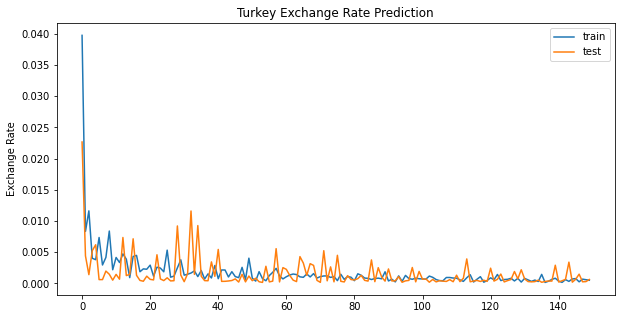

Result for LSTM Unit = 100, Batch Size = 10, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 31ms/step - loss: 6.4648e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



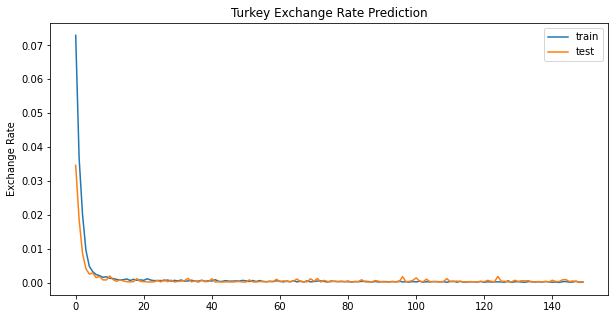

Result for LSTM Unit = 100, Batch Size = 10, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 32ms/step - loss: 0.0013 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



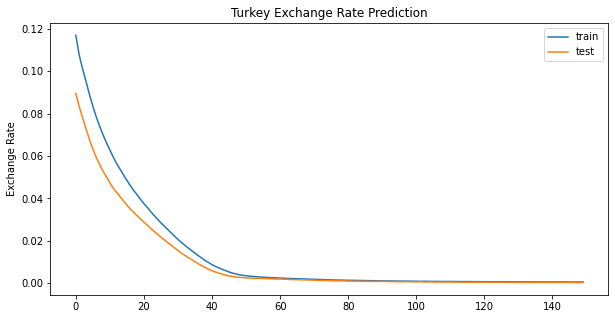

Result for LSTM Unit = 100, Batch Size = 10, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 30ms/step - loss: 3.4935e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



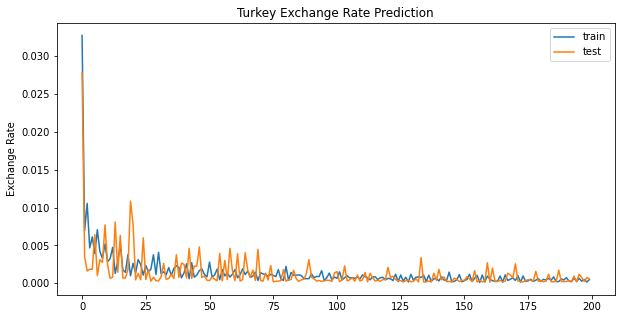

Result for LSTM Unit = 100, Batch Size = 10, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 31ms/step - loss: 4.5944e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



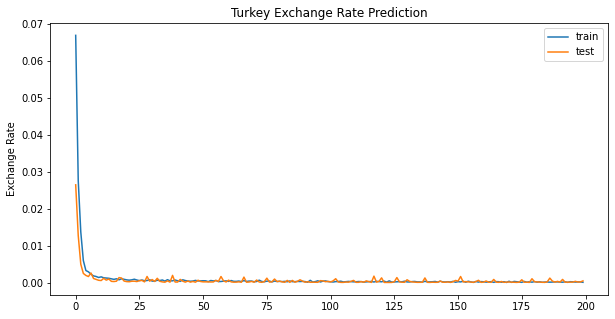

Result for LSTM Unit = 100, Batch Size = 10, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 26ms/step - loss: 9.6295e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



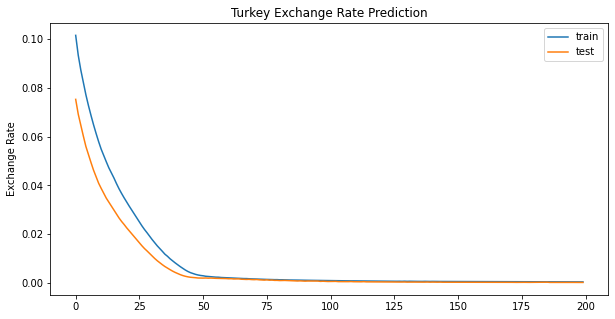

Result for LSTM Unit = 100, Batch Size = 10, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 30ms/step - loss: 4.5598e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



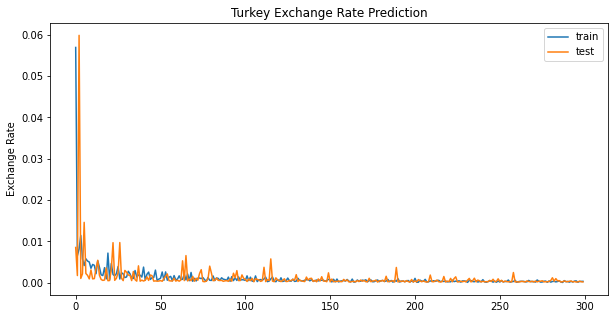

Result for LSTM Unit = 100, Batch Size = 10, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 40ms/step - loss: 4.8395e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



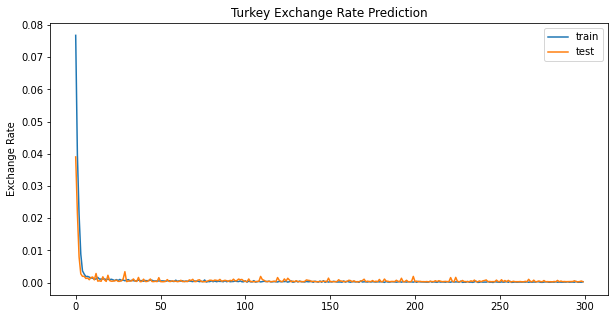

Result for LSTM Unit = 100, Batch Size = 10, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 37ms/step - loss: 8.6003e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



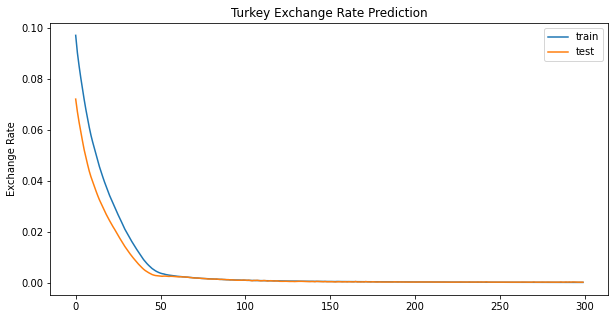

Result for LSTM Unit = 100, Batch Size = 20, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 32ms/step - loss: 0.0021 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



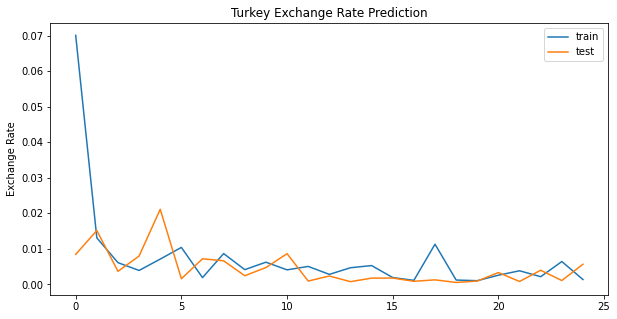

Result for LSTM Unit = 100, Batch Size = 20, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 30ms/step - loss: 0.0026 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.003



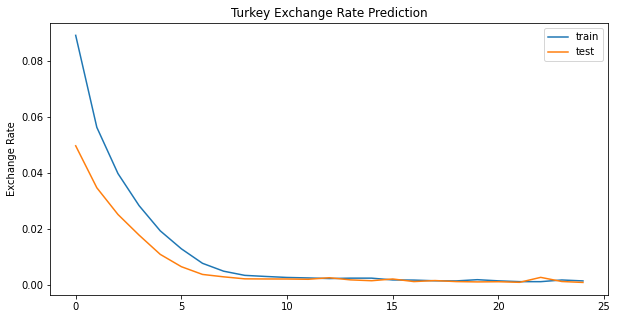

Result for LSTM Unit = 100, Batch Size = 20, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 34ms/step - loss: 0.1027 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.052 
Test Loss: 0.103



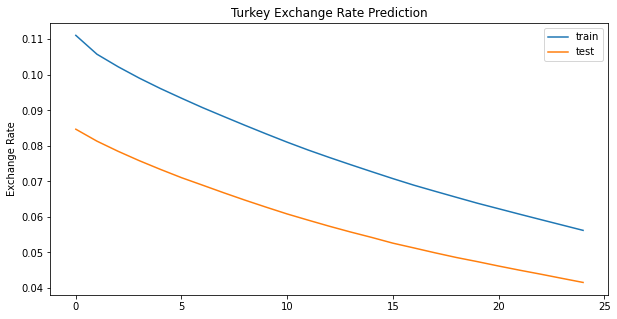

Result for LSTM Unit = 100, Batch Size = 20, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 36ms/step - loss: 7.7253e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



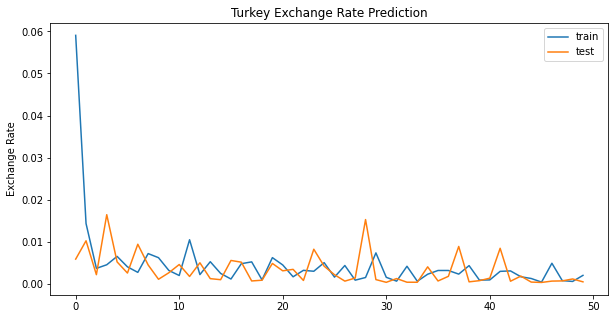

Result for LSTM Unit = 100, Batch Size = 20, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 28ms/step - loss: 8.1567e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



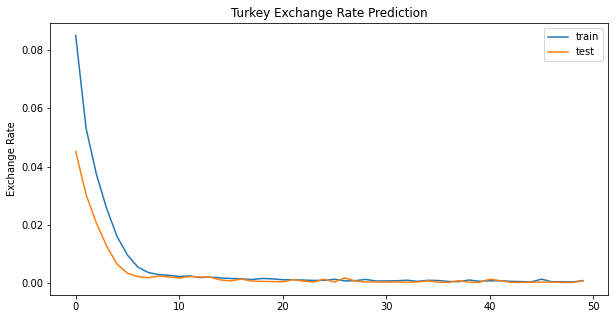

Result for LSTM Unit = 100, Batch Size = 20, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 33ms/step - loss: 0.0485 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.026 
Test Loss: 0.048



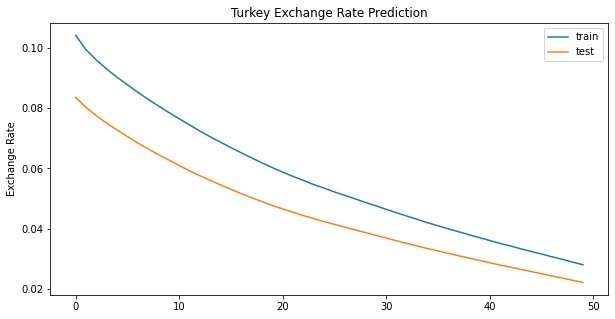

Result for LSTM Unit = 100, Batch Size = 20, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 29ms/step - loss: 5.5436e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



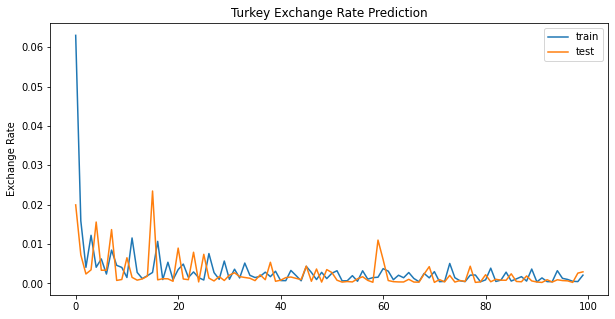

Result for LSTM Unit = 100, Batch Size = 20, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 31ms/step - loss: 7.0015e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



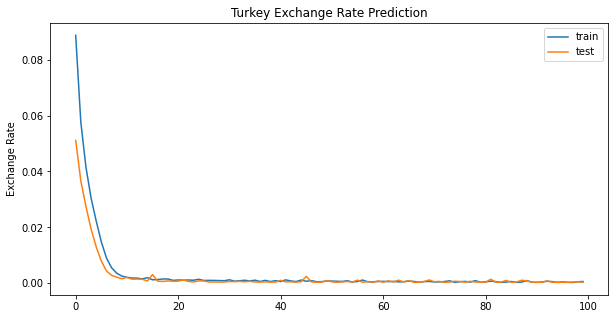

Result for LSTM Unit = 100, Batch Size = 20, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 27ms/step - loss: 0.0040 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.004



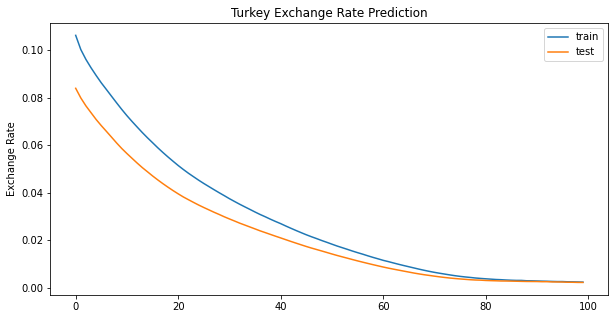

Result for LSTM Unit = 100, Batch Size = 20, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 32ms/step - loss: 5.4744e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



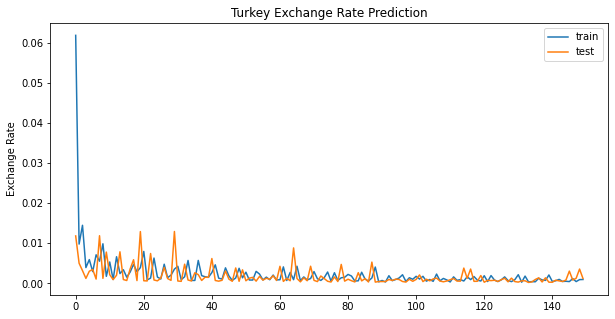

Result for LSTM Unit = 100, Batch Size = 20, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 32ms/step - loss: 5.8243e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



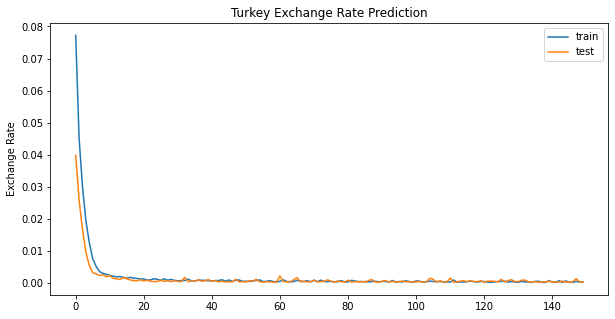

Result for LSTM Unit = 100, Batch Size = 20, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 33ms/step - loss: 0.0023 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



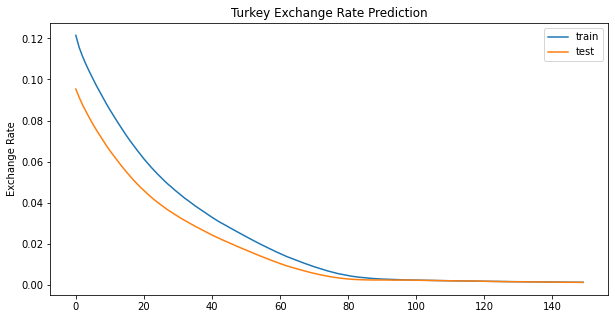

Result for LSTM Unit = 100, Batch Size = 20, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 28ms/step - loss: 4.6481e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



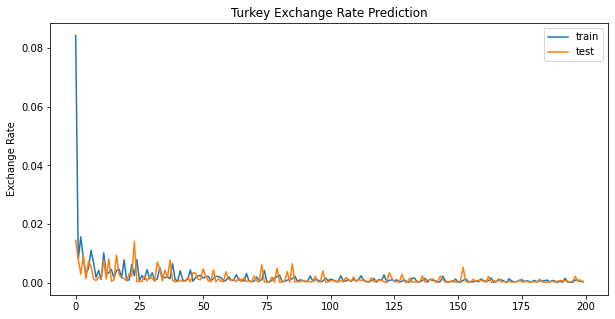

Result for LSTM Unit = 100, Batch Size = 20, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 31ms/step - loss: 4.6849e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



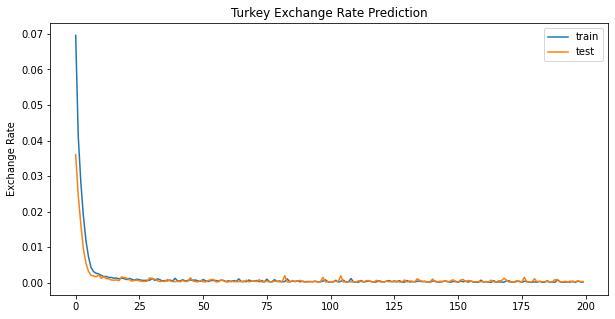

Result for LSTM Unit = 100, Batch Size = 20, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 32ms/step - loss: 0.0012 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



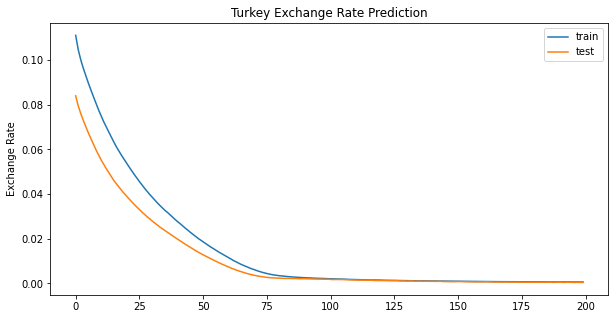

Result for LSTM Unit = 100, Batch Size = 20, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 28ms/step - loss: 4.0467e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.000



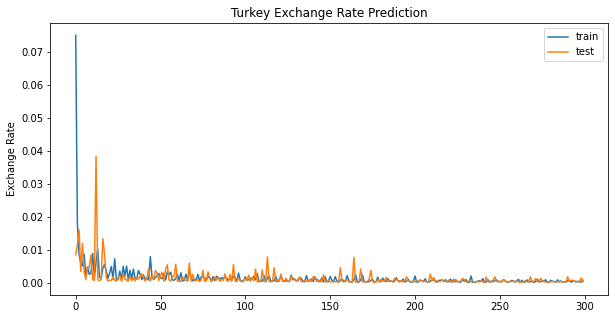

Result for LSTM Unit = 100, Batch Size = 20, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 29ms/step - loss: 6.2330e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



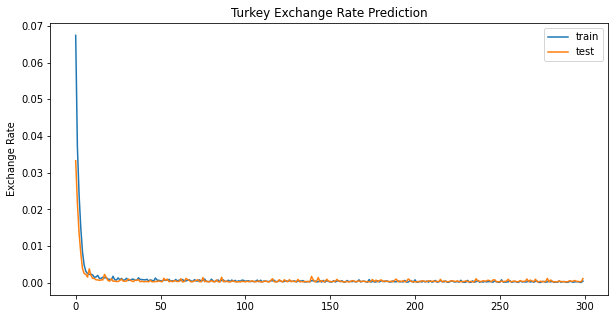

Result for LSTM Unit = 100, Batch Size = 20, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 32ms/step - loss: 8.7262e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



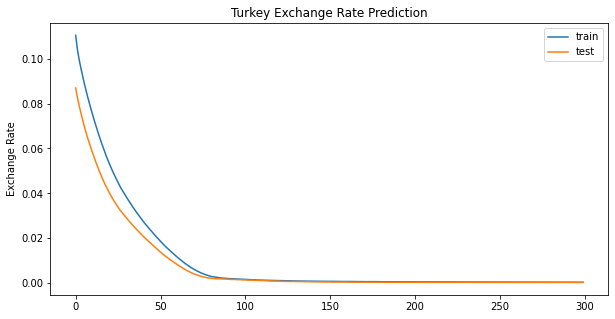

Result for LSTM Unit = 100, Batch Size = 50, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 30ms/step - loss: 0.0044 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.004



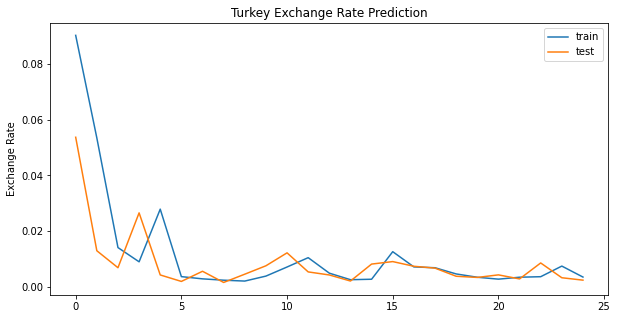

Result for LSTM Unit = 100, Batch Size = 50, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 31ms/step - loss: 0.0037 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.004



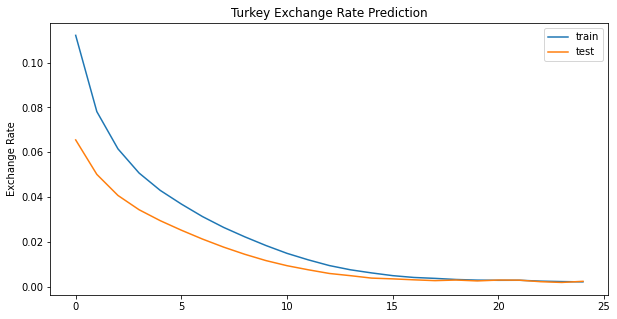

Result for LSTM Unit = 100, Batch Size = 50, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 37ms/step - loss: 0.1588 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.085 
Test Loss: 0.159



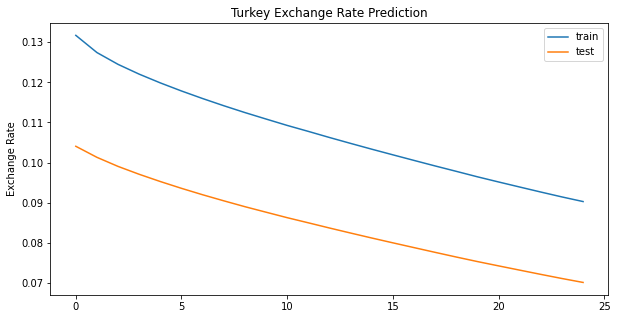

Result for LSTM Unit = 100, Batch Size = 50, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 30ms/step - loss: 0.0017 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



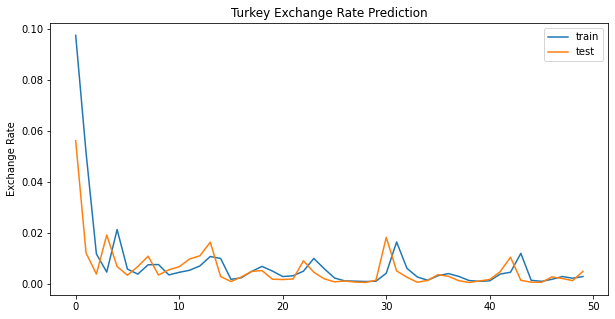

Result for LSTM Unit = 100, Batch Size = 50, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 36ms/step - loss: 0.0019 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



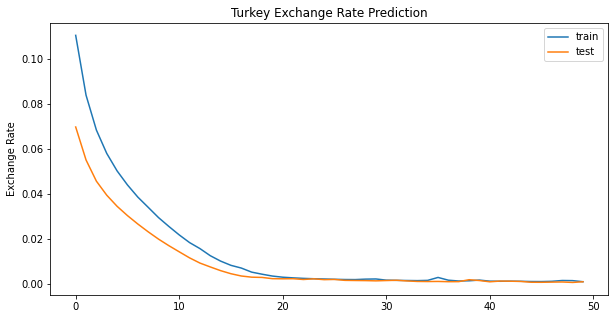

Result for LSTM Unit = 100, Batch Size = 50, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 26ms/step - loss: 0.1142 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.059 
Test Loss: 0.114



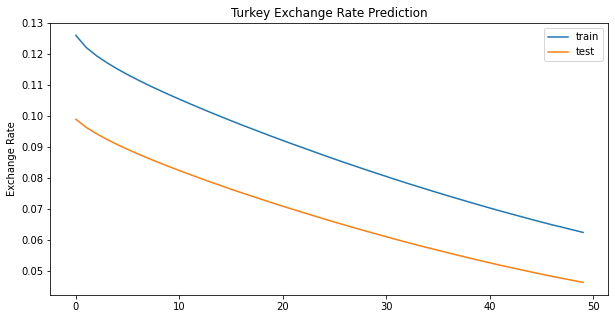

Result for LSTM Unit = 100, Batch Size = 50, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 29ms/step - loss: 0.0012 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



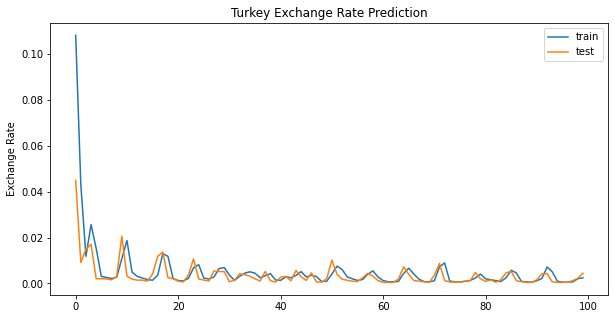

Result for LSTM Unit = 100, Batch Size = 50, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 26ms/step - loss: 8.5211e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



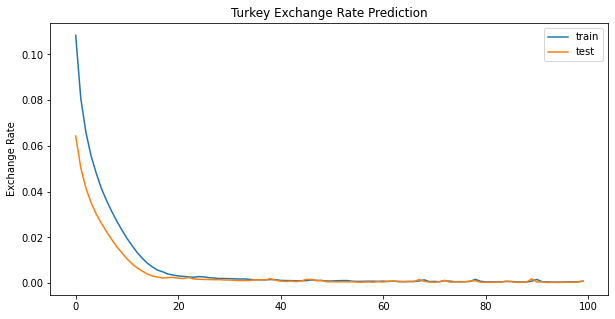

Result for LSTM Unit = 100, Batch Size = 50, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 32ms/step - loss: 0.0595 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.033 
Test Loss: 0.059



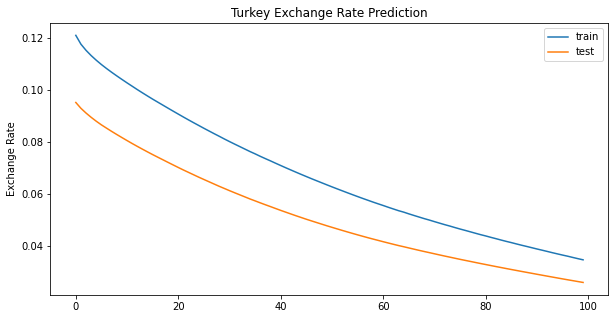

Result for LSTM Unit = 100, Batch Size = 50, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 31ms/step - loss: 9.7801e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



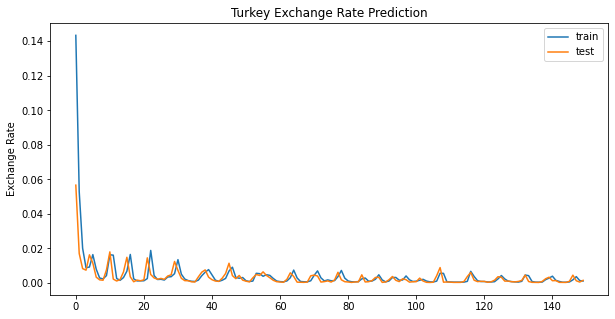

Result for LSTM Unit = 100, Batch Size = 50, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 32ms/step - loss: 9.0096e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



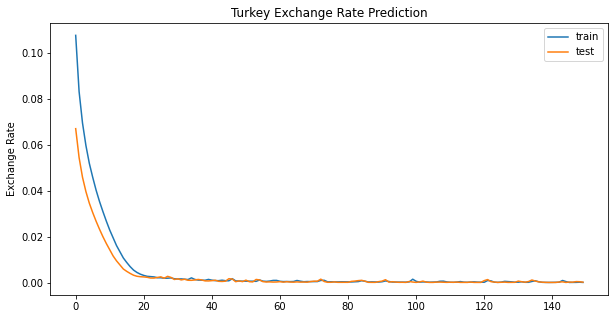

Result for LSTM Unit = 100, Batch Size = 50, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 35ms/step - loss: 0.0151 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.007 
Test Loss: 0.015



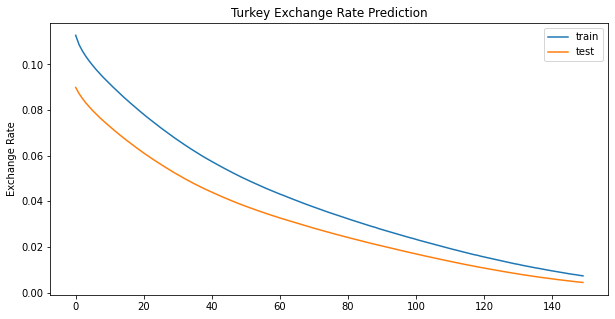

Result for LSTM Unit = 100, Batch Size = 50, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 28ms/step - loss: 6.9572e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



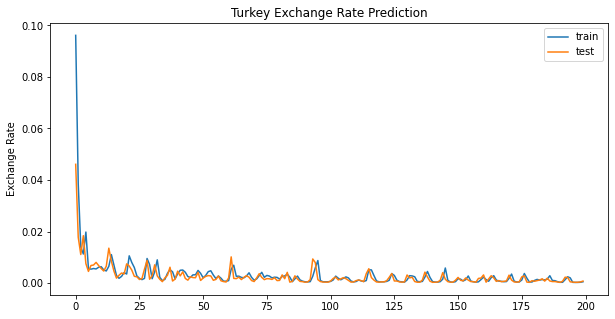

Result for LSTM Unit = 100, Batch Size = 50, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 28ms/step - loss: 6.4625e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



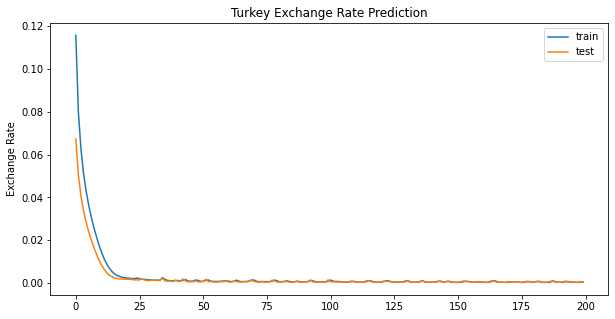

Result for LSTM Unit = 100, Batch Size = 50, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 42ms/step - loss: 0.0061 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.003 
Test Loss: 0.006



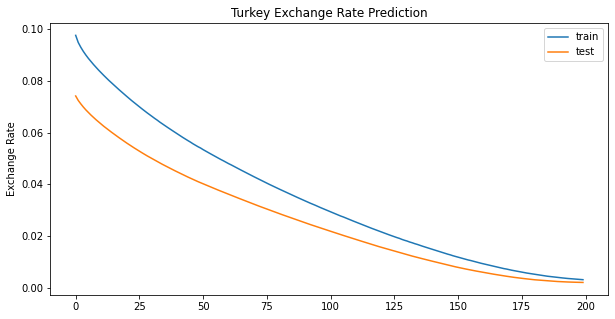

Result for LSTM Unit = 100, Batch Size = 50, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 30ms/step - loss: 5.2371e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



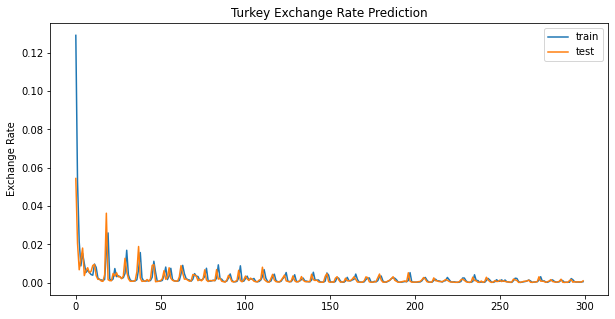

Result for LSTM Unit = 100, Batch Size = 50, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 28ms/step - loss: 7.5741e-04 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



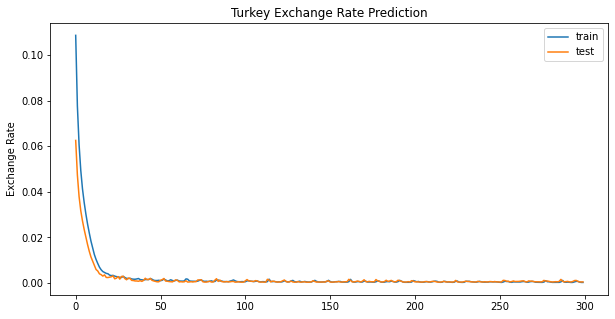

Result for LSTM Unit = 100, Batch Size = 50, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 33ms/step - loss: 0.0015 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



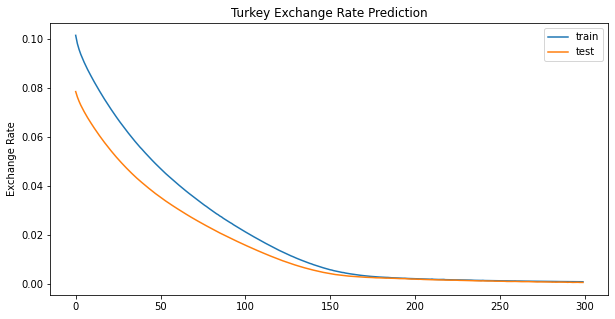

Result for LSTM Unit = 100, Batch Size = 100, Epoch = 25, Learning Rate = 0.001
1/1 [==============================] - 0s 31ms/step - loss: 0.0049 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.005



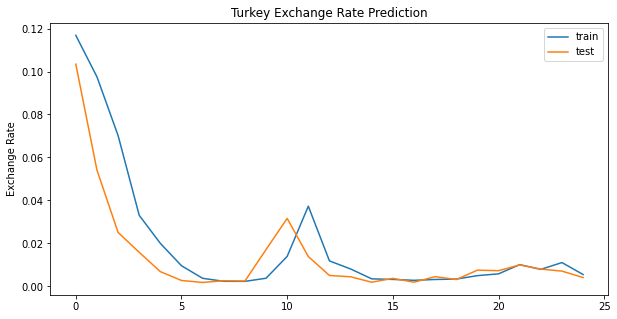

Result for LSTM Unit = 100, Batch Size = 100, Epoch = 25, Learning Rate = 0.0001
1/1 [==============================] - 0s 28ms/step - loss: 0.0114 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.005 
Test Loss: 0.011



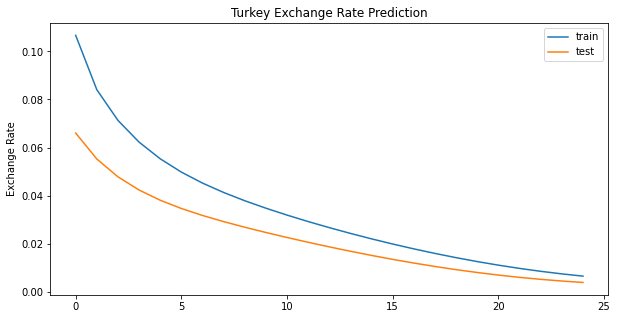

Result for LSTM Unit = 100, Batch Size = 100, Epoch = 25, Learning Rate = 1e-05
1/1 [==============================] - 0s 32ms/step - loss: 0.1649 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.087 
Test Loss: 0.165



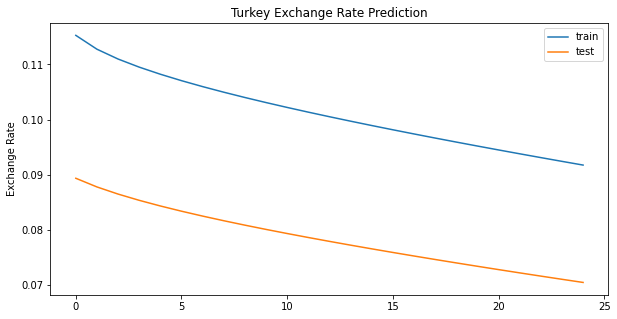

Result for LSTM Unit = 100, Batch Size = 100, Epoch = 50, Learning Rate = 0.001
1/1 [==============================] - 0s 38ms/step - loss: 0.0061 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.003 
Test Loss: 0.006



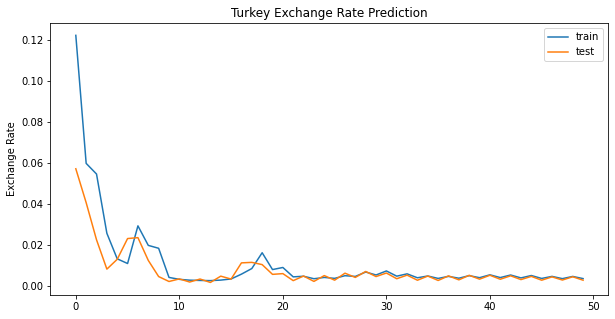

Result for LSTM Unit = 100, Batch Size = 100, Epoch = 50, Learning Rate = 0.0001
1/1 [==============================] - 0s 33ms/step - loss: 0.0020 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



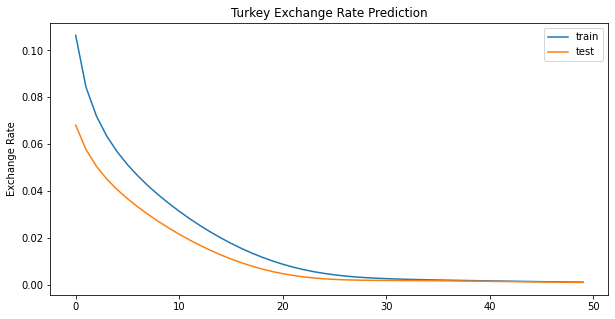

Result for LSTM Unit = 100, Batch Size = 100, Epoch = 50, Learning Rate = 1e-05
1/1 [==============================] - 0s 30ms/step - loss: 0.1484 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.079 
Test Loss: 0.148



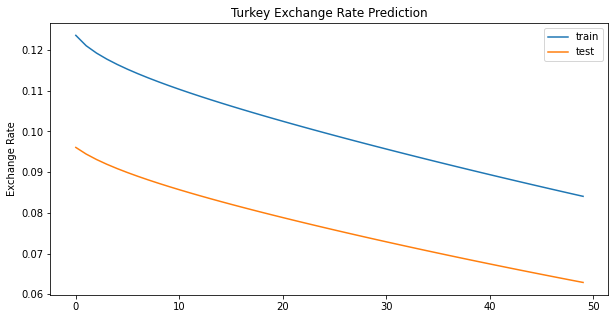

Result for LSTM Unit = 100, Batch Size = 100, Epoch = 100, Learning Rate = 0.001
1/1 [==============================] - 0s 37ms/step - loss: 0.0049 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.002 
Test Loss: 0.005



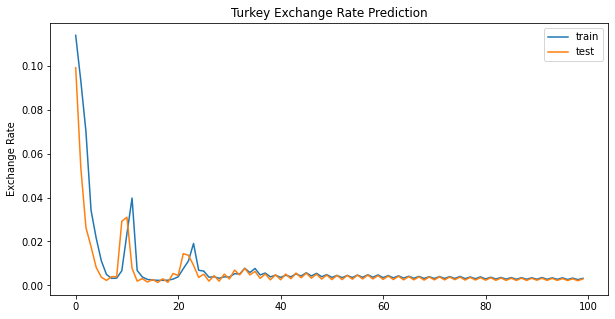

Result for LSTM Unit = 100, Batch Size = 100, Epoch = 100, Learning Rate = 0.0001
1/1 [==============================] - 0s 32ms/step - loss: 0.0014 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



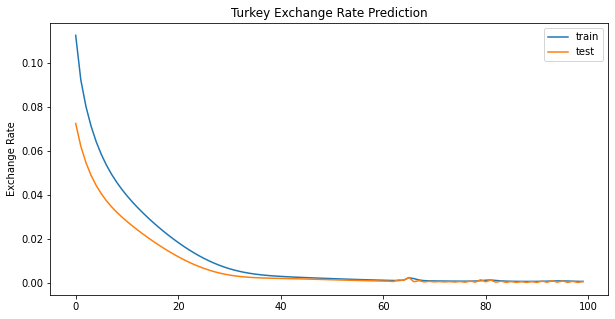

Result for LSTM Unit = 100, Batch Size = 100, Epoch = 100, Learning Rate = 1e-05
1/1 [==============================] - 0s 26ms/step - loss: 0.0924 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.048 
Test Loss: 0.092



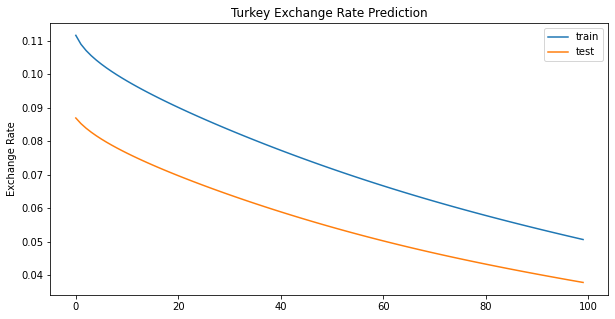

Result for LSTM Unit = 100, Batch Size = 100, Epoch = 150, Learning Rate = 0.001
1/1 [==============================] - 0s 30ms/step - loss: 0.0020 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



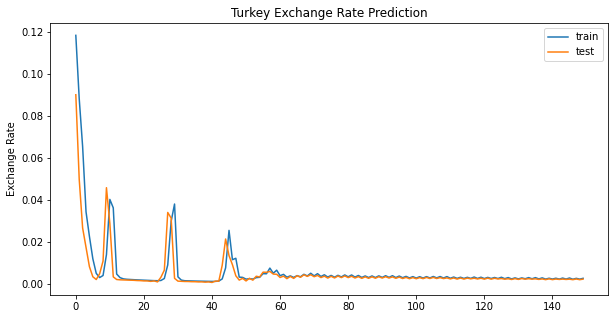

Result for LSTM Unit = 100, Batch Size = 100, Epoch = 150, Learning Rate = 0.0001
1/1 [==============================] - 0s 31ms/step - loss: 0.0017 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



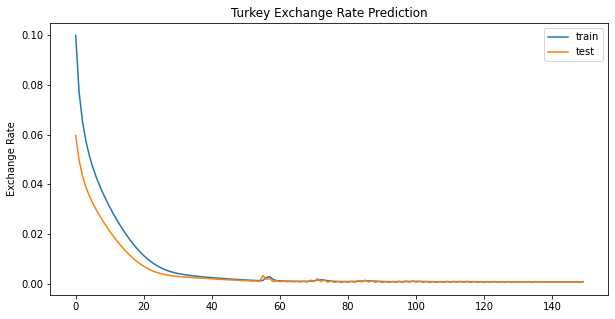

Result for LSTM Unit = 100, Batch Size = 100, Epoch = 150, Learning Rate = 1e-05
1/1 [==============================] - 0s 32ms/step - loss: 0.1020 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.052 
Test Loss: 0.102



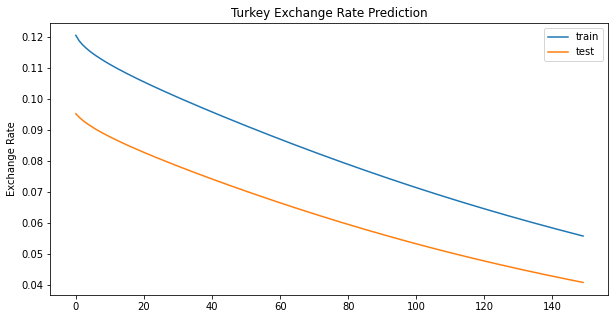

Result for LSTM Unit = 100, Batch Size = 100, Epoch = 200, Learning Rate = 0.001
1/1 [==============================] - 0s 29ms/step - loss: 0.0016 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



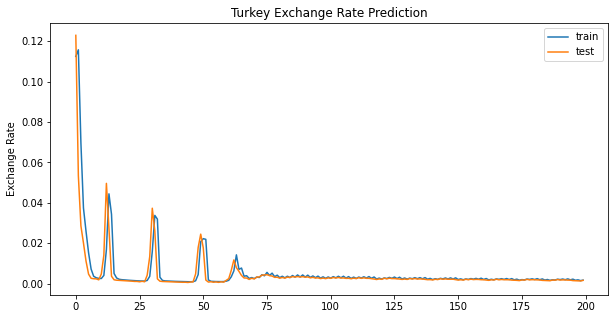

Result for LSTM Unit = 100, Batch Size = 100, Epoch = 200, Learning Rate = 0.0001
1/1 [==============================] - 0s 32ms/step - loss: 0.0014 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.001



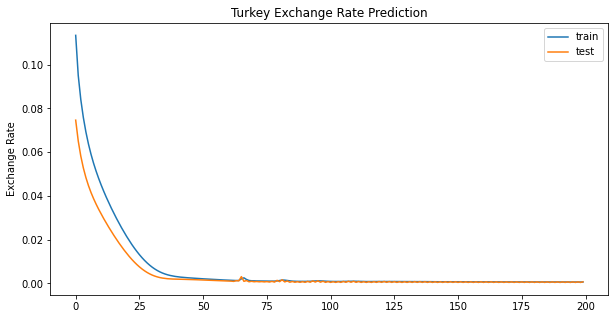

Result for LSTM Unit = 100, Batch Size = 100, Epoch = 200, Learning Rate = 1e-05
1/1 [==============================] - 0s 39ms/step - loss: 0.0483 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.026 
Test Loss: 0.048



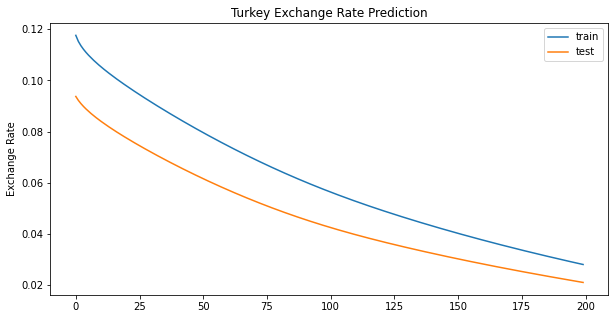

Result for LSTM Unit = 100, Batch Size = 100, Epoch = 300, Learning Rate = 0.001
1/1 [==============================] - 0s 33ms/step - loss: 0.0016 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.001 
Test Loss: 0.002



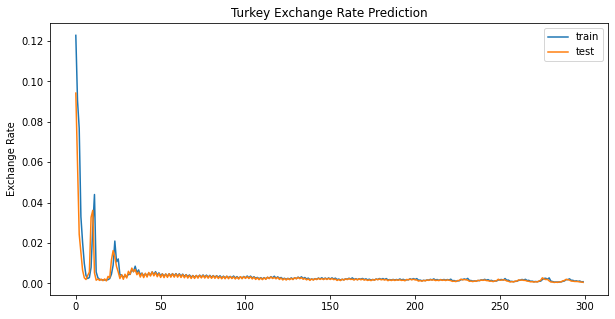

Result for LSTM Unit = 100, Batch Size = 100, Epoch = 300, Learning Rate = 0.0001
1/1 [==============================] - 0s 29ms/step - loss: 0.0013 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.000 
Test Loss: 0.001



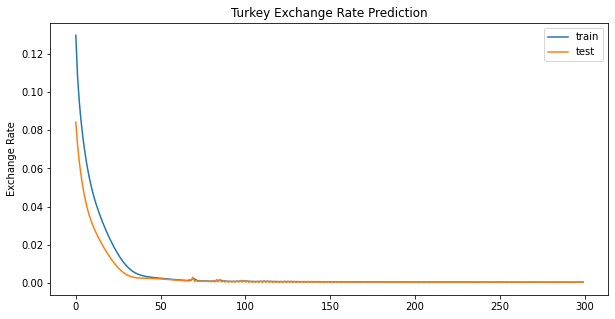

Result for LSTM Unit = 100, Batch Size = 100, Epoch = 300, Learning Rate = 1e-05
1/1 [==============================] - 0s 33ms/step - loss: 0.0168 - accuracy: 0.0000e+00



Evaluation on the best model
Train Loss: 0.007 
Test Loss: 0.017



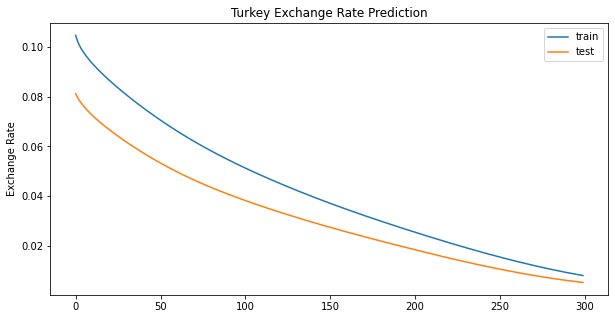

In [145]:
# Parameters to check
learning_rates = [1e-3, 1e-4, 1e-5]
batch_sizes = [10, 20, 50, 100]
epochs = [25, 50, 100, 150, 200, 300]
LSTM_units = [8, 16, 32, 50, 100]
saving_dir = "/content/drive/MyDrive/Seyda/"
X_train, X_val, y_train, y_val = train_test_split(X, Y,
                                                  test_size = 0.2,
                                                  random_state = 7)
# Container for saving the result
container = list()

# Looping to check the accuracy of each combination
for unit in LSTM_units:
  for size in batch_sizes:
    for epoch in epochs:
      for lr in learning_rates:
        result = dict()
        result['LSTM Unit'] = unit
        result['Batch Size'] = size
        result['Epoch'] = epoch
        result['lr'] = lr
        print("Result for LSTM Unit = {}, Batch Size = {}, Epoch = {}, Learning Rate = {}".format(unit, size, epoch, lr))
        train_acc, val_acc = grid_search(unit, lr, epoch, size, saving_dir, 
                                         X_train, X_val, y_train, y_val)
        result['Train Loss'] = train_acc
        result['Validation Loss'] = val_acc
        container.append(result)

# grid_search(50, 1e-3, 50, 10, saving_dir, X_train, X_val, y_train, y_val)

In [ ]:
container

In [146]:
def cv(n_splits, LSTM_unit, lr, epoch, batch_size, saving_dir,
       X, Y, seed):
  """
  This is the function to do cross validation from the hyperparameter tuning 
  that we already have
  Args:
    :n_split:     Number of cv split(int)
    :LSTM_unit:   Number of unit in LSTM model(int)
    :lr:          Learning Rate for the model
    :epoch:       Epoch for the model(int)
    :batch_size:  Batch size for the model
    :saving_dir:  Directory in which the model is saved(str)
    :X:           Feature set (np.ndarray)
    :Y:           Target label (np.ndarray)
    :seed:        seed for CV random state(int)
  """
  model_name = " ".join([str(LSTM_unit), str(lr), str(epoch), str(batch_size)])
  kfold = KFold(n_splits=n_splits, shuffle=True, random_state=seed)
  cvscores = []
  hist_pred = []
  hist_actual = []
  # Load the model model
  model = load_model(saving_dir+"{}.h5".format(model_name))
  for train, test in kfold.split(X, Y):
  # evaluate the model
    X[test] = np.array(X[test])
    X[test] = X[test].reshape((X[test].shape[0], 1, X[test].shape[-1]))
    predictions = model.predict(X[test])
    # print(predictions) 
    hist_pred.extend(predictions)
    hist_actual.extend(Y[test])
    scores = np.sqrt(np.mean((predictions - Y[test]**2)))
    cvscores.append(scores)
  print('CV-RMSE = {} with {} standard deviation'.format(np.mean(cvscores), 
                                                         np.std(cvscores)))


  hist_pred = label_scaler.inverse_transform(hist_pred)
  hist_actual = label_scaler.inverse_transform(hist_actual)

  #Plot/Create the data for the graph
  plt.figure(figsize=(10,5))
  plt.plot(hist_pred, color = 'green', label = 'Predictions')
  plt.plot(hist_actual, color = 'red', label = 'Real Value')
  plt.title('USD / TRY Exchange Rate Prediction (2005 - 2018)')

  plt.ylabel('Exchange Rate')
  plt.legend()
  plt.show()

CV-RMSE = 0.32158569116973196 with 0.018486444021100747 standard deviation


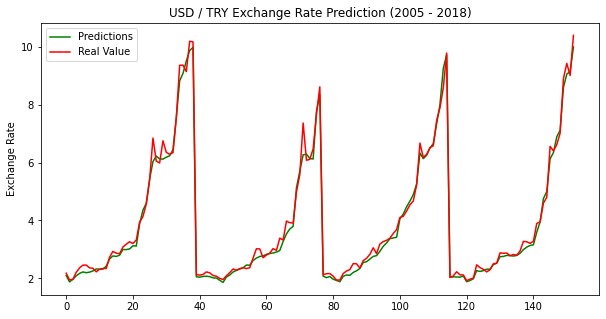

In [147]:
# This is to do cross validation for selected model
# Details of each params could be found in the function description
cv(4, 100, 1e-3, 150, 50, saving_dir, X, Y, 7)

In [148]:
def predict(LSTM_unit, lr, epoch, batch_size, saving_dir, features):
  """
  This function is used to make prediction out of the model that we already 
  trained with predefined features
  Args:
    :LSTM_unit:   Number of unit in LSTM model(int)
    :lr:          Learning Rate for the model
    :epoch:       Epoch for the model(int)
    :batch_size:  Batch size for the model
    :saving_dir:  Directory in which the model is saved(str)
    :features:    Features to make prediction on after scaller(np.array)
  Return:
    :label:       Transformed target (np.array)
  """
  model_name = " ".join([str(LSTM_unit), str(lr), str(epoch), str(batch_size)])
  model = load_model(saving_dir+"{}.h5".format(model_name))
  features = features.reshape((features.shape[0], 1, features.shape[-1]))
  predictions = model.predict(features)
  return label_scaler.inverse_transform(predictions)

# For instance, we want to predict the result based on the data in row number 55
predict(100, 1e-3, 300, 100, saving_dir, X[1])

array([[2.131741]], dtype=float32)

In [156]:
data2 = "kur4.csv" # For loading the data from local drive
df2 = pd.read_csv(data2,sep=",", thousands=',',index_col = 0 ) 
df2 = df2.dropna()
features1 = df2.drop('EURTRYav', axis=1)
label = df2['EURTRYav']

features_scaler3 = MinMaxScaler()
features2 = features_scaler3.fit_transform(features1)
features2 = features2.reshape(features2.shape[0], 1, features2.shape[1])

# If you later on have a new data

#features = df1.drop(['Unemployment', "X1"], axis=1)
#labels = df1['Unemployment']

#df1 = features_scaler.transform(features)
#df1 = df1.reshape(df1.shape[0], 1, df1.shape[1])


label_scaler3 = MinMaxScaler()
label2 = label.values.reshape(-1, 1)
label2 = label_scaler3.fit_transform(label2)

# If you later on have a new label
#df1 = new_label.values.reshape(-1, 1)
#df1 = label_scaler.transform(new_label)

In [ ]:

def predict(LSTM_unit, lr, epoch, batch_size, saving_dir, features):
  """
  This function is used to make prediction out of the model that we already 
  trained with predefined features
  Args:
    :LSTM_unit:   Number of unit in LSTM model(int)
    :lr:          Learning Rate for the model
    :epoch:       Epoch for the model(int)
    :batch_size:  Batch size for the model
    :saving_dir:  Directory in which the model is saved(str)
    :features:    Features to make prediction on after scaller(np.array)
  Return:
    :label:       Transformed target (np.array)
  """
  model_name = " ".join([str(LSTM_unit), str(lr), str(epoch), str(batch_size)])
  model = load_model(saving_dir+"{}.h5".format(model_name))
  features = features2.reshape((features2.shape[0], 1, features2.shape[-1]))
  result=model.predict(features)

  return label_scaler.inverse_transform(result)

# For instance, we want to predict the result based on the data in row number 55
prediction = predict(50, 1e-3, 50, 10, saving_dir, features)
df2["EURTRYPre"]=prediction
display(prediction)

In [126]:
df

,USDTRYav,EURTRYav,EURUSDav,BIST100av,TR2YTav,BRENTav,WTIav,Altinav,Gumusav,UFE,TUGE,Cari_Denge,Issizlik,X1...15,X2...16,X1...17,X2...18,X1...19,X2...20,X1...21,X2...22,X1...23,X2...24,X1...25,X2...26,X1...27,X2...28,X1...29,X2...30,X1...31,X2...32,X1...33,X2...34,X1...35,X2...36,X1...37,X2...38,X1...39,X2...40
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2006/03,1.331973,1.613818,1.211809,445.137587,14.248500,59.626848,60.671225,549.956818,9.154091,5.11,7.93,-2.435000e+09,9.5,1.350427,1.356741,1.601609,1.599923,1.185777,1.179468,384.895427,384.895427,14.451364,14.451364,60.320762,56.225000,62.046036,58.376364,509.131818,477.302273,8.625000,7.887727,2.66,1.60,7.72,7.61,-3.739000e+09,-2.554000e+09,9.7,9.8
2006/04,1.323910,1.580230,1.193910,453.663090,14.238000,61.142000,61.823500,554.977500,9.516000,5.26,8.15,-3.223000e+09,9.6,1.331973,1.350427,1.613818,1.601609,1.211809,1.185777,445.137587,384.895427,14.248500,14.451364,59.626848,60.320762,60.671225,62.046036,549.956818,509.131818,9.154091,8.625000,5.11,2.66,7.93,7.72,-2.435000e+09,-3.739000e+09,9.5,9.7
2006/05,1.334648,1.606430,1.203083,439.723330,14.177391,63.028696,62.966087,557.926087,10.425217,4.21,8.16,-3.054000e+09,9.2,1.323910,1.331973,1.580230,1.613818,1.193910,1.211809,453.663090,445.137587,14.238000,14.248500,61.142000,59.626848,61.823500,60.671225,554.977500,549.956818,9.516000,9.154091,5.26,5.11,8.15,7.93,-3.223000e+09,-2.435000e+09,9.6,9.5
2006/06,1.334450,1.638175,1.228265,436.612085,14.259000,65.460318,66.396523,611.550000,12.687000,4.96,8.83,-3.745000e+09,9.2,1.334648,1.323910,1.606430,1.580230,1.203083,1.193910,439.723330,453.663090,14.177391,14.238000,63.028696,61.142000,62.966087,61.823500,557.926087,554.977500,10.425217,9.516000,4.21,5.26,8.16,8.15,-3.054000e+09,-3.223000e+09,9.2,9.6
2006/07,1.438174,1.836409,1.276983,350.336395,21.370996,68.644586,68.689234,673.217391,13.387391,7.66,9.86,-4.035000e+09,8.8,1.334450,1.334648,1.638175,1.606430,1.228265,1.203083,436.612085,439.723330,14.259000,14.177391,65.460318,63.028696,66.396523,62.966087,611.550000,557.926087,12.687000,10.425217,4.96,4.21,8.83,8.16,-3.745000e+09,-3.054000e+09,9.2,9.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021/03,7.395690,9.004471,1.217205,1510.434370,15.587380,54.841087,51.955839,1866.251852,25.897252,26.16,14.97,-1.778000e+09,12.7,7.690870,7.959905,9.362074,9.423281,1.217135,1.183533,1389.367391,1263.839524,14.185652,13.844762,51.902795,43.980000,49.318023,41.554286,1860.127122,1865.445824,25.063048,24.050781,25.15,23.11,14.60,14.03,-3.630000e+09,-3.564000e+09,12.7,13.0
2021/04,7.091060,8.578255,1.209275,1528.667000,14.416500,62.281500,59.081500,1808.086720,27.273540,27.09,15.61,-2.503000e+09,13.2,7.395690,7.690870,9.004471,9.362074,1.217205,1.217135,1510.434370,1389.367391,15.587380,14.185652,54.841087,51.902795,51.955839,49.318023,1866.251852,1860.127122,25.897252,25.063048,26.16,25.15,14.97,14.60,-1.778000e+09,-3.630000e+09,12.7,12.7
2021/05,7.676813,9.136917,1.189839,1492.201739,16.758261,65.702174,62.357391,1721.405896,25.604726,31.20,16.19,-3.296000e+09,13.0,7.091060,7.395690,8.578255,9.004471,1.209275,1.217205,1528.667000,1510.434370,14.416500,15.587380,62.281500,54.841087,59.081500,51.955839,1808.086720,1866.251852,27.273540,25.897252,27.09,26.16,15.61,14.97,-2.503000e+09,-1.778000e+09,13.2,12.7


In [127]:
df2

,USDTRYav,EURTRYav,EURUSDav,BIST100av,TR2YTav,BRENTav,WTIav,Altinav,Gumusav,UFE,TUGE,Cari_Denge,Issizlik,X1...15,X2...16,X1...17,X2...18,X1...19,X2...20,X1...21,X2...22,X1...23,X2...24,X1...25,X2...26,X1...27,X2...28,X1...29,X2...30,X1...31,X2...32,X1...33,X2...34,X1...35,X2...36,X1...37,X2...38,X1...39,X2...40,EURTRYPre
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2006/01,1.331973,1.613818,1.211809,445.137587,14.248500,59.626848,60.671225,549.956818,9.154091,5.11,7.93,-2.435000e+09,9.50,1.350427,1.356741,1.601609,1.599923,1.185777,1.179468,384.895427,384.895427,14.451364,14.451364,60.320762,56.225000,62.046036,58.376364,509.131818,477.302273,8.625000,7.887727,2.66,1.60,7.72,7.61,-3.739000e+09,-2.554000e+09,9.7,9.8,1.680717
2006/02,1.323910,1.580230,1.193910,453.663090,14.238000,61.142000,61.823500,554.977500,9.516000,5.26,8.15,-3.223000e+09,9.60,1.331973,1.350427,1.613818,1.601609,1.211809,1.185777,445.137587,384.895427,14.248500,14.451364,59.626848,60.320762,60.671225,62.046036,549.956818,509.131818,9.154091,8.625000,5.11,2.66,7.93,7.72,-2.435000e+09,-3.739000e+09,9.5,9.7,1.687197
2006/03,1.334648,1.606430,1.203083,439.723330,14.177391,63.028696,62.966087,557.926087,10.425217,4.21,8.16,-3.054000e+09,9.20,1.323910,1.331973,1.580230,1.613818,1.193910,1.211809,453.663090,445.137587,14.238000,14.248500,61.142000,59.626848,61.823500,60.671225,554.977500,549.956818,9.516000,9.154091,5.26,5.11,8.15,7.93,-3.223000e+09,-2.435000e+09,9.6,9.5,1.677195
2006/04,1.334450,1.638175,1.228265,436.612085,14.259000,65.460318,66.396523,611.550000,12.687000,4.96,8.83,-3.745000e+09,9.20,1.334648,1.323910,1.606430,1.580230,1.203083,1.193910,439.723330,453.663090,14.177391,14.238000,63.028696,61.142000,62.966087,61.823500,557.926087,554.977500,10.425217,9.516000,4.21,5.26,8.16,8.15,-3.054000e+09,-3.223000e+09,9.2,9.6,1.692171
2006/05,1.438174,1.836409,1.276983,350.336395,21.370996,68.644586,68.689234,673.217391,13.387391,7.66,9.86,-4.035000e+09,8.80,1.334450,1.334648,1.638175,1.606430,1.228265,1.203083,436.612085,439.723330,14.259000,14.177391,65.460318,63.028696,66.396523,62.966087,611.550000,557.926087,12.687000,10.425217,4.96,4.21,8.83,8.16,-3.745000e+09,-3.054000e+09,9.2,9.2,1.896888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021/03,7.676813,9.136917,1.189839,1492.201739,16.758261,65.702174,62.357391,1721.405896,25.604726,31.20,16.19,-3.296000e+09,13.00,7.091060,7.395690,8.578255,9.004471,1.209275,1.217205,1528.667000,1510.434370,14.416500,15.587380,62.281500,54.841087,59.081500,51.955839,1808.086720,1866.251852,27.273540,25.897252,27.09,26.16,15.61,14.97,-2.503000e+09,-1.778000e+09,13.2,12.7,9.254637
2021/04,8.158609,9.779495,1.196941,1474.178273,16.153705,67.005611,63.784886,1759.017968,25.646300,35.17,17.14,-1.693000e+09,13.80,7.676813,7.091060,9.136917,8.578255,1.189839,1.209275,1492.201739,1528.667000,16.758261,14.416500,65.702174,62.281500,62.357391,59.081500,1721.405896,1808.086720,25.604726,27.273540,31.20,27.09,16.19,15.61,-3.296000e+09,-2.503000e+09,13.0,13.2,9.495222
2021/05,8.377124,10.186362,1.214652,1419.689545,17.890909,68.309048,65.212381,1852.489986,27.510300,38.33,16.59,-3.081000e+09,13.20,8.158609,7.676813,9.779495,9.136917,1.196941,1.189839,1474.178273,1492.201739,16.153705,16.758261,67.005611,65.702174,63.784886,62.357391,1759.017968,1721.405896,25.646300,25.604726,35.17,31.20,17.14,16.19,-1.693000e+09,-3.296000e+09,13.8,13.0,9.814071


In [ ]:
def predict(LSTM_unit, lr, epoch, batch_size, saving_dir, features):
  """
  This function is used to make prediction out of the model that we already 
  trained with predefined features
  Args:
    :LSTM_unit:   Number of unit in LSTM model(int)
    :lr:          Learning Rate for the model
    :epoch:       Epoch for the model(int)
    :batch_size:  Batch size for the model
    :saving_dir:  Directory in which the model is saved(str)
    :features:    Features to make prediction on after scaller(np.array)
  Return:
    :label:       Transformed target (np.array)
  """
  model_name = " ".join([str(LSTM_unit), str(lr), str(epoch), str(batch_size)])
  model = load_model(saving_dir+"{}.h5".format(model_name))
  features = features.reshape((features.shape[0], 1, features.shape[-1]))# bu x'i features diye tanımladıgında çalışır
  #features = X.reshape((X.shape[0], 1, X.shape[-1]))
  result=model.predict(features)

  return label_scaler.inverse_transform(result)

# For instance, we want to predict the result based on the data in row number 55
prediction = predict(50, 1e-3, 50, 10, saving_dir, df2)
features["exchange"]=prediction
display(features)

In [129]:
from google.colab import files
df2.to_csv('df2_t.csv') 
files.download('df2_t.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

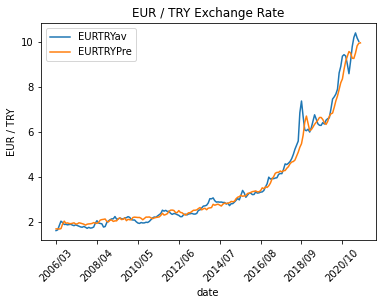

In [139]:
data3 = "son.csv" 
df3 = pd.read_csv(data3,sep=",", thousands=',' )
df3=df3.sort_values(by="date") 
df3.plot(x="date", y=["EURTRYav","EURTRYPre"], kind="line", rot=45)
plt.title('EUR / TRY Exchange Rate')
plt.ylabel('EUR / TRY')
plt.show()

In [135]:
df3

,EURTRYav,EURTRYPre
date,,
2006/03,1.606430,1.680717
2006/04,1.638175,1.687197
2006/05,1.836409,1.677195
2006/06,2.024855,1.692171
2006/07,1.963838,1.896888
...,...,...
2021/05,10.186362,9.254637
2021/06,10.389355,9.495222
2021/07,10.165318,9.814071
